# Table of Contents
* [Configuration](#Configuration)
* [Preamble](#Preamble)
* [Load TNPS data by MSISDN](#Load-TNPS-data-by-MSISDN)
* [Load TNPS data by NIF](#Load-TNPS-data-by-NIF)
* [Load Call Centre Calls data by MSISDN](#Load-Call-Centre-Calls-data-by-MSISDN)
* [Load Call Centre Calls data by NIF](#Load-Call-Centre-Calls-data-by-NIF)
* [TNPS Amdocs stack](#TNPS-Amdocs-stack)
* [Load TNPS predictions Oracle stack](#Load-TNPS-predictions-Oracle-stack)
* [TNPS metamodel](#TNPS-metamodel)
* [Write TNPS predictions](#Write-TNPS-predictions)
* [TNPS to NPS model](#TNPS-to-NPS-model)
* [Write NPS predictions](#Write-NPS-predictions)
* [Plancas Detractores](#Palancas-Detractores)
* [Impact of Incidences on Detractors](#Impact-of-Incidences-on-Detractors)

# Configuration

In [1]:
# Configuration
filter_month = 201808 # This model is delivered on a monthly basis
#label_preds = 'tnps_TNPS4' # This is the final column that we want for predictions
label_preds = 'tnps_TNPS2HDET' # This is the final column that we want for predictions

# label_model: This the label used to store different datasets/models
# target_col: This is the column used for training the model, and making predictions
# ouput_col: Among the different available levels of the target column chosen, this the level used for the prediction
# filter_cond: If a condition is needed to select/filter only specific levels of the target column

# Hard Detractors vs Non-Hard Detractors
label_model = 'HardDetNonHardDet'
target_col = 'tnps_TNPS2HDET'
ouput_col = 'NON HARD DETRACTOR'
filter_cond = None

# Detractors vs Non-Detractors
#label_model = 'DetNonDet'
#target_col = 'tnps_TNPS2DET'
#ouput_col = 'NON DETRACTOR'
#filter_cond = None

# Promoters vs Non-Promoters
#label_model = 'ProNonPro'
#target_col = 'tnps_TNPS2PRO'
#ouput_col = 'PROMOTER'
#filter_cond = None

# Promoters vs Detractors
#label_model = 'ProDet'
#target_col = 'tnps_TNPS'
#ouput_col = 'PROMOTER'
#filter_cond = 'tnps_TNPS == "PROMOTER" OR tnps_TNPS == "DETRACTOR"'

# Promoters vs Hard Detractors
#label_model = 'ProHardDet'
#target_col = 'tnps_TNPS4'
#ouput_col = 'PROMOTER'
#filter_cond = 'tnps_TNPS4 == "PROMOTER" OR tnps_TNPS4 == "HARD DETRACTOR"'

# Multiclass (3 classes)
#label_model = 'Multi3'
#target_col = 'tnps_TNPS'
#ouput_col = '???'
#filter_cond = None

# Multiclass (4 classes)
#label_model = 'Multi4'
#target_col = 'tnps_TNPS4'
#ouput_col = '???'
#filter_cond = None

# Multiclass (11 classes)
#label_model = 'Multi01'
#target_col = 'tnps_TNPS01'
#ouput_col = '???'
#filter_cond = None

# Regression
#label_model = 'Regre01'
#target_col = 'tnps_TNPS01'
#ouput_col = '???'
#filter_cond = None

max_runtime_secs = 60
#max_runtime_secs = 3600

In [2]:
%load_ext autoreload
%autoreload 2

import re
import subprocess
import sys
import time

from IPython.display import HTML, display
import tabulate

import matplotlib.pyplot as plt
%matplotlib inline

# Preamble

In [3]:
'''
# Run this on the shell to start Jupyter Notebook
kinit ${USER}@INTERNAL.VODAFONE.COM -k -t .ssh/${USER}.keytab
klist

export BDA_USER_HOME=/var/SP/data/home/${USER}

. ${BDA_USER_HOME}/scripts/properties/common.sh
cd ${BDA_USER_HOME}

ipython notebook --port=65011 --no-browser --ip=127.0.0.1
'''

'\n# Run this on the shell to start Jupyter Notebook\nkinit ${USER}@INTERNAL.VODAFONE.COM -k -t .ssh/${USER}.keytab\nklist\n\nexport BDA_USER_HOME=/var/SP/data/home/${USER}\n\n. ${BDA_USER_HOME}/scripts/properties/common.sh\ncd ${BDA_USER_HOME}\n\nipython notebook --port=65011 --no-browser --ip=127.0.0.1\n'

In [4]:
from common.src.main.python.utils.hdfs_generic import *
import os

MAX_N_EXECUTORS=32
MIN_N_EXECUTORS=1
N_CORES_EXECUTOR=4
EXECUTOR_IDLE_MAX_TIME=120
EXECUTOR_MEMORY='16g'
DRIVER_MEMORY='16g'
N_CORES_DRIVER=1
MEMORY_OVERHEAD=N_CORES_EXECUTOR*2048
#QUEUE='root.datascience.normal'
QUEUE='root.default'
BDA_CORE_VERSION='1.0.0'

# The default directory is chosen from a platform-dependent list, but the user of the 
# application can control the directory location by setting the TMPDIR, TEMP or TMP 
# environment variables.
USER=os.environ.get('USER', '')
os.environ['TMPDIR'] = '/var/SP/data/home/'+USER+'/tmp/'
#os.environ['TEMP'] = '/var/SP/data/home/'+USER+'/tmp/'
#os.environ['TMP'] = '/var/SP/data/home/'+USER+'/tmp/'
import tempfile
print 'Default Temp dir:', tempfile.gettempdir() # prints the current temporary directory

SPARK_COMMON_OPTS=os.environ.get('SPARK_COMMON_OPTS', '')
SPARK_COMMON_OPTS+=" --executor-memory %s --driver-memory %s" % (EXECUTOR_MEMORY, DRIVER_MEMORY)
SPARK_COMMON_OPTS+=" --conf spark.port.maxRetries=50"
SPARK_COMMON_OPTS+=" --conf spark.shuffle.manager=tungsten-sort"
SPARK_COMMON_OPTS+=" --queue %s" % QUEUE

# Dynamic allocation configuration
SPARK_COMMON_OPTS+=" --conf spark.shuffle.service.enabled=true"
SPARK_COMMON_OPTS+=" --conf spark.dynamicAllocation.enabled=true"
SPARK_COMMON_OPTS+=" --conf spark.dynamicAllocation.maxExecutors=%s" % (MAX_N_EXECUTORS)
SPARK_COMMON_OPTS+=" --conf spark.dynamicAllocation.minExecutors=%s" % (MIN_N_EXECUTORS)
SPARK_COMMON_OPTS+=" --conf spark.dynamicAllocation.executorIdleTimeout=%s" % (EXECUTOR_IDLE_MAX_TIME)

BDA_ENV = os.environ.get('BDA_USER_HOME', '')

# Attach bda-core-ra codebase
import re
SPARK_COMMON_OPTS+=re.sub('[\s]+{}', ' {}', re.sub(',[\s]+{}', ',{}', # This to remove spurious white spaces and tabs
                    " --files \
                    {}/scripts/properties/red_agent/nodes.properties,\
                    {}/scripts/properties/red_agent/nodes-de.properties,\
                    {}/scripts/properties/red_agent/nodes-es.properties,\
                    {}/scripts/properties/red_agent/nodes-ie.properties,\
                    {}/scripts/properties/red_agent/nodes-it.properties,\
                    {}/scripts/properties/red_agent/nodes-pt.properties,\
                    {}/scripts/properties/red_agent/nodes-uk.properties")).format(*[BDA_ENV]*7)

os.environ["SPARK_COMMON_OPTS"] = SPARK_COMMON_OPTS
os.environ["PYSPARK_SUBMIT_ARGS"] = "%s pyspark-shell " % SPARK_COMMON_OPTS

#print os.environ.get('SPARK_COMMON_OPTS', '')
#print os.environ.get('PYSPARK_SUBMIT_ARGS', '')

sc, sparkSession, sqlContext = run_sc()

import time
print time.ctime()

print sc.defaultParallelism

Default Temp dir: /var/SP/data/home/bbergua/tmp
Wed Aug 22 12:26:37 2018
2


In [5]:
# Spark utils
from pyspark.sql.functions import array_contains, bround, col, collect_set, concat, dayofmonth, lit, lpad, min as sql_min, month, size, struct, translate, trim, udf, when, year
from pyspark.sql.types import DoubleType, IntegerType, StringType, StructField, StructType

In [6]:
spark = (SparkSession.builder
         .appName("VF-ES Jupyter Customer Experience")
         .master("yarn")
         .config("spark.submit.deployMode", "client")
         .config("spark.ui.showConsoleProgress", "true")
         .enableHiveSupport()
         .getOrCreate()
         )
print 'Spark version:', spark.version

Spark version: 2.1.0.cloudera1


In [18]:
#spark.stop()

In [3]:
import h2o
from h2o.backend.connection import H2OConnectionError
#if h2o.cluster() is not None:
#    print 'Stopping H2O'
#    h2o.cluster().shutdown()
#if h2o.cluster() is not None:
#    print 'Stopping H2O'
#    h2o.cluster().shutdown()
try:
    #h2o.cluster().show_status()
    h2o.cluster().shutdown()
    print 'Stopped running H2O instance'
except H2OConnectionError as e:
    print e
except Exception as e:
    print e

'NoneType' object has no attribute 'shutdown'


In [92]:
import h2o
from h2o.backend.connection import H2OConnectionError
#if h2o.cluster() is not None:
#    print 'Stopping H2O'
#    h2o.cluster().shutdown()
#if h2o.cluster() is not None:
#    print 'Stopping H2O'
#    h2o.cluster().shutdown()
try:
    #h2o.cluster().show_status()
    h2o.cluster().shutdown()
    print 'Stopped running H2O instance'
except H2OConnectionError as e:
    print e
except Exception as e:
    print e

Stopped running H2O instance


In [ ]:
#h2o.shutdown()
#h2o.cluster().shutdown(prompt=True) 

In [7]:
# /opt/SP/sparkling-water-2.1.21/bin/pysparkling --num-executors 4 --executor-memory 2g --master yarn-client --queue root.datascience.normal
'''
import h2o
from pysparkling import *
hc = H2OContext.getOrCreate(spark)
'''
import h2o
#h2o.init(ip='10.109.120.122', port=54321, nthreads = -1, max_mem_size = "14G")

# ps -efww | grep h2o
h2o.init()
#h2o.init(nthreads = 1024)
#h2o.init(nthreads = -1, min_mem_size = "28G")
#h2o.init(nthreads = -1, min_mem_size = "28G", max_mem_size = "56G")
#h2o.init(nthreads = -1, max_mem_size = "56G")
#h2o.init(nthreads = -1, max_mem_size = "14G")
#h2o.cluster().show_status()

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: java version "1.7.0_79"; Java(TM) SE Runtime Environment (build 1.7.0_79-b15); Java HotSpot(TM) 64-Bit Server VM (build 24.79-b02, mixed mode)
  Starting server from /opt/cloudera/parcels/Anaconda-2.5.0/lib/python2.7/site-packages/h2o/backend/bin/h2o.jar
  Ice root: /var/SP/data/home/bbergua/tmp/tmpG5nIkk
  JVM stdout: /var/SP/data/home/bbergua/tmp/tmpG5nIkk/h2o_bbergua_started_from_python.out
  JVM stderr: /var/SP/data/home/bbergua/tmp/tmpG5nIkk/h2o_bbergua_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321... successful.


H2O cluster uptime:,03 secs
H2O cluster version:,3.16.0.4
H2O cluster version age:,6 months and 30 days !!!
H2O cluster name:,H2O_from_python_bbergua_c2w0eg
H2O cluster total nodes:,1
H2O cluster free memory:,26.60 Gb
H2O cluster total cores:,56
H2O cluster allowed cores:,56
H2O cluster status:,"accepting new members, healthy"
H2O connection url:,http://127.0.0.1:54321
H2O connection proxy:,None


In [29]:
#h2o.remove_all()

In [ ]:
import h2o
from h2o.backend.connection import H2OConnectionError
try:
    h2o.cluster().show_status()
except H2OConnectionError as e:
    print e

Define some useful functions

In [7]:
# Replace column names of the type 'fun(colname)' by 'fun_colname'
# Also replace any character not in [a-zA-Z0-9_] with '_'
def fix_column_names(df):
    names = df.schema.names

    for n in names:
        m = re.search('([^()]*)\(([^()]*)\)', n)
        if m is not None:
            # print m.group(0), '->', m.group(1) + '_' + m.group(2)
            df = df.withColumnRenamed(n, m.group(1) + '_' + m.group(2))

        m = re.sub('[^a-zA-Z0-9_]', '_', n)
        if n != m:
            df = df.withColumnRenamed(n, m)

    return df

# Add a prefix to column names of a Dataset
def add_prefix_columns(df, prefix):
    print 'Appending', prefix, 'prefix to columns ...'
    for c in df.columns:
        if c not in ['msisdn', 'nif', 'SEGMENTACION', 'partitioned_month', 'year', 'month', 'day']:
            df = df.withColumnRenamed(c, prefix + '_' + c)
    
    return df

from pyspark.sql.dataframe import DataFrame
from pyspark.sql.types import Row

def df_to_csv(df, cols=None, sep='\t'):
    if type(df) is DataFrame:
        collected = df.collect()
        if cols is None:
            cols = df.columns
    elif (type(df) is list) and (type(df[0]) is Row):
        collected = df
        if cols is None:
            cols = collected[0].asDict().keys()
    else:
        raise TypeError('df argument is of '+str(type(df))+'. It must be either a DataFrame or a collected DataFrame (the result of df.collect() or df.take(), which is a list of Row)')
    
    output = sep.join(cols) + '\n'
    
    for r in collected:
        line = []
        row_d = r.asDict()
        for c in cols:
            #print c, row_d[c]
            line.append(str(row_d[c]))
        #print '-----'
        output = output + sep.join(line) + '\n'
    
    return output

def df_to_list(df):
    return [r.split('\t') for r in df_to_csv(df).strip().split('\n')]

In [8]:
def balance_train_data(all_train_pred_df, label='label'):
    if 'PRED' in all_train_pred_df.columns:
        all_train_pred_df = all_train_pred_df.where('PRED = False').drop('PRED')

    # Get counts by label
    counts = all_train_pred_df.groupBy(label).count().orderBy(label).cache()
    # counts.show()
    counts_dict = dict(counts.rdd.map(lambda x: (x[label], x['count'])).collect())
    
    # Calculate the rate to apply to classes
    fractions_dict = {}
    for l in counts_dict.keys():
        fractions_dict[l] = float(min(counts_dict.values()))/counts_dict[l]
    print 'fractions:', fractions_dict
    
    #all_train_pred_df.select(['TNPS01', 'TNPS', 'TNPS2DET', 'TNPS2PRO', 'TNPS4']).show(1)
    #all_train_pred_df = all_train_pred_df.fillna('', subset=['TNPS01', 'TNPS', 'TNPS2DET', 'TNPS2PRO', 'TNPS4'])
    #all_train_pred_df = all_train_pred_df.fillna('')
    #all_train_pred_df = all_train_pred_df.fillna(0)
    #print all_train_pred_df.count()

    # Columns with missing values:
    #   AC_x_fecha_nacimiento, AC_min_llam_ultmes, AC_num_sms_ultmes, AC_ult3meses_total, AC_media_ult3meses, AC_diasdesdeultrecarga, AC_numrecargasult3meses_total, AC_codigo_postal, AC_cod_golden, AC_fecha_beneficio_activo, 
    
    #print all_train_pred_df.select("AC_fecha_ejecucion").filter(col("AC_fecha_ejecucion").isNull()).count()
    #all_train_pred_df.groupby("AC_fecha_ejecucion").count().show()
    #all_train_pred_df = all_train_pred_df.na.drop(how='any')
    #print all_train_pred_df.count()
    #all_train_pred_df.withColumn("AC_fecha_ejecucion", when(col("AC_fecha_ejecucion").isNull(), "__SOME_PLACEHOLDER__").otherwise(col("AC_fecha_ejecucion")))
    #print all_train_pred_df.select("AC_fecha_ejecucion").filter(col("AC_fecha_ejecucion").isNull()).count()
    #all_train_pred_df.groupby("AC_fecha_ejecucion").count().show()
    balanced = all_train_pred_df.sampleBy(label, fractions=fractions_dict, seed=1234)
    #print balanced.count()
    #balanced = balanced.na.drop(how='any')
    #print balanced.count()
    #balanced.groupBy(label).count().orderBy(label).show()
    #balanced.select(['TNPS01', 'TNPS', 'TNPS2DET', 'TNPS2PRO', 'TNPS4']).show(1)
    #balanced.withColumn("AC_fecha_ejecucion", when(col("AC_fecha_ejecucion").isNull(), "__SOME_PLACEHOLDER__").otherwise(col("AC_fecha_ejecucion")))
    #for c in balanced.columns:
    #    print c
    #    print balanced.select(c).filter(col(c).isNull()).count()
        #balanced.select(c).take(10)
    #print balanced.select("AC_fecha_ejecucion").filter(col("AC_fecha_ejecucion").isNull()).count()
    #balanced.show(1)

    return balanced

def prepare_training_data(df, balance=True, repartition_by=None):
    print 'Class count before cleaning:'
    df = df.dropna(subset=target_col)
    df_count = df.count()
    df_groupby = df.groupby(target_col).count()
    df_proportions = df_groupby.withColumn('proportion', 100*df_groupby['count']/df_count).cache()
    df_proportions_dict = dict(df_proportions.select(target_col, 'proportion').collect())
    df_proportions.withColumn('proportion', bround(df_proportions['proportion'], 2)).show()
    
    #df.groupby(target_col).count().show()
    #df = df.na.drop(how='any')
    df = df.drop('msisdn', 'nif')
    
    # If required, filter out rows
    if filter_cond is not None:
        print 'Filtering by:', filter_cond
        df = df.filter(filter_cond)

    # Repartition/Coalesce
    # This is due to bug SPARK-18528 which is fixed in versions 2.1.1, and 2.2.0 ( https://issues.apache.org/jira/browse/SPARK-18528 )
    if repartition_by is not None:
        df = df.repartition(repartition_by)
    else:
        df = df.coalesce(1)
    
    #print 'Class count before balancing:'
    #df_before_count = df.count()
    #df_before_groupby = df.groupby(target_col).count()
    #df_before_proportions = df_before_groupby.withColumn('proportion', bround(100*df_before_groupby['count']/df_before_count, 2)).cache()
    #df_before_proportions.show()
    ##df_before_proportions_dict = dict(df_before_proportions.select(target_col, 'proportion').collect())
    
    # If required, balance classes
    balanced = df
    if balance:
        balanced = balance_train_data(df, target_col)
        print 'Class count after balancing:'
        balanced_count = balanced.count()
        balanced_groupby = balanced.groupby(target_col).count()
        balanced_groupby.withColumn('proportion', bround(100*balanced_groupby['count']/balanced_count, 2)).show()
    
    balanced.cache()
    balanced.printSchema()
    #balanced.show(1)
    
    return balanced, df_proportions_dict

def generate_pandas_data(df):
    print time.ctime()
    start = time.time()

    print 'Converting to Pandas'
    df_pd = df.toPandas()

    #cols_to_reencode = []
    print 'Re-encoding String variables to UTF-8'
    #for col in cols_to_reencode:
    #    if col in df_pd.columns:
    #        df_pd[col] = df_pd[col].str.encode('utf-8')
    for col in df_pd.columns.values.tolist():
        if df_pd[col].dtype.kind == 'O':
            #print 'Re-encoding to UTF-8', col
            df_pd[col] = df_pd[col].str.encode('utf-8')

    #df_pd.head()
    
    end = time.time()
    print 'Process took:', "{0:.0f}".format((end - start)/60), 'minutes', "{0:.0f}".format((end - start)%60), 'seconds'

    return df_pd

# Load TNPS data by MSISDN

In [ ]:
#del tnps_msisdn
if not 'tnps_msisdn' in globals():
    print 'Reading TNPS by MSISDN from HDFS for month =', month
    tnps_msisdn = spark.read.parquet('/tmp/bbergua/tnps/msisdn/')
    if month is not None:
        tnps_msisdn = tnps_msisdn.filter('partitioned_month == %s' % month)
    tnps_msisdn = tnps_msisdn.select(['msisdn', 'nif', 'SEGMENTACION',
                                      'TNPS01', 'TNPS4', 'TNPS', 'TNPS2DET', 'TNPS2PRO',
                                      'partitioned_month', 'year', 'month', 'day'])
tnps_msisdn.printSchema()

# Load TNPS data by NIF

In [17]:
#del tnps_id
if not 'tnps_id' in globals():
    print 'Reading TNPS by Id (NIF) from HDFS for month =', month
    tnps_id = spark.read.parquet('/tmp/bbergua/tnps/id/')
    if month is not None:
        tnps_id = tnps_id.filter('partitioned_month == %s' % month)
    tnps_id = tnps_id.select(['nif', 'SEGMENTACION_Prepaid', 'SEGMENTACION',
                              'TNPS01', 'TNPS4', 'TNPS', 'TNPS2DET', 'TNPS2PRO',
                              'partitioned_month', 'year', 'month', 'day'])
tnps_id.printSchema()

Reading TNPS by Id (NIF) from HDFS for month = 201804
root
 |-- nif: string (nullable = true)
 |-- SEGMENTACION_Prepaid: string (nullable = true)
 |-- SEGMENTACION: string (nullable = true)
 |-- TNPS01: integer (nullable = true)
 |-- TNPS4: string (nullable = true)
 |-- TNPS: string (nullable = true)
 |-- TNPS2DET: string (nullable = true)
 |-- TNPS2PRO: string (nullable = true)
 |-- partitioned_month: integer (nullable = true)
 |-- year: integer (nullable = true)
 |-- month: integer (nullable = true)
 |-- day: integer (nullable = true)



In [13]:
#spark.read.parquet('/tmp/bbergua/tnps/id/')\
#    .groupby('min_partitioned_month', 'min_year', 'min_month', 'min_day', 'partitioned_month', 'year', 'month', 'day')\
#    .count().sort('partitioned_month').show()

# Load Call Centre Calls data by MSISDN

In [ ]:
#del ccc_msisdn
if not 'ccc_msisdn' in globals():
    print 'Reading CCC by MSISDN from HDFS for month =', month
    ccc_msisdn = spark.read.parquet('/tmp/bbergua/ccc/msisdn/')
    if month is not None:
        ccc_msisdn = ccc_msisdn.filter('partitioned_month == %s' % month)
    ccc_msisdn = add_prefix_columns(ccc_msisdn, 'CCC')
    ccc_msisdn.groupby('partitioned_month').count().show()
ccc_msisdn.printSchema()

# Load Call Centre Calls data by NIF

In [18]:
#del ccc_id
if not 'ccc_id' in globals():
    print 'Reading CCC by Id (NIF) from HDFS for month =', month
    ccc_id = spark.read.parquet('/tmp/bbergua/ccc/id/')
    if month is not None:
        ccc_id = ccc_id.filter('partitioned_month == %s' % month)
    ccc_id = add_prefix_columns(ccc_id, 'CCC')
    ccc_id.groupby('partitioned_month').count().show()
ccc_id.printSchema()

Reading CCC by Id (NIF) from HDFS for month = 201804
Appending CCC prefix to columns ...
+-----------------+------+
|partitioned_month| count|
+-----------------+------+
|           201804|780533|
+-----------------+------+

root
 |-- nif: string (nullable = true)
 |-- CCC_Pagar_menos: long (nullable = true)
 |-- CCC_Incidencia_Provision_Neba: long (nullable = true)
 |-- CCC_Incidencia_Provision_Fibra: long (nullable = true)
 |-- CCC_Incidencia_Provision_DSL: long (nullable = true)
 |-- CCC_Incidencia_Tecnica: long (nullable = true)
 |-- CCC_Incidencia_SGI: long (nullable = true)
 |-- CCC_Incidencia_Resto: long (nullable = true)
 |-- CCC_Incidencia_Provision_Movil: long (nullable = true)
 |-- CCC_Resultado_No_Aplica: long (nullable = true)
 |-- CCC_Resultado_Informacion: long (nullable = true)
 |-- CCC_Resultado_Solucionado: long (nullable = true)
 |-- CCC_Resultado_Retenido: long (nullable = true)
 |-- CCC_Resultado_No_Retenido: long (nullable = true)
 |-- CCC_Resultado_Escalo: long (

# TNPS Amdocs stack

In [11]:
import subprocess
print subprocess.check_output(['hdfs', 'dfs', '-ls', '-d', '/user/hive/warehouse/tests_es.db/*_ids_*'])

drwxrwx---+  - rbuendi1 hive          0 2018-07-26 11:16 /user/hive/warehouse/tests_es.db/amdocs_ids_srv
drwxrwx---+  - rbuendi1 hive          0 2018-07-27 15:06 /user/hive/warehouse/tests_es.db/amdocs_ids_srv_v2
drwxrwx---+  - rbuendi1 hive          0 2018-08-14 10:26 /user/hive/warehouse/tests_es.db/amdocs_ids_srv_v3
drwxrwx---+  - bbergua  hive          0 2018-07-12 20:42 /user/hive/warehouse/tests_es.db/bbergua_ids_srv_20180601_20180630
drwxrwx---+  - bbergua  hive          0 2018-07-23 14:52 /user/hive/warehouse/tests_es.db/bbergua_ids_srv_20180701_20180723
drwxrwx---+  - bbergua  hive          0 2018-06-25 17:43 /user/hive/warehouse/tests_es.db/bbergua_ids_test_srv_20180301_20180331
drwxrwx---+  - bbergua  hive          0 2018-06-29 14:56 /user/hive/warehouse/tests_es.db/bbergua_ids_test_srv_20180301_20180531
drwxrwx---+  - bbergua  hive          0 2018-06-22 15:37 /user/hive/warehouse/tests_es.db/bbergua_ids_test_srv_20180401_20180430
drwxrwx---+  - bbergua  hive          0 2018

In [48]:
# impala-shell -i vgddp354hr -q 'use tests_es; show tables' | grep bbergua_amdocs
# hive -e 'use tests_es; show tables;' | grep bbergua_amdocs
try:
    del amdocs
except:
    pass

if not 'amdocs' in globals():
    print 'Reading New Amdocs IDS by MSISDN from HDFS for month =', filter_month
    
    # Amdocs IDS
    table_prefix = 'bbergua_ids_srv_'
    table_suffix = ''
    ds_label = 'ids'
    
    # Second-level features
    #table_prefix = 'bbergua_amdocs_car_mobile_complete_'
    #table_suffix = '_processed'
    #ds_label = 'slf'
    
    #result = subprocess.check_output(['hdfs', 'dfs', '-ls', '-d', '/user/hive/warehouse/tests_es.db/bbergua_ids_test_srv_*'])
    #result = subprocess.check_output(['hdfs', 'dfs', '-ls', '-d', '/user/hive/warehouse/tests_es.db/' + table_prefix + '*'])
    #m = re.findall('bbergua_ids_test_srv_([\d]{8}_[\d]{8}).*', result)
    #m = re.findall(table_prefix + '([\d]{8}_[\d]{8}).*', result)
    amdocs = spark.read.table('tests_es.amdocs_ids_srv_v3')
    m = amdocs.select('closingday').distinct().rdd.flatMap(lambda x: x).collect()
    if filter_month is not None:
        yearMonthDay = max([c for c in m if c <= str(filter_month)+'31'])
    else:
        yearMonthDay = max([c for c in m])
    ymd_year = yearMonthDay[-8:-4]
    ymd_month = yearMonthDay[-4:-2]
    ymd_day = yearMonthDay[-2:]

    #ifile = 'bbergua_ids_test_srv_'+str(yearMonthDay)
    #ifile = table_prefix + str(yearMonthDay) + table_suffix
    
    #ifile = 'amdocs_ids_srv_v3'
    #print 'Reading New Amdocs IDS', ifile
    #amdocs = spark.read.parquet('/user/hive/warehouse/tests_es.db/' + ifile).where('ClosingDay == 20180807')
    print 'Reading Amdocs IDS Srv '+yearMonthDay
    amdocs = amdocs.filter('ClosingDay == '+str(yearMonthDay))
    #amdocs = spark.table('tests_es.' + ifile)
    #car = car.withColumn('partitioned_month', lit(month))\
    #         .withColumn('year', lit(int(str(month)[0:4])))\
    #         .withColumn('month', lit(int(str(month)[4:6])))\
    #         .withColumn('day', lit(0))
    #car = add_prefix_columns(car, 'CAR')
    #car.groupby('partitioned_month').count().show()
    
    # This to remove '-' from dates
    amdocs = amdocs.select(*[translate(c, '-', '').alias(c) if c in ['FECHA_MIGRACION', 'birth_date'] else c for c in amdocs.columns])
    #for c in ['FECHA_MIGRACION', 'birth_date']:
    #    amdocs = amdocs.withColumn(c, translate(c, '-', ''))
    
    # This is to convert TIMESTAMPs to ints
    #for c in ['CUST_PENAL_N1_START_DATE', 'CUST_PENAL_N1_END_DATE', 'CUST_PENAL_N2_START_DATE', 'CUST_PENAL_N2_END_DATE']:
    #    if c in amdocs.columns:
    #        amdocs = amdocs.withColumn(c, 
    #                                    concat(year(amdocs[c]), 
    #                                           lpad(month(amdocs[c]), 2, '0'), 
    #                                           lpad(dayofmonth(amdocs[c]), 2, '0')))

print len(amdocs.columns), 'columns'
amdocs.cache()
amdocs.groupby('ClosingDay').count().sort('ClosingDay', ascending=False).show()
amdocs.printSchema()

Reading New Amdocs IDS by MSISDN from HDFS for month = 201808
Reading Amdocs IDS Srv 20180814
2640 columns
+----------+--------+
|ClosingDay|   count|
+----------+--------+
|  20180814|10742969|
+----------+--------+

root
 |-- NUM_CLIENTE: string (nullable = true)
 |-- Instancia_P: string (nullable = true)
 |-- msisdn: string (nullable = true)
 |-- DIR_NUM_DIRECCION: string (nullable = true)
 |-- TRATAMIENTO: string (nullable = true)
 |-- NOMBRE: string (nullable = true)
 |-- PRIM_APELLIDO: string (nullable = true)
 |-- SEG_APELLIDO: string (nullable = true)
 |-- CLASE_CLI_COD_CLASE_CLIENTE: string (nullable = true)
 |-- DIR_LINEA1: string (nullable = true)
 |-- DIR_LINEA2: string (nullable = true)
 |-- DIR_LINEA3: string (nullable = true)
 |-- COD_ESTADO_GENERAL: string (nullable = true)
 |-- NOM_COMPLETO: string (nullable = true)
 |-- DIR_FACTURA1: string (nullable = true)
 |-- DIR_FACTURA2: string (nullable = true)
 |-- DIR_FACTURA3: string (nullable = true)
 |-- DIR_FACTURA4: stri

Add FLAG_EXONO

In [49]:
exONO = spark.read.csv('/tmp/bbergua/exONO', header=True)
amdocs = amdocs.join(exONO.withColumn('FLAG_EXONO', lit(1)), amdocs['CAMPO1']==exONO['NUM_CLIENTE_INT'], 'left_outer').drop('NUM_CLIENTE_INT').fillna(0, ['FLAG_EXONO'])
amdocs.cache()
amdocs.groupby('FLAG_EXONO').count().show()

+----------+-------+
|FLAG_EXONO|  count|
+----------+-------+
|         1|3262263|
|         0|7480706|
+----------+-------+



In [12]:
#amdocs = amdocs.where('FLAG_EXONO == 1')
#amdocs.cache()

DataFrame[NUM_CLIENTE: string, Instancia_P: string, msisdn: string, DIR_NUM_DIRECCION: string, TRATAMIENTO: string, NOMBRE: string, PRIM_APELLIDO: string, SEG_APELLIDO: string, CLASE_CLI_COD_CLASE_CLIENTE: string, DIR_LINEA1: string, DIR_LINEA2: string, DIR_LINEA3: string, COD_ESTADO_GENERAL: string, NOM_COMPLETO: string, DIR_FACTURA1: string, DIR_FACTURA2: string, DIR_FACTURA3: string, DIR_FACTURA4: string, CODIGO_POSTAL: string, TRAT_FACT: string, NOMBRE_CLI_FACT: string, APELLIDO1_CLI_FACT: string, APELLIDO2_CLI_FACT: string, NIF_CLIENTE: string, METODO_PAGO: string, PUBLICIDAD: string, ENCUESTAS: string, CTA_CORREO_CONTACTO: string, CTA_CORREO: string, FACTURA_CATALAN: string, FACTURA_ELECTRONICA: string, SUPEROFERTA: string, NIF_FACTURACION: string, FECHA_MIGRACION: string, TIPO_DOCUMENTO: string, X_PUBLICIDAD_EMAIL: string, CICLO: int, NACIONALIDAD: string, x_tipo_cuenta_corp: string, x_antiguedad_cuenta: string, x_datos_navegacion: string, x_datos_trafico: string, x_cesion_datos

In [67]:
id_cols = [
  # string columns
    'NIF'
  , 'NIF_CLIENTE'
  , 'MSISDN'
  , 'NOMBRE'
  , 'PRIM_APELLIDO'
  , 'SEG_APELLIDO'
  , 'DIR_LINEA1'
  , 'DIR_LINEA2'
  , 'DIR_LINEA3'
  , 'NOM_COMPLETO'
  , 'DIR_FACTURA1'
  , 'DIR_FACTURA2'
  , 'DIR_FACTURA3'
  , 'DIR_FACTURA4'
  #, 'CODIGO_POSTAL'
  , 'NOMBRE_CLI_FACT'
  , 'APELLIDO1_CLI_FACT'
  , 'APELLIDO2_CLI_FACT'
  , 'CTA_CORREO_CONTACTO'
  , 'CTA_CORREO'
  , 'NIF_FACTURACION'
  , 'x_id_gescal'
  , 'x_user_facebook'
  , 'x_user_twitter'
  
  # numeric columns
  , 'DIR_NUM_DIRECCION'
  , 'NUM_CLIENTE'
  , 'Instancia_P'
  , 'OBJID'
  , 'IMSI'
  
  , 'CAMPO1' # NUM_CLIENTE deanon. Based on deanonymized objid
  , 'CAMPO2' # MSISDN deanon. Based on deanonymized objid
  , 'CAMPO3' # OBJID deanon.
]
id_cols = id_cols + [c.lower() for c in id_cols]
id_cols

['NIF',
 'NIF_CLIENTE',
 'MSISDN',
 'NOMBRE',
 'PRIM_APELLIDO',
 'SEG_APELLIDO',
 'DIR_LINEA1',
 'DIR_LINEA2',
 'DIR_LINEA3',
 'NOM_COMPLETO',
 'DIR_FACTURA1',
 'DIR_FACTURA2',
 'DIR_FACTURA3',
 'DIR_FACTURA4',
 'NOMBRE_CLI_FACT',
 'APELLIDO1_CLI_FACT',
 'APELLIDO2_CLI_FACT',
 'CTA_CORREO_CONTACTO',
 'CTA_CORREO',
 'NIF_FACTURACION',
 'x_id_gescal',
 'x_user_facebook',
 'x_user_twitter',
 'DIR_NUM_DIRECCION',
 'NUM_CLIENTE',
 'Instancia_P',
 'OBJID',
 'IMSI',
 'CAMPO1',
 'CAMPO2',
 'CAMPO3',
 'nif',
 'nif_cliente',
 'msisdn',
 'nombre',
 'prim_apellido',
 'seg_apellido',
 'dir_linea1',
 'dir_linea2',
 'dir_linea3',
 'nom_completo',
 'dir_factura1',
 'dir_factura2',
 'dir_factura3',
 'dir_factura4',
 'nombre_cli_fact',
 'apellido1_cli_fact',
 'apellido2_cli_fact',
 'cta_correo_contacto',
 'cta_correo',
 'nif_facturacion',
 'x_id_gescal',
 'x_user_facebook',
 'x_user_twitter',
 'dir_num_direccion',
 'num_cliente',
 'instancia_p',
 'objid',
 'imsi',
 'campo1',
 'campo2',
 'campo3']

In [30]:
amdocs.select('COD_ESTADO_GENERAL').groupby('COD_ESTADO_GENERAL').count().show()

+------------------+--------+
|COD_ESTADO_GENERAL|   count|
+------------------+--------+
|                07|   10573|
|                01|10528639|
|                09|  156725|
|                03|   47032|
+------------------+--------+



In [53]:
amdocs = amdocs.withColumn('FACTURA_CATALAN',
                                             when(amdocs['FACTURA_CATALAN'].like(''), lit(0))
                                            .otherwise(amdocs['FACTURA_CATALAN'].cast(IntegerType())))
amdocs.select('FACTURA_CATALAN').groupby('FACTURA_CATALAN').count().show()

+---------------+--------+
|FACTURA_CATALAN|   count|
+---------------+--------+
|              1|   59204|
|              0|10683765|
+---------------+--------+



In [184]:
amdocs = amdocs.withColumn('X_PUBLICIDAD_EMAIL',
                                             when(amdocs['X_PUBLICIDAD_EMAIL'].like(''), 'N')
                                            .otherwise(amdocs['X_PUBLICIDAD_EMAIL']))
amdocs.select('X_PUBLICIDAD_EMAIL').groupby('X_PUBLICIDAD_EMAIL').count().show()
amdocs.select('X_PUBLICIDAD_EMAIL', 'X_PUBLICIDAD_EMAIL2').groupby('X_PUBLICIDAD_EMAIL', 'X_PUBLICIDAD_EMAIL2').count().show()

+------------------+-------+
|X_PUBLICIDAD_EMAIL|  count|
+------------------+-------+
|                 N|1356338|
|                 S|9386631|
+------------------+-------+

+------------------+-------------------+-------+
|X_PUBLICIDAD_EMAIL|X_PUBLICIDAD_EMAIL2|  count|
+------------------+-------------------+-------+
|                 N|                  N|1356338|
|                 S|                  S|9386631|
+------------------+-------------------+-------+



In [ ]:
amdocs.select('CUST_PENAL_N1_START_DATE').groupby('CUST_PENAL_N1_START_DATE').count().show()

In [185]:
integer_columns = ['CICLO', 'COD_ESTADO_GENERAL', 'CODIGO_POSTAL', 'FACTURA_CATALAN']
integer_date_columns = ['FECHA_MIGRACION', 'birth_date', 'bam_fx_first', 'bam-movil_fx_first', 'fbb_fx_first',
                       'fixed_fx_first', 'movil_fx_first', 'prepaid_fx_first', 'tv_fx_first', 'TACADA',
                       'FX_SRV_BASIC', 'FX_TARIFF', 'FX_DATA', 'FX_DTO_LEV1', 'FX_DTO_LEV2', 'FX_DTO_LEV3',
                       'FX_DATA_ADDITIONAL', 'FX_OOB', 'FX_NETFLIX_NAPSTER', 'FX_ROAMING_BASIC', 'FX_ROAM_USA_EUR',
                       'FX_ROAM_ZONA_2', 'FX_CONSUM_MIN', 'FX_HOMEZONE', 'FX_FBB_UPGRADE', 'FX_DECO_TV',
                       'FX_TV_CUOTA_ALTA', 'FX_TV_TARIFF', 'FX_TV_CUOT_CHARGES',
                       'FX_TV_PROMO', 'FX_TV_PROMO_USER', # No hay datos de estas
                       'FX_TV_ABONOS', 'FX_TV_LOYALTY', 'FX_TV_SVA', 'FX_FOOTBALL_TV', 'FX_MOTOR_TV', 'FX_PVR_TV',
                       'FX_ZAPPER_TV', # No hay datos de estas
                       'FX_TRYBUY_TV',
                       'FX_TRYBUY_AUTOM_TV', # No hay datos de estas
                       # Billing
                       'Bill_N1_Bill_Date', 'Bill_N2_Bill_Date', 'Bill_N3_Bill_Date', 'Bill_N4_Bill_Date', 'Bill_N5_Bill_Date',
                       # Penal
                       'Penal_CUST_APPLIED_N1_start_date', 'Penal_CUST_APPLIED_N1_end_date',
                       'Penal_CUST_APPLIED_N2_start_date', 'Penal_CUST_APPLIED_N2_end_date',
                       'Penal_CUST_APPLIED_N3_start_date', 'Penal_CUST_APPLIED_N3_end_date',
                       'Penal_CUST_APPLIED_N4_start_date', 'Penal_CUST_APPLIED_N4_end_date',
                       'Penal_CUST_APPLIED_N5_start_date', 'Penal_CUST_APPLIED_N5_end_date',
                       'Penal_CUST_FINISHED_N1_start_date', 'Penal_CUST_FINISHED_N1_end_date',
                       'Penal_CUST_FINISHED_N2_start_date', 'Penal_CUST_FINISHED_N2_end_date',
                       'Penal_CUST_FINISHED_N3_start_date', 'Penal_CUST_FINISHED_N3_end_date',
                       'Penal_CUST_FINISHED_N4_start_date', 'Penal_CUST_FINISHED_N4_end_date',
                       'Penal_CUST_FINISHED_N5_start_date', 'Penal_CUST_FINISHED_N5_end_date',
                       'Penal_CUST_PENDING_N1_start_date', 'Penal_CUST_PENDING_N1_end_date',
                       'Penal_CUST_PENDING_N2_start_date', 'Penal_CUST_PENDING_N2_end_date',
                       'Penal_CUST_PENDING_N3_start_date', 'Penal_CUST_PENDING_N3_end_date',
                       'Penal_CUST_PENDING_N4_start_date', 'Penal_CUST_PENDING_N4_end_date',
                       'Penal_CUST_PENDING_N5_start_date', 'Penal_CUST_PENDING_N5_end_date',
                       'Penal_SRV_APPLIED_N1_start_date', 'Penal_SRV_APPLIED_N1_end_date',
                       'Penal_SRV_APPLIED_N2_start_date', 'Penal_SRV_APPLIED_N2_end_date',
                       'Penal_SRV_APPLIED_N3_start_date', 'Penal_SRV_APPLIED_N3_end_date',
                       'Penal_SRV_APPLIED_N4_start_date', 'Penal_SRV_APPLIED_N4_end_date',
                       'Penal_SRV_APPLIED_N5_start_date', 'Penal_SRV_APPLIED_N5_end_date',
                       'Penal_SRV_FINISHED_N1_start_date', 'Penal_SRV_FINISHED_N1_end_date',
                       'Penal_SRV_FINISHED_N2_start_date', 'Penal_SRV_FINISHED_N2_end_date',
                       'Penal_SRV_FINISHED_N3_start_date', 'Penal_SRV_FINISHED_N3_end_date',
                       'Penal_SRV_FINISHED_N4_start_date', 'Penal_SRV_FINISHED_N4_end_date',
                       'Penal_SRV_FINISHED_N5_start_date', 'Penal_SRV_FINISHED_N5_end_date',
                       'Penal_SRV_PENDING_N1_start_date', 'Penal_SRV_PENDING_N1_end_date',
                       'Penal_SRV_PENDING_N2_start_date', 'Penal_SRV_PENDING_N2_end_date',
                       'Penal_SRV_PENDING_N3_start_date', 'Penal_SRV_PENDING_N3_end_date',
                       'Penal_SRV_PENDING_N4_start_date', 'Penal_SRV_PENDING_N4_end_date',
                       'Penal_SRV_PENDING_N5_start_date', 'Penal_SRV_PENDING_N5_end_date',
                       # Orders
                       'orders_Activa_Promo_CAN_fx_first_order', 'orders_Activa_Promo_CAN_fx_last_order',
                       'orders_Activa_Promo_COM_fx_first_order', 'orders_Activa_Promo_COM_fx_last_order',
                       'orders_Activa_Promo_PEN_fx_first_order', 'orders_Activa_Promo_PEN_fx_last_order',
                       'orders_Aumento_CAN_fx_first_order', 'orders_Aumento_CAN_fx_last_order',
                       'orders_Aumento_COM_fx_first_order', 'orders_Aumento_COM_fx_last_order',
                       'orders_Aumento_PEN_fx_first_order', 'orders_Aumento_PEN_fx_last_order',
                       'orders_Cambio_CAN_fx_first_order', 'orders_Cambio_CAN_fx_last_order',
                       'orders_Cambio_COM_fx_first_order', 'orders_Cambio_COM_fx_last_order',
                       'orders_Cambio_PEN_fx_first_order', 'orders_Cambio_PEN_fx_last_order',
                       'orders_Correccion_CAN_fx_first_order', 'orders_Correccion_CAN_fx_last_order',
                       'orders_Correccion_COM_fx_first_order', 'orders_Correccion_COM_fx_last_order',
                       'orders_Correccion_PEN_fx_first_order', 'orders_Correccion_PEN_fx_last_order',
                       'orders_Descon_Prepago_CAN_fx_first_order', 'orders_Descon_Prepago_CAN_fx_last_order',
                       'orders_Descon_Prepago_COM_fx_first_order', 'orders_Descon_Prepago_COM_fx_last_order',
                       'orders_Descon_Prepago_PEN_fx_first_order', 'orders_Descon_Prepago_PEN_fx_last_order',
                       'orders_Desconexion_CAN_fx_first_order', 'orders_Desconexion_CAN_fx_last_order',
                       'orders_Desconexion_COM_fx_first_order', 'orders_Desconexion_COM_fx_last_order',
                       'orders_Desconexion_PEN_fx_first_order', 'orders_Desconexion_PEN_fx_last_order',
                       'orders_Disminucion_CAN_fx_first_order', 'orders_Disminucion_CAN_fx_last_order',
                       'orders_Disminucion_COM_fx_first_order', 'orders_Disminucion_COM_fx_last_order',
                       'orders_Disminucion_PEN_fx_first_order', 'orders_Disminucion_PEN_fx_last_order',
                       'orders_Factura_Canal_Presencial_CAN_fx_first_order', 'orders_Factura_Canal_Presencial_CAN_fx_last_order',
                       'orders_Factura_Canal_Presencial_COM_fx_first_order', 'orders_Factura_Canal_Presencial_COM_fx_last_order',
                       'orders_Factura_Canal_Presencial_PEN_fx_first_order', 'orders_Factura_Canal_Presencial_PEN_fx_last_order',
                       'orders_Factura_Terminal_CAN_fx_first_order', 'orders_Factura_Terminal_CAN_fx_last_order',
                       'orders_Factura_Terminal_COM_fx_first_order', 'orders_Factura_Terminal_COM_fx_last_order',
                       'orders_Factura_Terminal_PEN_fx_first_order', 'orders_Factura_Terminal_PEN_fx_last_order',
                       'orders_Fideliza_cliente_CAN_fx_first_order', 'orders_Fideliza_cliente_CAN_fx_last_order',
                       'orders_Fideliza_cliente_COM_fx_first_order', 'orders_Fideliza_cliente_COM_fx_last_order',
                       'orders_Fideliza_cliente_PEN_fx_first_order', 'orders_Fideliza_cliente_PEN_fx_last_order',
                       'orders_Instalacion_CAN_fx_first_order', 'orders_Instalacion_CAN_fx_last_order',
                       'orders_Instalacion_COM_fx_first_order', 'orders_Instalacion_COM_fx_last_order',
                       'orders_Instalacion_PEN_fx_first_order', 'orders_Instalacion_PEN_fx_last_order',
                       'orders_Instalacion_SecureNet_CAN_fx_first_order', 'orders_Instalacion_SecureNet_CAN_fx_last_order',
                       'orders_Instalacion_SecureNet_COM_fx_first_order', 'orders_Instalacion_SecureNet_COM_fx_last_order',
                       'orders_Instalacion_SecureNet_PEN_fx_first_order', 'orders_Instalacion_SecureNet_PEN_fx_last_order',
                       'orders_Migracion_CAN_fx_first_order', 'orders_Migracion_CAN_fx_last_order',
                       'orders_Migracion_COM_fx_first_order', 'orders_Migracion_COM_fx_last_order',
                       'orders_Migracion_PEN_fx_first_order', 'orders_Migracion_PEN_fx_last_order',
                       'orders_Ord_Administrativas_CAN_fx_first_order', 'orders_Ord_Administrativas_CAN_fx_last_order',
                       'orders_Ord_Administrativas_COM_fx_first_order', 'orders_Ord_Administrativas_COM_fx_last_order',
                       'orders_Ord_Administrativas_PEN_fx_first_order', 'orders_Ord_Administrativas_PEN_fx_last_order',
                       'orders_Ordenes_Especiales_CAN_fx_first_order', 'orders_Ordenes_Especiales_CAN_fx_last_order',
                       'orders_Ordenes_Especiales_COM_fx_first_order', 'orders_Ordenes_Especiales_COM_fx_last_order',
                       'orders_Ordenes_Especiales_PEN_fx_first_order', 'orders_Ordenes_Especiales_PEN_fx_last_order',
                       'orders_Ordenes_de_equipo_CAN_fx_first_order', 'orders_Ordenes_de_equipo_CAN_fx_last_order',
                       'orders_Ordenes_de_equipo_COM_fx_first_order', 'orders_Ordenes_de_equipo_COM_fx_last_order',
                       'orders_Ordenes_de_equipo_PEN_fx_first_order', 'orders_Ordenes_de_equipo_PEN_fx_last_order',
                       'orders_Otros_CAN_fx_first_order', 'orders_Otros_CAN_fx_last_order',
                       'orders_Otros_COM_fx_first_order', 'orders_Otros_COM_fx_last_order',
                       'orders_Otros_PEN_fx_first_order', 'orders_Otros_PEN_fx_last_order',
                       'Order_N1_StartDate', 'Order_N1_CompletedDate',
                       'Order_N2_StartDate', 'Order_N2_CompletedDate',
                       'Order_N3_StartDate', 'Order_N3_CompletedDate',
                       'Order_N4_StartDate', 'Order_N4_CompletedDate',
                       'Order_N5_StartDate', 'Order_N5_CompletedDate',
                       'Order_N6_StartDate', 'Order_N6_CompletedDate',
                       'Order_N7_StartDate', 'Order_N7_CompletedDate',
                       'Order_N8_StartDate', 'Order_N8_CompletedDate',
                       'Order_N9_StartDate', 'Order_N9_CompletedDate',
                       'Order_N10_StartDate', 'Order_N10_CompletedDate',
                       'ClosingDay'
                       ]
id_columns = ['MOVIL_HOMEZONE', 'NUM_SERIE_DECO_TV']
ignore_columns = ['TRAT_FACT']

In [183]:
c = 'Order_N10_CompletedDate'
#amdocs = amdocs.withColumn(c,
#                           when(amdocs[c].like(''), 'N')
#                           .otherwise(amdocs[c]))
amdocs.select(c).groupby(c).count().sort('count', ascending=False).show(10)

+-----------------------+-------+
|Order_N10_CompletedDate|  count|
+-----------------------+-------+
|                   null|9049525|
|               17530101|  33858|
|               20180625|   9827|
|               20180525|   9165|
|               20180604|   8837|
|               20180413|   8764|
|               20180529|   8246|
|               20180524|   8112|
|               20180416|   8071|
|               20180703|   7949|
+-----------------------+-------+
only showing top 10 rows



In [68]:
for v in amdocs.dtypes:
    if (not v[0] in id_cols) and (v[1] == 'string'):
        print v[0]

TRATAMIENTO
CLASE_CLI_COD_CLASE_CLIENTE
COD_ESTADO_GENERAL
CODIGO_POSTAL
TRAT_FACT
METODO_PAGO
PUBLICIDAD
ENCUESTAS
FACTURA_ELECTRONICA
SUPEROFERTA
FECHA_MIGRACION
TIPO_DOCUMENTO
X_PUBLICIDAD_EMAIL
NACIONALIDAD
x_tipo_cuenta_corp
x_antiguedad_cuenta
x_datos_navegacion
x_datos_trafico
x_cesion_datos
marriage2hgbst_elm
gender2hgbst_elm
birth_date
FLG_LORTAD
FLG_ROBINSON
X_FORMATO_FACTURA
X_IDIOMA_FACTURA
ENCUESTAS2
SUPEROFERTA2
bam_fx_first
bam-movil_fx_first
fbb_fx_first
fixed_fx_first
movil_fx_first
prepaid_fx_first
tv_fx_first
SRV_BASIC
DESC_SRV_BASIC
TACADA
FX_SRV_BASIC
RGU
TIPO_SIM
TARIFF
FX_TARIFF
DESC_TARIFF
VOICE_TARIFF
FX_VOICE_TARIFF
DATA
FX_DATA
DTO_LEV1
FX_DTO_LEV1
DTO_LEV2
FX_DTO_LEV2
DTO_LEV3
FX_DTO_LEV3
DATA_ADDITIONAL
FX_DATA_ADDITIONAL
OOB
FX_OOB
NETFLIX_NAPSTER
FX_NETFLIX_NAPSTER
ROAMING_BASIC
FX_ROAMING_BASIC
ROAM_USA_EUR
FX_ROAM_USA_EUR
ROAM_ZONA_2
FX_ROAM_ZONA_2
CONSUM_MIN
FX_CONSUM_MIN
HOMEZONE
FX_HOMEZONE
MOVIL_HOMEZONE
FBB_UPGRADE
FX_FBB_UPGRADE
DECO_TV
FX_DECO_TV

In [158]:
# Dates fields
fx_cols = []
for c in amdocs.columns:
    if ((c.lower().find('fecha') >= 0) |
        (c.lower().find('date') >= 0) |
        (c.lower().find('fx') >= 0) |
        (c.lower().find('tacada') >= 0)):
        fx_cols.append(c)
#fx_cols
amdocs.select(fx_cols).printSchema()
display(HTML(tabulate.tabulate([fx_cols]+amdocs.select(fx_cols).take(10), tablefmt='html', headers='firstrow')))

root
 |-- FECHA_MIGRACION: string (nullable = true)
 |-- birth_date: string (nullable = true)
 |-- bam_fx_first: string (nullable = true)
 |-- bam-movil_fx_first: string (nullable = true)
 |-- fbb_fx_first: string (nullable = true)
 |-- fixed_fx_first: string (nullable = true)
 |-- movil_fx_first: string (nullable = true)
 |-- prepaid_fx_first: string (nullable = true)
 |-- tv_fx_first: string (nullable = true)
 |-- TACADA: string (nullable = true)
 |-- FX_SRV_BASIC: string (nullable = true)
 |-- FX_TARIFF: string (nullable = true)
 |-- FX_VOICE_TARIFF: string (nullable = true)
 |-- FX_DATA: string (nullable = true)
 |-- FX_DTO_LEV1: string (nullable = true)
 |-- FX_DTO_LEV2: string (nullable = true)
 |-- FX_DTO_LEV3: string (nullable = true)
 |-- FX_DATA_ADDITIONAL: string (nullable = true)
 |-- FX_OOB: string (nullable = true)
 |-- FX_NETFLIX_NAPSTER: string (nullable = true)
 |-- FX_ROAMING_BASIC: string (nullable = true)
 |-- FX_ROAM_USA_EUR: string (nullable = true)
 |-- FX_ROAM_Z

FECHA_MIGRACION,birth_date,bam_fx_first,bam-movil_fx_first,fbb_fx_first,fixed_fx_first,movil_fx_first,prepaid_fx_first,tv_fx_first,TACADA,FX_SRV_BASIC,FX_TARIFF,FX_VOICE_TARIFF,FX_DATA,FX_DTO_LEV1,FX_DTO_LEV2,FX_DTO_LEV3,FX_DATA_ADDITIONAL,FX_OOB,FX_NETFLIX_NAPSTER,FX_ROAMING_BASIC,FX_ROAM_USA_EUR,FX_ROAM_ZONA_2,FX_CONSUM_MIN,FX_HOMEZONE,FX_FBB_UPGRADE,FX_DECO_TV,FX_TV_CUOTA_ALTA,FX_TV_TARIFF,FX_TV_CUOT_CHARGES,FX_TV_PROMO,FX_TV_PROMO_USER,FX_TV_ABONOS,FX_TV_LOYALTY,FX_TV_SVA,FX_FOOTBALL_TV,FX_MOTOR_TV,FX_PVR_TV,FX_ZAPPER_TV,FX_TRYBUY_TV,FX_TRYBUY_AUTOM_TV,Bill_N1_Bill_Date,Bill_N5_Bill_Date,Bill_N4_Bill_Date,Bill_N2_Bill_Date,Bill_N3_Bill_Date,CUST_PENAL_N1_START_DATE,CUST_PENAL_N1_END_DATE,CUST_PENAL_N2_START_DATE,CUST_PENAL_N2_END_DATE,orders_Activa_Promo_CAN_fx_first_order,orders_Activa_Promo_CAN_fx_last_order,orders_Activa_Promo_COM_fx_first_order,orders_Activa_Promo_COM_fx_last_order,orders_Activa_Promo_PEN_fx_first_order,orders_Activa_Promo_PEN_fx_last_order,orders_Aumento_CAN_fx_first_order,orders_Aumento_CAN_fx_last_order,orders_Aumento_COM_fx_first_order,orders_Aumento_COM_fx_last_order,orders_Aumento_PEN_fx_first_order,orders_Aumento_PEN_fx_last_order,orders_Cambio_CAN_fx_first_order,orders_Cambio_CAN_fx_last_order,orders_Cambio_COM_fx_first_order,orders_Cambio_COM_fx_last_order,orders_Cambio_PEN_fx_first_order,orders_Cambio_PEN_fx_last_order,orders_Correccion_CAN_fx_first_order,orders_Correccion_CAN_fx_last_order,orders_Correccion_COM_fx_first_order,orders_Correccion_COM_fx_last_order,orders_Correccion_PEN_fx_first_order,orders_Correccion_PEN_fx_last_order,orders_Descon_Prepago_CAN_fx_first_order,orders_Descon_Prepago_CAN_fx_last_order,orders_Descon_Prepago_COM_fx_first_order,orders_Descon_Prepago_COM_fx_last_order,orders_Descon_Prepago_PEN_fx_first_order,orders_Descon_Prepago_PEN_fx_last_order,orders_Desconexion_CAN_fx_first_order,orders_Desconexion_CAN_fx_last_order,orders_Desconexion_COM_fx_first_order,orders_Desconexion_COM_fx_last_order,orders_Desconexion_PEN_fx_first_order,orders_Desconexion_PEN_fx_last_order,orders_Disminucion_CAN_fx_first_order,orders_Disminucion_CAN_fx_last_order,orders_Disminucion_COM_fx_first_order,orders_Disminucion_COM_fx_last_order,orders_Disminucion_PEN_fx_first_order,orders_Disminucion_PEN_fx_last_order,orders_Factura_Canal_Presencial_CAN_fx_first_order,orders_Factura_Canal_Presencial_CAN_fx_last_order,orders_Factura_Canal_Presencial_COM_fx_first_order,orders_Factura_Canal_Presencial_COM_fx_last_order,orders_Factura_Canal_Presencial_PEN_fx_first_order,orders_Factura_Canal_Presencial_PEN_fx_last_order,orders_Factura_Terminal_COM_fx_first_order,orders_Factura_Terminal_COM_fx_last_order,orders_Factura_Terminal_PEN_fx_first_order,orders_Factura_Terminal_PEN_fx_last_order,orders_Fideliza_cliente_CAN_fx_first_order,orders_Fideliza_cliente_CAN_fx_last_order,orders_Fideliza_cliente_COM_fx_first_order,orders_Fideliza_cliente_COM_fx_last_order,orders_Fideliza_cliente_PEN_fx_first_order,orders_Fideliza_cliente_PEN_fx_last_order,orders_Instalacion_CAN_fx_first_order,orders_Instalacion_CAN_fx_last_order,orders_Instalacion_COM_fx_first_order,orders_Instalacion_COM_fx_last_order,orders_Instalacion_PEN_fx_first_order,orders_Instalacion_PEN_fx_last_order,orders_Instalacion_SecureNet_CAN_fx_first_order,orders_Instalacion_SecureNet_CAN_fx_last_order,orders_Instalacion_SecureNet_COM_fx_first_order,orders_Instalacion_SecureNet_COM_fx_last_order,orders_Instalacion_SecureNet_PEN_fx_first_order,orders_Instalacion_SecureNet_PEN_fx_last_order,orders_Migracion_CAN_fx_first_order,orders_Migracion_CAN_fx_last_order,orders_Migracion_COM_fx_first_order,orders_Migracion_COM_fx_last_order,orders_Migracion_PEN_fx_first_order,orders_Migracion_PEN_fx_last_order,orders_Ord_Administrativas_CAN_fx_first_order,orders_Ord_Administrativas_CAN_fx_last_order,orders_Ord_Administrativas_COM_fx_first_order,orders_Ord_Administrativas_COM_fx_last_order,orders_Ord_Administrativas_PEN_fx_first_order,orders_Ord_Administrativas_PEN_fx

In [ ]:
#for c in fx_cols:
#    print c
#    print '\t', amdocs.select(c).na.drop().take(10)

In [340]:
ccc_cols = [c for c in amdocs.columns if c.startswith('ccc_')]
display(HTML(tabulate.tabulate([ccc_cols]+amdocs.select(ccc_cols).dropna(how='all').take(30), tablefmt='html', headers='firstrow')))

ccc_Raw_Pagar_menos,ccc_Raw_Cobro,ccc_Raw_Precios,ccc_Raw_Averia_DSL,ccc_Raw_Averia_Fibra,ccc_Raw_Averia_TV,ccc_Raw_Averia_Resto,ccc_Raw_Averia_Neba,ccc_Raw_Averia_Modem_Router,ccc_Raw_Alta,ccc_Raw_Desactivacion_BA_Movil_TV,ccc_Raw_Desactivacion_TV,ccc_Raw_Desactivacion_Movil,ccc_Raw_Desactivacion_Total,ccc_Raw_Desactivacion_NET,ccc_Raw_Desactivacion_Fijo,ccc_Raw_Desactivacion_USB,ccc_Raw_Desactivacion_Resto,ccc_Raw_Factura,ccc_Raw_Ofrecimiento,ccc_Bucket_Sub_Bucket_NA_NA,ccc_Raw_Incidencia_Provision_Neba,ccc_Raw_Incidencia_Provision_Fibra,ccc_Raw_Incidencia_Provision_DSL,ccc_Raw_Incidencia_Tecnica,ccc_Raw_Incidencia_SGI,ccc_Raw_Incidencia_Resto,ccc_Raw_Incidencia_Provision_Movil,ccc_Raw_Consulta_Tecnica_TV,ccc_Raw_Consulta_Tecnica_Fibra,ccc_Raw_Consulta_Tecnica_Neba,ccc_Raw_Consulta_Tecnica_DSL,ccc_Raw_Consulta_Tecnica_Movil,ccc_Raw_Consulta_Tecnica_Modem_Router,ccc_Raw_Consulta_Tecnica_Resto,ccc_Raw_Consulta_Ficha,ccc_Raw_Consulta_Resto,ccc_Raw_Informacion,ccc_Raw_Portabilidad_Inversa,ccc_Raw_Portabilidad,ccc_Raw_Cierre,ccc_Raw_Productos_Voz,ccc_Raw_Productos_Datos,ccc_Raw_Productos_Resto,ccc_Raw_Resultado_No_Aplica,ccc_Raw_Resultado_Informacion,ccc_Raw_Resultado_Solucionado,ccc_Raw_Resultado_Retenido,ccc_Raw_Resultado_No_Retenido,ccc_Raw_Resultado_Escalo,ccc_Raw_Resultado_Envio_tecnico,ccc_Raw_Resultado_Transferencia,ccc_Raw_Resultado_Abono,ccc_Raw_Resultado_Bajas,ccc_Raw_Resultado_Reclamacion,ccc_Raw_Provision_Neba,ccc_Raw_Provision_Fibra,ccc_Raw_Provision_DSL,ccc_Raw_Provision_Resto,ccc_Raw_Provision_Movil,ccc_Bucket_NA,ccc_Raw_Transferencia,ccc_Raw_Baja
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0
0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,1,0,0,0,0,0,0,0,0,4,1,0
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [360]:
import subprocess
print subprocess.check_output(['hdfs', 'dfs', '-ls', '-d', '/user/hive/warehouse/tests_es.db/bbergua_amdocs_*'])

drwxrwx---+  - bbergua hive          0 2018-07-09 10:41 /user/hive/warehouse/tests_es.db/bbergua_amdocs_car_mobile_billing_20180601_20180630_processed
drwxrwx---+  - bbergua hive          0 2018-07-09 10:17 /user/hive/warehouse/tests_es.db/bbergua_amdocs_car_mobile_camp_20180601_20180630_processed
drwxrwx---+  - bbergua hive          0 2018-07-17 13:04 /user/hive/warehouse/tests_es.db/bbergua_amdocs_car_mobile_ccc_20180601_20180630_processed
drwxrwx---+  - bbergua hive          0 2018-07-06 14:47 /user/hive/warehouse/tests_es.db/bbergua_amdocs_car_mobile_complete_20180528_processed
drwxrwx---+  - bbergua hive          0 2018-07-16 09:53 /user/hive/warehouse/tests_es.db/bbergua_amdocs_car_mobile_complete_20180601_20180630_processed
drwxrwx---+  - bbergua hive          0 2018-07-09 09:52 /user/hive/warehouse/tests_es.db/bbergua_amdocs_car_mobile_crm_20180601_20180630_processed
drwxrwx---+  - bbergua hive          0 2018-07-09 10:15 /user/hive/warehouse/tests_es.db/bbergua_amdocs_car_mobi

In [363]:
user = 'bbergua'
process_date = '20180601_20180630'
origin = "/user/hive/warehouse/tests_es.db/" + user + "_ids_srv_" + process_date
print origin
ccc_columns = ccc_cols + ['msisdn']
#print ccc_columns
#.filter(col("clase_cli_cod_clase_cliente") === "RS" && col("rgu") === "movil")
# msisdn: pk
tmp1 = spark\
      .read\
      .parquet(origin)\
      .select(ccc_columns)\
      .withColumn("msisdn", col("msisdn").cast("string"))\
      .cache()

/user/hive/warehouse/tests_es.db/bbergua_ids_srv_20180601_20180630


In [364]:
display(HTML(tabulate.tabulate([ccc_cols]+tmp1.select(ccc_cols).dropna(how='all').take(30), tablefmt='html', headers='firstrow')))

ccc_Raw_Pagar_menos,ccc_Raw_Cobro,ccc_Raw_Precios,ccc_Raw_Averia_DSL,ccc_Raw_Averia_Fibra,ccc_Raw_Averia_TV,ccc_Raw_Averia_Resto,ccc_Raw_Averia_Neba,ccc_Raw_Averia_Modem_Router,ccc_Raw_Alta,ccc_Raw_Desactivacion_BA_Movil_TV,ccc_Raw_Desactivacion_TV,ccc_Raw_Desactivacion_Movil,ccc_Raw_Desactivacion_Total,ccc_Raw_Desactivacion_NET,ccc_Raw_Desactivacion_Fijo,ccc_Raw_Desactivacion_USB,ccc_Raw_Desactivacion_Resto,ccc_Raw_Factura,ccc_Raw_Ofrecimiento,ccc_Bucket_Sub_Bucket_NA_NA,ccc_Raw_Incidencia_Provision_Neba,ccc_Raw_Incidencia_Provision_Fibra,ccc_Raw_Incidencia_Provision_DSL,ccc_Raw_Incidencia_Tecnica,ccc_Raw_Incidencia_SGI,ccc_Raw_Incidencia_Resto,ccc_Raw_Incidencia_Provision_Movil,ccc_Raw_Consulta_Tecnica_TV,ccc_Raw_Consulta_Tecnica_Fibra,ccc_Raw_Consulta_Tecnica_Neba,ccc_Raw_Consulta_Tecnica_DSL,ccc_Raw_Consulta_Tecnica_Movil,ccc_Raw_Consulta_Tecnica_Modem_Router,ccc_Raw_Consulta_Tecnica_Resto,ccc_Raw_Consulta_Ficha,ccc_Raw_Consulta_Resto,ccc_Raw_Informacion,ccc_Raw_Portabilidad_Inversa,ccc_Raw_Portabilidad,ccc_Raw_Cierre,ccc_Raw_Productos_Voz,ccc_Raw_Productos_Datos,ccc_Raw_Productos_Resto,ccc_Raw_Resultado_No_Aplica,ccc_Raw_Resultado_Informacion,ccc_Raw_Resultado_Solucionado,ccc_Raw_Resultado_Retenido,ccc_Raw_Resultado_No_Retenido,ccc_Raw_Resultado_Escalo,ccc_Raw_Resultado_Envio_tecnico,ccc_Raw_Resultado_Transferencia,ccc_Raw_Resultado_Abono,ccc_Raw_Resultado_Bajas,ccc_Raw_Resultado_Reclamacion,ccc_Raw_Provision_Neba,ccc_Raw_Provision_Fibra,ccc_Raw_Provision_DSL,ccc_Raw_Provision_Resto,ccc_Raw_Provision_Movil,ccc_Bucket_NA,ccc_Raw_Transferencia,ccc_Raw_Baja
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0
0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,1,0,0,0,0,0,0,0,0,4,1,0
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [352]:
print ccc_columns
#print ccc_cols

['ccc_Raw_Pagar_menos', 'ccc_Raw_Cobro', 'ccc_Raw_Precios', 'ccc_Raw_Averia_DSL', 'ccc_Raw_Averia_Fibra', 'ccc_Raw_Averia_TV', 'ccc_Raw_Averia_Resto', 'ccc_Raw_Averia_Neba', 'ccc_Raw_Averia_Modem_Router', 'ccc_Raw_Alta', 'ccc_Raw_Desactivacion_BA_Movil_TV', 'ccc_Raw_Desactivacion_TV', 'ccc_Raw_Desactivacion_Movil', 'ccc_Raw_Desactivacion_Total', 'ccc_Raw_Desactivacion_NET', 'ccc_Raw_Desactivacion_Fijo', 'ccc_Raw_Desactivacion_USB', 'ccc_Raw_Desactivacion_Resto', 'ccc_Raw_Factura', 'ccc_Raw_Ofrecimiento', 'ccc_Bucket_Sub_Bucket_Churn_Cancellations_Other_churn_issues', 'ccc_Bucket_Sub_Bucket_Churn_Cancellations_Churn_cancellations_process', 'ccc_Bucket_Sub_Bucket_DSL_FIBER_incidences_and_support_FIBRA_support', 'ccc_Bucket_Sub_Bucket_Product_and_Service_management_Standard_products', 'ccc_Bucket_Sub_Bucket_Voice_and_mobile_data_incidences_and_support_Transfers', 'ccc_Bucket_Sub_Bucket_Device_delivery_repair_Referrals', 'ccc_Bucket_Sub_Bucket_Billing___Postpaid_Billing___Postpaid', 'ccc_B

In [368]:
spark.sql('REFRESH TABLE tests_es.bbergua_amdocs_car_mobile_ccc_20180601_20180630_processed')
ccc = spark.table("tests_es.bbergua_amdocs_car_mobile_ccc_20180601_20180630_processed")
print ccc.count()
ccc_cols = [c for c in ccc.columns if c.startswith('ccc_')]
display(HTML(tabulate.tabulate([ccc_cols]+ccc.select(ccc_cols).dropna(how='all').take(30), tablefmt='html', headers='firstrow')))
#ccc.printSchema()

8567369


ccc_Raw_Pagar_menos,ccc_Raw_Cobro,ccc_Raw_Precios,ccc_Raw_Averia_DSL,ccc_Raw_Averia_Fibra,ccc_Raw_Averia_TV,ccc_Raw_Averia_Resto,ccc_Raw_Averia_Neba,ccc_Raw_Averia_Modem_Router,ccc_Raw_Alta,ccc_Raw_Desactivacion_BA_Movil_TV,ccc_Raw_Desactivacion_TV,ccc_Raw_Desactivacion_Movil,ccc_Raw_Desactivacion_Total,ccc_Raw_Desactivacion_NET,ccc_Raw_Desactivacion_Fijo,ccc_Raw_Desactivacion_USB,ccc_Raw_Desactivacion_Resto,ccc_Raw_Factura,ccc_Raw_Ofrecimiento,ccc_Bucket_Sub_Bucket_NA_NA,ccc_Raw_Incidencia_Provision_Neba,ccc_Raw_Incidencia_Provision_Fibra,ccc_Raw_Incidencia_Provision_DSL,ccc_Raw_Incidencia_Tecnica,ccc_Raw_Incidencia_SGI,ccc_Raw_Incidencia_Resto,ccc_Raw_Incidencia_Provision_Movil,ccc_Raw_Consulta_Tecnica_TV,ccc_Raw_Consulta_Tecnica_Fibra,ccc_Raw_Consulta_Tecnica_Neba,ccc_Raw_Consulta_Tecnica_DSL,ccc_Raw_Consulta_Tecnica_Movil,ccc_Raw_Consulta_Tecnica_Modem_Router,ccc_Raw_Consulta_Tecnica_Resto,ccc_Raw_Consulta_Ficha,ccc_Raw_Consulta_Resto,ccc_Raw_Informacion,ccc_Raw_Portabilidad_Inversa,ccc_Raw_Portabilidad,ccc_Raw_Cierre,ccc_Raw_Productos_Voz,ccc_Raw_Productos_Datos,ccc_Raw_Productos_Resto,ccc_Raw_Resultado_No_Aplica,ccc_Raw_Resultado_Informacion,ccc_Raw_Resultado_Solucionado,ccc_Raw_Resultado_Retenido,ccc_Raw_Resultado_No_Retenido,ccc_Raw_Resultado_Escalo,ccc_Raw_Resultado_Envio_tecnico,ccc_Raw_Resultado_Transferencia,ccc_Raw_Resultado_Abono,ccc_Raw_Resultado_Bajas,ccc_Raw_Resultado_Reclamacion,ccc_Raw_Provision_Neba,ccc_Raw_Provision_Fibra,ccc_Raw_Provision_DSL,ccc_Raw_Provision_Resto,ccc_Raw_Provision_Movil,ccc_Bucket_NA,ccc_Raw_Transferencia,ccc_Raw_Baja
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [367]:
spark.sql('REFRESH TABLE tests_es.bbergua_amdocs_car_mobile_tnps_20180601_20180630_processed')
tnps = spark.table("tests_es.bbergua_amdocs_car_mobile_tnps_20180601_20180630_processed")
print tnps.count()
tnps_cols = [c for c in tnps.columns if c.startswith('tnps_')]
display(HTML(tabulate.tabulate([tnps_cols]+ccc.select(tnps_cols).dropna(how='all').take(30), tablefmt='html', headers='firstrow')))
#tnps.printSchema()

8567369


tnps_min_VDN,tnps_mean_VDN,tnps_max_VDN,tnps_TNPS01,tnps_TNPS4,tnps_TNPS,tnps_TNPS2DET,tnps_TNPS2PRO
10,10,10,10,PROMOTER,PROMOTER,NON DETRACTOR,PROMOTER
10,10,10,10,PROMOTER,PROMOTER,NON DETRACTOR,PROMOTER
0,0,0,0,HARD DETRACTOR,DETRACTOR,DETRACTOR,NON PROMOTER
6,6,6,6,SOFT DETRACTOR,DETRACTOR,DETRACTOR,NON PROMOTER
0,0,0,0,HARD DETRACTOR,DETRACTOR,DETRACTOR,NON PROMOTER
10,10,10,10,PROMOTER,PROMOTER,NON DETRACTOR,PROMOTER
8,8,8,8,NEUTRAL,NEUTRAL,NON DETRACTOR,NON PROMOTER
0,0,0,0,HARD DETRACTOR,DETRACTOR,DETRACTOR,NON PROMOTER
5,5,5,5,SOFT DETRACTOR,DETRACTOR,DETRACTOR,NON PROMOTER
0,0,0,0,HARD DETRACTOR,DETRACTOR,DETRACTOR,NON PROMOTER


In [369]:
ccc.join(tnps, 'msisdn', 'inner').count()

8567369

In [344]:
spark.sql('REFRESH TABLE tests_es.bbergua_amdocs_car_mobile_complete_20180601_20180630_processed')
ccc = spark.table("tests_es.bbergua_amdocs_car_mobile_complete_20180601_20180630_processed")
ccc_cols = [c for c in ccc.columns if c.startswith('ccc_')]
display(HTML(tabulate.tabulate([ccc_cols]+ccc.select(ccc_cols).dropna(how='all').take(30), tablefmt='html', headers='firstrow')))
#ccc.printSchema()

In [362]:
spark.sql('REFRESH TABLE tests_es.bbergua_ids_srv_20180601_20180630')
ccc = spark.table("tests_es.bbergua_ids_srv_20180601_20180630")
ccc_cols = [c for c in ccc.columns if c.startswith('ccc_')]
display(HTML(tabulate.tabulate([ccc_cols]+ccc.select(ccc_cols).dropna(how='all').take(30), tablefmt='html', headers='firstrow')))
#ccc.printSchema()

ccc_Raw_Pagar_menos,ccc_Raw_Cobro,ccc_Raw_Precios,ccc_Raw_Averia_DSL,ccc_Raw_Averia_Fibra,ccc_Raw_Averia_TV,ccc_Raw_Averia_Resto,ccc_Raw_Averia_Neba,ccc_Raw_Averia_Modem_Router,ccc_Raw_Alta,ccc_Raw_Desactivacion_BA_Movil_TV,ccc_Raw_Desactivacion_TV,ccc_Raw_Desactivacion_Movil,ccc_Raw_Desactivacion_Total,ccc_Raw_Desactivacion_NET,ccc_Raw_Desactivacion_Fijo,ccc_Raw_Desactivacion_USB,ccc_Raw_Desactivacion_Resto,ccc_Raw_Factura,ccc_Raw_Ofrecimiento,ccc_Bucket_Sub_Bucket_NA_NA,ccc_Raw_Incidencia_Provision_Neba,ccc_Raw_Incidencia_Provision_Fibra,ccc_Raw_Incidencia_Provision_DSL,ccc_Raw_Incidencia_Tecnica,ccc_Raw_Incidencia_SGI,ccc_Raw_Incidencia_Resto,ccc_Raw_Incidencia_Provision_Movil,ccc_Raw_Consulta_Tecnica_TV,ccc_Raw_Consulta_Tecnica_Fibra,ccc_Raw_Consulta_Tecnica_Neba,ccc_Raw_Consulta_Tecnica_DSL,ccc_Raw_Consulta_Tecnica_Movil,ccc_Raw_Consulta_Tecnica_Modem_Router,ccc_Raw_Consulta_Tecnica_Resto,ccc_Raw_Consulta_Ficha,ccc_Raw_Consulta_Resto,ccc_Raw_Informacion,ccc_Raw_Portabilidad_Inversa,ccc_Raw_Portabilidad,ccc_Raw_Cierre,ccc_Raw_Productos_Voz,ccc_Raw_Productos_Datos,ccc_Raw_Productos_Resto,ccc_Raw_Resultado_No_Aplica,ccc_Raw_Resultado_Informacion,ccc_Raw_Resultado_Solucionado,ccc_Raw_Resultado_Retenido,ccc_Raw_Resultado_No_Retenido,ccc_Raw_Resultado_Escalo,ccc_Raw_Resultado_Envio_tecnico,ccc_Raw_Resultado_Transferencia,ccc_Raw_Resultado_Abono,ccc_Raw_Resultado_Bajas,ccc_Raw_Resultado_Reclamacion,ccc_Raw_Provision_Neba,ccc_Raw_Provision_Fibra,ccc_Raw_Provision_DSL,ccc_Raw_Provision_Resto,ccc_Raw_Provision_Movil,ccc_Bucket_NA,ccc_Raw_Transferencia,ccc_Raw_Baja
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0
0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,1,0,0,0,0,0,0,0,0,4,1,0
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [69]:
if '/var/SP/data/home/bbergua/amdocs_informational_dataset/engine' not in sys.path:
    print 'Adding [...]/amdocs_informational_dataset/engine to sys.path'
    import sys
    import time
    sys.path.append('/var/SP/data/home/bbergua/amdocs_informational_dataset/engine')

from call_centre_calls import CallCentreCalls

del ccc
if not 'ccc' in globals():
    print time.ctime()
    start = time.time()
    
    obj = CallCentreCalls(spark, debug=False)
    ccc = obj.get_ccc_service_df("20180630", "20180601")
    
    ccc_oldColumns = ccc.columns
    ccc_newColumns = ['ccc_'+col if col != 'msisdn' else col for col in ccc.columns]
    ccc = reduce(lambda ccc, idx: ccc.withColumnRenamed(ccc_oldColumns[idx], ccc_newColumns[idx]), xrange(len(ccc_oldColumns)), ccc)
    ccc = ccc.cache()
    
    end = time.time()
    print 'Process took:', "{0:.2f}".format((end - start)/60), 'minutes'

Thu Jul 12 08:46:14 2018
Process took: 4.37 minutes


In [75]:
import csv
with open('/var/SP/data/home/bbergua/amdocs_informational_dataset/engine/Agrup_Buckets_unific.txt') as f:
    dialect = csv.Sniffer().sniff(f.read(1024))
    f.seek(0)
    reader = csv.reader(f, dialect)
    data_raw = [r for r in reader]
    header = data_raw.pop(0) # remove header
    data = [r for r in data_raw if len(r) == len(header)]
buckets = spark.createDataFrame(data, header)
#display(HTML(tabulate.tabulate([header]+data, tablefmt='html', headers='firstrow')))
buckets.select('Bucket', 'Sub_Bucket').distinct().show()

+--------------------+--------------------+
|              Bucket|          Sub_Bucket|
+--------------------+--------------------+
|Device delivery/r...|      Device upgrade|
|DSL/FIBER inciden...|Mobile/Data incid...|
| Churn/Cancellations|           Transfers|
| Churn/Cancellations|  Other churn issues|
|Product and Servi...|           Transfers|
|      Device upgrade|  Device information|
|         Collections|       Debt recovery|
|Voice and mobile ...| Mobile/Data support|
|  Billing - Postpaid|Other billing issues|
|                    |                    |
|  Billing - Postpaid|                    |
|         Collections|           Transfers|
|              Bucket|          Sub_Bucket|
|Product and Servi...|             Simlock|
|Voice and mobile ...|           Transfers|
|Other customer in...|Customer Service ...|
|  Billing - Postpaid|Invoice clarifica...|
|   Tariff management|               Voice|
|Device delivery/r...|       Device repair|
|Product and Servi...|   Standar

In [101]:
c = 'Sub_Bucket'
buckets_l = buckets.select(c).distinct().rdd.map(lambda x: x[c]).collect()
buckets_l

[u'Top up process',
 u'Contracted products',
 u'Device delivery/repair',
 u'Data',
 u'DSL support',
 u'Voice',
 u'Voice tariff',
 u'Mobile/Data support',
 u'TV',
 u'Sub_Bucket',
 u'Modem/Router incidences',
 u'Pin/Puk',
 u'Other churn issues',
 u'Voice line',
 u'PIN/PUK',
 u'Churn/cancellations process',
 u'SIM',
 u'New adds',
 u'FIBRA support',
 u'Simlock',
 u'FIBRA incidences',
 u'Device upgrade',
 u'Device information',
 u'Customer data',
 u'Quick Closing',
 u'Debt recovery',
 u'Customer Service Process',
 u'Data tariff',
 u'Billing errors',
 u'Mobile/Data incidences',
 u'New Adds',
 u'Collections process',
 u'Fix line',
 u'Prepaid initial balance',
 u'Invoice clarification',
 u'DSL incidences',
 u'Referrals',
 u'Transfers',
 u'Other billing issues',
 u'Network',
 u'Standard products ',
 u'Device repair',
 u'Standard products',
 u'',
 u'Device upgrade order',
 u'Customer service process',
 u'Modem/Router support',
 u'Contracted products_DSL',
 u'Negotiation']

In [103]:
buckets_l[40]

u'Standard products '

In [106]:
buckets_l[40].strip()

u'Standard products'

In [145]:
l =[[' Standard products ', 'Standard products'], 
    [' Standard products ', 'Standard Products'], 
    [' Standard Products ', 'Standard products'], 
    [' Standard Products ', 'Standard Products'], 
    ['Standard products', ' Standard products '], 
    ['Standard products', ' Standard Products '], 
    ['Standard Products', ' Standard products '], 
    ['Standard Products', ' Standard Products '],
    ['Standard products', 'Standard Products']] 

#for e in l:
#    if (e[0].strip().lower() == e[1].strip().lower()):
#        if len(e[0]) != len(e[1]):
#            print '"'+max(e[0], e[1], key=len)+'" -> "'+min(e[0], e[1], key=len)+'"'
#        else:
#            print max(e[0], e[1]), '->', min(e[0], e[1])

for e in l:
    if (e[0].strip().lower() == e[1].strip().lower()):
        print '"'+max(e[0], e[1], key=len)+'" -> "'+min(e[0], e[1], key=len)+'"'

" Standard products " -> "Standard products"
" Standard products " -> "Standard Products"
" Standard Products " -> "Standard products"
" Standard Products " -> "Standard Products"
" Standard products " -> "Standard products"
" Standard Products " -> "Standard products"
" Standard products " -> "Standard Products"
" Standard Products " -> "Standard Products"
"Standard products" -> "Standard products"


In [105]:
c = 'Sub_Bucket'
#buckets_l = buckets.select(c).distinct().rdd.map(lambda x: x[c]).collect()
for i in range(len(buckets_l)-1):
    for j in range(i+1, len(buckets_l)):
        if buckets_l[i].strip().lower() == buckets_l[j].strip().lower():
            print max(buckets_l[i], buckets_l[j]), '->', min(buckets_l[i], buckets_l[j]).strip()

Pin/Puk -> PIN/PUK
New adds -> New Adds
Customer service process -> Customer Service Process
Standard products  -> Standard products


In [54]:
display(HTML(tabulate.tabulate([ccc_cols]+ccc.select(ccc_cols).take(30), tablefmt='html', headers='firstrow')))
ccc.printSchema()

ccc_Raw_Pagar_menos,ccc_Raw_Cobro,ccc_Raw_Precios,ccc_Raw_Averia_DSL,ccc_Raw_Averia_Fibra,ccc_Raw_Averia_TV,ccc_Raw_Averia_Resto,ccc_Raw_Averia_Neba,ccc_Raw_Averia_Modem_Router,ccc_Raw_Alta,ccc_Raw_Desactivacion_BA_Movil_TV,ccc_Raw_Desactivacion_TV,ccc_Raw_Desactivacion_Movil,ccc_Raw_Desactivacion_Total,ccc_Raw_Desactivacion_NET,ccc_Raw_Desactivacion_Fijo,ccc_Raw_Desactivacion_USB,ccc_Raw_Desactivacion_Resto,ccc_Raw_Factura,ccc_Raw_Ofrecimiento,ccc_Bucket_Sub_Bucket_Churn_Cancellations_Other_churn_issues,ccc_Bucket_Sub_Bucket_Churn_Cancellations_Churn_cancellations_process,ccc_Bucket_Sub_Bucket_DSL_FIBER_incidences_and_support_FIBRA_support,ccc_Bucket_Sub_Bucket_Product_and_Service_management_Standard_products,ccc_Bucket_Sub_Bucket_Voice_and_mobile_data_incidences_and_support_Transfers,ccc_Bucket_Sub_Bucket_Device_delivery_repair_Referrals,ccc_Bucket_Sub_Bucket_Billing___Postpaid_Billing___Postpaid,ccc_Bucket_Sub_Bucket_Other_customer_information_management_Customer_service_process,ccc_Bucket_Sub_Bucket_DSL_FIBER_incidences_and_support_TV,ccc_Bucket_Sub_Bucket_Churn_Cancellations_Debt_recovery,ccc_Bucket_Sub_Bucket_Collections_Referrals,ccc_Bucket_Sub_Bucket_Collections_Collections_process,ccc_Bucket_Sub_Bucket_Collections_Debt_recovery,ccc_Bucket_Sub_Bucket_New_adds_process_Prepaid_initial_balance,ccc_Bucket_Sub_Bucket_Voice_and_mobile_data_incidences_and_support_Voice,ccc_Bucket_Sub_Bucket_Tariff_management_TV,ccc_Bucket_Sub_Bucket_Other_customer_information_management_Referrals,ccc_Bucket_Sub_Bucket_Billing___Postpaid_ITV,ccc_Bucket_Sub_Bucket_Voice_and_mobile_data_incidences_and_support_Modem_Router_support,ccc_Bucket_Sub_Bucket_Other_customer_information_management_Contracted_products_DSL,ccc_Bucket_Sub_Bucket_Billing___Postpaid_Other_billing_issues,ccc_Bucket_Sub_Bucket_Churn_Cancellations_Collections_process,ccc_Bucket_Sub_Bucket_Other_customer_information_management_TV,ccc_Bucket_Sub_Bucket_Other_customer_information_management_Prepaid_initial_balance,ccc_Bucket_Sub_Bucket_Quick_Closing_Quick_Closing,ccc_Bucket_Sub_Bucket_Voice_and_mobile_data_incidences_and_support_Referrals,ccc_Bucket_Sub_Bucket_Tariff_management_Referrals,ccc_Bucket_Sub_Bucket_DSL_FIBER_incidences_and_support_FIBRA_incidences,ccc_Bucket_Sub_Bucket_DSL_FIBER_incidences_and_support_DSL_support,ccc_Bucket_Sub_Bucket_Device_upgrade_Simlock,ccc_Bucket_Sub_Bucket_Collections_Negotiation,ccc_Bucket_Sub_Bucket_Billing___Postpaid_Transfers,ccc_Bucket_Sub_Bucket_Other_customer_information_management_Data,ccc_Bucket_Sub_Bucket_New_adds_process_TV,ccc_Bucket_Sub_Bucket_Billing___Postpaid_Collections_process,ccc_Bucket_Sub_Bucket_Device_delivery_repair_Transfers,ccc_Bucket_Sub_Bucket_Product_and_Service_management_Billing_errors,ccc_Bucket_Sub_Bucket_Billing___Postpaid_Invoice_clarification,ccc_Bucket_Sub_Bucket_DSL_FIBER_incidences_and_support_Network,ccc_Bucket_Sub_Bucket_Prepaid_balance_Standard_products,ccc_Bucket_Sub_Bucket_Device_upgrade_Transfers,ccc_Bucket_Sub_Bucket_Product_and_Service_management_TV,ccc_Bucket_Sub_Bucket_Device_upgrade_TV,ccc_Bucket_Sub_Bucket_Product_and_Service_management_Network,ccc_Bucket_Sub_Bucket_Tariff_management_Voice_tariff,ccc_Bucket_Sub_Bucket_Device_upgrade_Device_delivery_repair,ccc_Bucket_Sub_Bucket_New_adds_process_Transfers,ccc_Bucket_Sub_Bucket_Device_delivery_repair_Device_repair,ccc_Bucket_Sub_Bucket_Device_delivery_repair_New_Adds,ccc_Bucket_Sub_Bucket_Other_customer_information_management_PIN_PUK,ccc_Bucket_Sub_Bucket_Product_and_Service_management_Prepaid_initial_balance,ccc_Bucket_Sub_Bucket_Other_customer_information_management_Device_repair,ccc_Bucket_Sub_Bucket_Tariff_management_Data,ccc_Bucket_Sub_Bucket_Collections_Transfers,ccc_Bucket_Sub_Bucket_Prepaid_balance_Top_up_process,ccc_Bucket_Sub_Bucket_Device_delivery_repair_SIM,ccc_Bucket_Sub_Bucket_New_adds_process_Simlock,ccc_Bucket_Sub_Bucket_Churn_Cancellations_Negotiation,ccc_Bucket_Sub_Bucket_Billing___Postpaid_TV,ccc_Bucket_Sub_Bucket_Other_customer_info

root
 |-- msisdn: string (nullable = true)
 |-- ccc_Raw_Pagar_menos: long (nullable = true)
 |-- ccc_Raw_Cobro: long (nullable = true)
 |-- ccc_Raw_Precios: long (nullable = true)
 |-- ccc_Raw_Averia_DSL: long (nullable = true)
 |-- ccc_Raw_Averia_Fibra: long (nullable = true)
 |-- ccc_Raw_Averia_TV: long (nullable = true)
 |-- ccc_Raw_Averia_Resto: long (nullable = true)
 |-- ccc_Raw_Averia_Neba: long (nullable = true)
 |-- ccc_Raw_Averia_Modem_Router: long (nullable = true)
 |-- ccc_Raw_Alta: long (nullable = true)
 |-- ccc_Raw_Desactivacion_BA_Movil_TV: long (nullable = true)
 |-- ccc_Raw_Desactivacion_TV: long (nullable = true)
 |-- ccc_Raw_Desactivacion_Movil: long (nullable = true)
 |-- ccc_Raw_Desactivacion_Total: long (nullable = true)
 |-- ccc_Raw_Desactivacion_NET: long (nullable = true)
 |-- ccc_Raw_Desactivacion_Fijo: long (nullable = true)
 |-- ccc_Raw_Desactivacion_USB: long (nullable = true)
 |-- ccc_Raw_Desactivacion_Resto: long (nullable = true)
 |-- ccc_Raw_Factura: l

In [ ]:
for c in ccc_cols:
    #print c, ccc.select(c).groupby().sum().collect()[0][0]
    ccc.select(c).groupby().sum().show()

In [50]:
print amdocs.select('msisdn').count()

1714400


In [51]:
print ccc.select('msisdn').count()

1623803


In [52]:
joined = amdocs.select('msisdn').join(ccc, 'msisdn', 'inner')
print joined.count()

154818


In [53]:
for c in ccc_cols:
    #print c, joined.select(c).groupby().sum().collect()[0][0]
    joined.select(c).groupby().sum().show()

+------------------------+
|sum(ccc_Raw_Pagar_menos)|
+------------------------+
|                    6731|
+------------------------+

+------------------+
|sum(ccc_Raw_Cobro)|
+------------------+
|             12031|
+------------------+

+--------------------+
|sum(ccc_Raw_Precios)|
+--------------------+
|                 621|
+--------------------+



KeyboardInterrupt: 

In [392]:
spark.table('raw_es.vf_pre_ac_final').groupby('year', 'month').count().sort(['year', 'month'], ascending=False).show()

+----+-----+-------+
|year|month|  count|
+----+-----+-------+
|2018|    5|2482800|
|2018|    4|2537873|
|2018|    3|2586206|
|2018|    2|2646833|
|2018|    1|2708572|
|2017|   12|2730651|
|2017|   11|2777228|
|2017|   10|2825192|
|2017|    9|2821122|
|2017|    8|2821362|
|2017|    7|2884347|
|2017|    6|2874127|
|2017|    5|2871628|
|2017|    4|2886848|
|2017|    3|2916068|
|2017|    2|2965506|
|2017|    1|3022831|
|2016|   12|3030962|
|2016|   11|3049511|
|2016|   10|3082074|
+----+-----+-------+
only showing top 20 rows



### Amdocs - Data preparation

In [190]:
def prepare_dataset_amdocs_old():
    # Load Ono CAR

    # Join CAR data with Call Centre Calls
    print 'Join CAR data with Call Centre Calls'
    car_ccc = car.join(ccc_id, ['nif', 'partitioned_month', 'year', 'month', 'day'], 'left_outer')
    ccc_columns = [x for x in ccc_id.columns if x not in ['nif', 'msisdn', 'SEGMENTACION_Prepaid', 'SEGMENTACION', 'partitioned_month', 'year', 'month', 'day']]
    car_ccc = car_ccc.fillna(0, ccc_columns)
    #car_ccc.groupby('partitioned_month').count().show()
    #car_ccc.printSchema()

    # Join CAR data with TNPS (to get the label)
    #tnps_nif.show()
    tnps_id_amdocs = tnps_id.select(['nif', 'SEGMENTACION', 'TNPS01', 'TNPS4', 'TNPS', 'TNPS2DET', 'TNPS2PRO', 'partitioned_month', 'year', 'month', 'day'])#.filter('SEGMENTACION != "Prepaid"')
    #tnps_id_amdocs.groupby('partitioned_month').count().show()
    #print 'TNPS count:', tnps_id_amdocs.count()
    
    # Calculate original proportions of TNPS01 levels
    amdocs_count = tnps_id_amdocs.na.drop(subset='TNPS01').count()
    print 'TNPS Amdocs count:', amdocs_count
    amdocs_groupby = tnps_id_amdocs.na.drop(subset='TNPS01').groupby('TNPS01').count()
    amdocs_proportions = amdocs_groupby.withColumn('proportion', 100*amdocs_groupby['count']/amdocs_count).cache()
    amdocs_proportions_dict = dict(amdocs_proportions.select('TNPS01', 'proportion').collect())
    #amdocs_proportions.withColumn('proportion', bround(amdocs_proportions['proportion'], 2)).show()
    
    tnps_id_amdocs.groupby('TNPS4').count().show()
    print 'Join TNPS with Postpaid data'
    car_ccc_tnps = car_ccc.join(tnps_id_amdocs, ['nif', 'partitioned_month', 'year', 'month', 'day'], 'left_outer')
    #car_ccc_tnps.groupby('partitioned_month').count().show()
    
    # Now, generate dataset for model training
    #amdocs = car_ccc_tnps.drop('year', 'month', 'day')
    amdocs = car_ccc_tnps
    amdocs = fix_column_names(amdocs)

    # Show final proportions of TNPS4 levels
    final_amdocs_count = amdocs.na.drop(subset='TNPS4').count()
    print 'Amdocs count:', final_amdocs_count
    final_amdocs_groupby = amdocs.na.drop(subset='TNPS4').groupby('TNPS4').count()
    final_amdocs_proportions = final_amdocs_groupby.withColumn('proportion', 100*final_amdocs_groupby['count']/final_amdocs_count).cache()
    final_amdocs_proportions.withColumn('proportion', bround(final_amdocs_proportions['proportion'], 2)).show()
    
    amdocs.printSchema()
    
    return amdocs, amdocs_proportions_dict

In [12]:
def calculate_proportions(df):
    # Calculate original proportions of informed TNPS01
    df_all = df.select('tnps_TNPS01').withColumn('TNPS01', when(df['tnps_TNPS01'].isNotNull(), 'TNPS01') )
    df_all_count = df_all.count()
    print 'Total count:', df_all_count
    df_all_groupby = df_all.groupby('TNPS01').count()
    df_all_proportions = df_all_groupby.withColumn('proportion', 100*df_all_groupby['count']/df_all_count).cache()
    df_all_proportions.withColumn('proportion', bround(df_all_proportions['proportion'], 2)).show()
    
    # Calculate original proportions of TNPS01 levels
    df_count = df.na.drop(subset='tnps_TNPS01').count()
    print 'TNPS01 count:', df_count
    df_groupby = df.na.drop(subset='tnps_TNPS01').groupby('tnps_TNPS01').count()
    df_proportions = df_groupby.withColumn('proportion', 100*df_groupby['count']/df_count)\
                               .withColumn('proportion_general', 100*df_groupby['count']/df_all_count)\
                               .cache()
    df_proportions_dict = dict(df_proportions.select('tnps_TNPS01', 'proportion').collect())
    df_proportions.withColumn('proportion', bround(df_proportions['proportion'], 2))\
                  .withColumn('proportion_general', bround(df_proportions['proportion_general'], 2))\
                  .sort('tnps_TNPS01')\
                  .show()
    
    # Show final proportions of TNPS4 levels
    final_df_count = df.na.drop(subset='tnps_TNPS4').count()
    print 'TNPS4 count:', final_df_count
    final_df_groupby = df.na.drop(subset='tnps_TNPS4').groupby('tnps_TNPS4').count()
    final_df_proportions = final_df_groupby.withColumn('proportion', 100*final_df_groupby['count']/final_df_count)\
                                           .withColumn('proportion_general', 100*final_df_groupby['count']/df_all_count)\
                                           .cache()
    final_df_proportions.withColumn('proportion', bround(final_df_proportions['proportion'], 2))\
                        .withColumn('proportion_general', bround(final_df_proportions['proportion_general'], 2))\
                        .withColumn('order', when(df['tnps_TNPS4'] == 'HARD DETRACTOR', lit(0))\
                                            .when(df['tnps_TNPS4'] == 'SOFT DETRACTOR', lit(1))\
                                            .when(df['tnps_TNPS4'] == 'NEUTRAL',        lit(2))\
                                            .when(df['tnps_TNPS4'] == 'PROMOTER',       lit(3)))\
                        .sort('order').drop('order')\
                        .show()
    
    # Show final proportions of TNPS levels
    final_df_count = df.na.drop(subset='tnps_TNPS').count()
    print 'TNPS count:', final_df_count
    final_df_groupby = df.na.drop(subset='tnps_TNPS').groupby('tnps_TNPS').count()
    final_df_proportions = final_df_groupby.withColumn('proportion', 100*final_df_groupby['count']/final_df_count)\
                                           .withColumn('proportion_general', 100*final_df_groupby['count']/df_all_count)\
                                           .cache()
    final_df_proportions.withColumn('proportion', bround(final_df_proportions['proportion'], 2))\
                        .withColumn('proportion_general', bround(final_df_proportions['proportion_general'], 2))\
                        .sort('tnps_TNPS')\
                        .show()
    
    return df_proportions_dict

In [13]:
amdocs_proportions = calculate_proportions(amdocs)

Total count: 10742969
+------+--------+----------+
|TNPS01|   count|proportion|
+------+--------+----------+
|  null|10419283|     96.99|
|TNPS01|  323686|      3.01|
+------+--------+----------+

TNPS01 count: 323686
+-----------+------+----------+------------------+
|tnps_TNPS01| count|proportion|proportion_general|
+-----------+------+----------+------------------+
|          0| 31044|      9.59|              0.29|
|          1|  5124|      1.58|              0.05|
|          2|  3675|      1.14|              0.03|
|          3|  3588|      1.11|              0.03|
|          4|  4199|       1.3|              0.04|
|          5| 19943|      6.16|              0.19|
|          6| 13052|      4.03|              0.12|
|          7| 22858|      7.06|              0.21|
|          8| 43184|     13.34|               0.4|
|          9| 43224|     13.35|               0.4|
|         10|133795|     41.33|              1.25|
+-----------+------+----------+------------------+

TNPS4 count: 323

In [14]:
amdocs_proportions

{0: 9.590776246115063,
 1: 1.5830156386127296,
 2: 1.135359576873884,
 3: 1.1084816766866654,
 4: 1.2972448607601195,
 5: 6.1612179705022765,
 6: 4.032302910845696,
 7: 7.061782097464827,
 8: 13.341324617067158,
 9: 13.35368227232565,
 10: 41.33481213274593}

In [14]:
amdocs_proportions_exONO = calculate_proportions(amdocs)

Total count: 3263864
+------+-------+----------+
|TNPS01|  count|proportion|
+------+-------+----------+
|  null|3156680|     96.72|
|TNPS01| 107184|      3.28|
+------+-------+----------+

TNPS01 count: 107184
+-----------+-----+----------+------------------+
|tnps_TNPS01|count|proportion|proportion_general|
+-----------+-----+----------+------------------+
|          0| 9798|      9.14|               0.3|
|          1| 1369|      1.28|              0.04|
|          2| 1179|       1.1|              0.04|
|          3| 1206|      1.13|              0.04|
|          4| 1440|      1.34|              0.04|
|          5| 6935|      6.47|              0.21|
|          6| 4701|      4.39|              0.14|
|          7| 8137|      7.59|              0.25|
|          8|15269|     14.25|              0.47|
|          9|16447|     15.34|               0.5|
|         10|40703|     37.97|              1.25|
+-----------+-----+----------+------------------+

TNPS4 count: 107184
+--------------+--

In [15]:
amdocs_proportions_exONO

{0: 9.141289744738021,
 1: 1.2772428720704583,
 2: 1.0999776085982982,
 3: 1.125167935512763,
 4: 1.3434841021047919,
 5: 6.470182116733841,
 6: 4.385915808329601,
 7: 7.5916181519629795,
 8: 14.245596357665324,
 9: 15.344640991192716,
 10: 37.97488431109121}

### Amdocs - Training

In [15]:
target_col

'tnps_TNPS2HDET'

In [17]:
amdocs = amdocs.withColumn('tnps_TNPS2HDET', when(amdocs['tnps_TNPS4'].isin('SOFT DETRACTOR', 'NEUTRAL', 'PROMOTER'), 'NON HARD DETRACTOR').otherwise(amdocs['tnps_TNPS4']))

In [18]:
amdocs_training, amdocs_training_proportions = prepare_training_data(amdocs)#, repartition_by=200

Class count before cleaning:
+------------------+-----+----------+
|    tnps_TNPS2HDET|count|proportion|
+------------------+-----+----------+
|    HARD DETRACTOR|13552|     12.64|
|NON HARD DETRACTOR|93632|     87.36|
+------------------+-----+----------+

fractions: {u'HARD DETRACTOR': 1.0, u'NON HARD DETRACTOR': 0.14473684210526316}
Class count after balancing:
+------------------+-----+----------+
|    tnps_TNPS2HDET|count|proportion|
+------------------+-----+----------+
|    HARD DETRACTOR|13552|     49.98|
|NON HARD DETRACTOR|13561|     50.02|
+------------------+-----+----------+

root
 |-- NUM_CLIENTE: string (nullable = true)
 |-- Instancia_P: string (nullable = true)
 |-- DIR_NUM_DIRECCION: string (nullable = true)
 |-- TRATAMIENTO: string (nullable = true)
 |-- NOMBRE: string (nullable = true)
 |-- PRIM_APELLIDO: string (nullable = true)
 |-- SEG_APELLIDO: string (nullable = true)
 |-- CLASE_CLI_COD_CLASE_CLIENTE: string (nullable = true)
 |-- DIR_LINEA1: string (nullable =

In [19]:
amdocs_training_proportions

{u'HARD DETRACTOR': 12.64367816091954,
 u'NON HARD DETRACTOR': 87.35632183908046}

In [32]:
ds_label = 'ids'
ofile = '/tmp/bbergua/tmp/amdocs_training-'+ds_label+'-'+label_model+'-'+str(filter_month)
print ofile

/tmp/bbergua/tmp/amdocs_training-ids-HardDetNonHardDet-201808


In [40]:
print time.ctime()

start = time.time()
amdocs_training.cache()
end = time.time()
print 'Cache took:', "{0:.0f}".format((end - start)/60), 'minutes', "{0:.0f}".format((end - start)%60), 'seconds'

start = time.time()
print amdocs_training.count()
end = time.time()
print 'Count took:', "{0:.0f}".format((end - start)/60), 'minutes', "{0:.0f}".format((end - start)%60), 'seconds'

subprocess.call('hdfs dfs -rm -r '+ofile, shell=True)
print 'Writing', ofile
#amdocs_training.write.mode('overwrite').format('parquet').save(ofile)
start = time.time()
amdocs_training.write.save(ofile, format='csv', header=True, sep='\t', mode='overwrite')
end = time.time()
print 'Write took:', "{0:.0f}".format((end - start)/60), 'minutes', "{0:.0f}".format((end - start)%60), 'seconds'

Tue Aug 14 18:18:33 2018
Cache took: 0 minutes 5 seconds


Py4JJavaError: An error occurred while calling o3003.count.
: org.apache.spark.SparkException: Job 47 cancelled 
	at org.apache.spark.scheduler.DAGScheduler.org$apache$spark$scheduler$DAGScheduler$$failJobAndIndependentStages(DAGScheduler.scala:1435)
	at org.apache.spark.scheduler.DAGScheduler.handleJobCancellation(DAGScheduler.scala:1375)
	at org.apache.spark.scheduler.DAGSchedulerEventProcessLoop.doOnReceive(DAGScheduler.scala:1622)
	at org.apache.spark.scheduler.DAGSchedulerEventProcessLoop.onReceive(DAGScheduler.scala:1605)
	at org.apache.spark.scheduler.DAGSchedulerEventProcessLoop.onReceive(DAGScheduler.scala:1594)
	at org.apache.spark.util.EventLoop$$anon$1.run(EventLoop.scala:48)
	at org.apache.spark.scheduler.DAGScheduler.runJob(DAGScheduler.scala:628)
	at org.apache.spark.SparkContext.runJob(SparkContext.scala:1918)
	at org.apache.spark.SparkContext.runJob(SparkContext.scala:1931)
	at org.apache.spark.SparkContext.runJob(SparkContext.scala:1944)
	at org.apache.spark.SparkContext.runJob(SparkContext.scala:1958)
	at org.apache.spark.rdd.RDD$$anonfun$collect$1.apply(RDD.scala:935)
	at org.apache.spark.rdd.RDDOperationScope$.withScope(RDDOperationScope.scala:151)
	at org.apache.spark.rdd.RDDOperationScope$.withScope(RDDOperationScope.scala:112)
	at org.apache.spark.rdd.RDD.withScope(RDD.scala:362)
	at org.apache.spark.rdd.RDD.collect(RDD.scala:934)
	at org.apache.spark.sql.execution.SparkPlan.executeCollect(SparkPlan.scala:275)
	at org.apache.spark.sql.Dataset$$anonfun$org$apache$spark$sql$Dataset$$execute$1$1.apply(Dataset.scala:2371)
	at org.apache.spark.sql.execution.SQLExecution$.withNewExecutionId(SQLExecution.scala:57)
	at org.apache.spark.sql.Dataset.withNewExecutionId(Dataset.scala:2765)
	at org.apache.spark.sql.Dataset.org$apache$spark$sql$Dataset$$execute$1(Dataset.scala:2370)
	at org.apache.spark.sql.Dataset.org$apache$spark$sql$Dataset$$collect(Dataset.scala:2377)
	at org.apache.spark.sql.Dataset$$anonfun$count$1.apply(Dataset.scala:2405)
	at org.apache.spark.sql.Dataset$$anonfun$count$1.apply(Dataset.scala:2404)
	at org.apache.spark.sql.Dataset.withCallback(Dataset.scala:2778)
	at org.apache.spark.sql.Dataset.count(Dataset.scala:2404)
	at sun.reflect.NativeMethodAccessorImpl.invoke0(Native Method)
	at sun.reflect.NativeMethodAccessorImpl.invoke(NativeMethodAccessorImpl.java:57)
	at sun.reflect.DelegatingMethodAccessorImpl.invoke(DelegatingMethodAccessorImpl.java:43)
	at java.lang.reflect.Method.invoke(Method.java:606)
	at py4j.reflection.MethodInvoker.invoke(MethodInvoker.java:244)
	at py4j.reflection.ReflectionEngine.invoke(ReflectionEngine.java:357)
	at py4j.Gateway.invoke(Gateway.java:280)
	at py4j.commands.AbstractCommand.invokeMethod(AbstractCommand.java:132)
	at py4j.commands.CallCommand.execute(CallCommand.java:79)
	at py4j.GatewayConnection.run(GatewayConnection.java:214)
	at java.lang.Thread.run(Thread.java:745)


In [33]:
print subprocess.check_output('hdfs dfs -ls -h '+ofile, shell=True)

Found 1 items
-rw-rw----   3 bbergua bdpmsupergroup    164.6 M 2018-08-14 16:44 /tmp/bbergua/tmp/amdocs_training-ids-HardDetNonHardDet-201808/part-00000-dcb674e8-ffae-4e55-bb52-2229aa5fecd1.csv



In [34]:
# $ hdfs getconf -confKey fs.defaultFS
# hdfs://nameservice1
# $ hdfs getconf -namenodes
# vgddp350hr.dc.sedc.internal.vodafone.com vgddp351hr.dc.sedc.internal.vodafone.com
out = subprocess.check_output('hdfs getconf -namenodes', shell=True)
nodes = ['hdfs://'+n for n in out.strip().split(' ')]

In [74]:
path_amdocs_training = [n+ofile for n in nodes]
path_amdocs_training#[0]

['hdfs://vgddp350hr.dc.sedc.internal.vodafone.com/tmp/bbergua/tmp/amdocs_training-ids-HardDetNonHardDet-201808',
 'hdfs://vgddp351hr.dc.sedc.internal.vodafone.com/tmp/bbergua/tmp/amdocs_training-ids-HardDetNonHardDet-201808']

In [82]:
h2o.remove_all()
amdocs_training_df_h2o = h2o.import_file(path=path_amdocs_training[0])
amdocs_training_df_h2o.nrows

Parse progress: |█████████████████████████████████████████████████████████| 100%


27141

In [80]:
# Use full dataset and balance in training
#amdocs_training_df_h2o = amdocs_all_df_h2o

In [12]:
h2o.ls()

,key
0,part_00000_dcb674e8_ffae_4e55_bb52_2229aa5fecd...


In [36]:
amdocs_training_df_h2o.types

{u'ccc_Raw_Provision_Fibra': u'int',
 u'Camp_SRV_Up_Cross_Sell_HH_MLT_Control_0': u'int',
 u'Camp_SRV_Up_Cross_Sell_HH_MLT_Control_1': u'int',
 u'GNV_hour_8_W_RegularData_Data_Volume_MB': u'real',
 u'Camp_NIFs_Delight_MMS_Universal_0': u'int',
 u'Camp_NIFs_Delight_MMS_Universal_1': u'int',
 u'Camp_NIFs_Terceros_EMA_Universal_1': u'int',
 u'Camp_NIFs_Terceros_EMA_Universal_0': u'int',
 u'Camp_NIFs_Delight_FAC_Control_1': u'int',
 u'Camp_NIFs_Delight_FAC_Control_0': u'int',
 u'TIPO_SIM': u'enum',
 u'Camp_NIFs_Legal_Informativa_TER_Control_0': u'int',
 u'Camp_NIFs_Up_Cross_Sell_TEL_Control_0': u'int',
 u'Camp_NIFs_Up_Cross_Sell_TEL_Control_1': u'int',
 u'GNV_hour_10_WE_Video_Pass_Data_Volume_MB': u'real',
 u'Camp_SRV_Up_Cross_Sell_HH_EMA_Target_0': u'int',
 u'PRICE_TV_LOYALTY': u'int',
 u'orders_Aumento_CAN_fx_first_order': u'int',
 u'ccc_Bucket_Sub_Bucket_Device_delivery_repair_Referrals': u'int',
 u'GNV_hour_16_W_Maps_Pass_Data_Volume_MB': u'real',
 u'Camp_SRV_Ignite_SLS_Control_1': u'i

In [37]:
amdocs_training_df_h2o.describe()

Rows:27141
Cols:2641




NUM_CLIENTE Instancia_P DIR_NUM_DIRECCION TRATAMIENTO NOMBRE PRIM_APELLIDO SEG_APELLIDO CLASE_CLI_COD_CLASE_CLIENTE DIR_LINEA1 DIR_LINEA2 DIR_LINEA3 COD_ESTADO_GENERAL NOM_COMPLETO DIR_FACTURA1 DIR_FACTURA2 DIR_FACTURA3 DIR_FACTURA4 CODIGO_POSTAL TRAT_FACT NOMBRE_CLI_FACT APELLIDO1_CLI_FACT APELLIDO2_CLI_FACT NIF_CLIENTE METODO_PAGO PUBLICIDAD ENCUESTAS CTA_CORREO_CONTACTO CTA_CORREO FACTURA_CATALAN FACTURA_ELECTRONICA SUPEROFERTA NIF_FACTURACION FECHA_MIGRACION TIPO_DOCUMENTO X_PUBLICIDAD_EMAIL CICLO NACIONALIDAD x_tipo_cuenta_corp x_antiguedad_cuenta x_datos_navegacion x_datos_trafico x_cesion_datos x_user_facebook x_user_twitter marriage2hgbst_elm gender2hgbst_elm birth_date FLG_LORTAD FLG_ROBINSON X_FORMATO_FACTURA X_IDIOMA_FACTURA ENCUESTAS2 SUPEROFERTA2 bam_services bam_fx_first bam-movil_services bam-movil_fx_first fbb_services fbb_fx_first fixed_services fixed_fx_first movil_services movil_fx_first prepaid_services prepaid_fx_first tv_services tv_fx_first SRV_BASIC DESC_SRV_BASIC OBJID TACADA FX_SRV_BASIC PRICE_SRV_BASIC RGU TIPO_SIM IMSI TARIFF FX_TARIFF DESC_TARIFF PRICE_TARIFF VOICE_TARIFF FX_VOICE_TARIFF PRICE_VOICE_TARIFF DATA FX_DATA PRICE_DATA DTO_LEV1 FX_DTO_LEV1 PRICE_DTO_LEV1 DTO_LEV2 FX_DTO_LEV2 PRICE_DTO_LEV2 DTO_LEV3 FX_DTO_LEV3 PRICE_DTO_LEV3 DATA_ADDITIONAL FX_DATA_ADDITIONAL PRICE_DATA_ADDITIONAL OOB FX_OOB PRICE_OOB NETFLIX_NAPSTER FX_NETFLIX_NAPSTER PRICE_NETFLIX_NAPSTER ROAMING_BASIC FX_ROAMING_BASIC PRICE_ROAMING_BASIC ROAM_USA_EUR FX_ROAM_USA_EUR PRICE_ROAM_USA_EUR ROAM_ZONA_2 FX_ROAM_ZONA_2 PRICE_ROAM_ZONA_2 CONSUM_MIN FX_CONSUM_MIN PRICE_CONSUM_MIN SIM_VF HOMEZONE FX_HOMEZONE PRICE_HOMEZONE MOVIL_HOMEZONE FBB_UPGRADE FX_FBB_UPGRADE PRICE_FBB_UPGRADE DECO_TV FX_DECO_TV PRICE_DECO_TV NUM_SERIE_DECO_TV TV_CUOTA_ALTA FX_TV_CUOTA_ALTA PRICE_TV_CUOTA_ALTA TV_TARIFF FX_TV_TARIFF PRICE_TV_TARIFF TV_CUOT_CHARGES FX_TV_CUOT_CHARGES PRICE_TV_CUOT_CHARGES TV_PROMO FX_TV_PROMO PRICE_TV_PROMO TV_PROMO_USER FX_TV_PROMO_USER PRICE_TV_PROMO_USER TV_ABONOS FX_TV_ABONOS PRICE_TV_ABONOS TV_LOYALTY FX_TV_LOYALTY PRICE_TV_LOYALTY TV_SVA FX_TV_SVA PRICE_TV_SVA FOOTBALL_TV FX_FOOTBALL_TV PRICE_FOOTBALL_TV MOTOR_TV FX_MOTOR_TV PRICE_MOTOR_TV PVR_TV FX_PVR_TV PRICE_PVR_TV ZAPPER_TV FX_ZAPPER_TV PRICE_ZAPPER_TV TRYBUY_TV FX_TRYBUY_TV PRICE_TRYBUY_TV TRYBUY_AUTOM_TV FX_TRYBUY_AUTOM_TV PRICE_TRYBUY_AUTOM_TV CAMPO1 CAMPO2 CAMPO3 flag_msisdn_err TV_TOTAL_CHARGES MOBILE_BAM_TOTAL_CHARGES central_office x_id_gescal CIUDAD PROVINCIA GNV_hour_0_W_MOU GNV_hour_0_W_Num_Of_Calls GNV_hour_0_WE_MOU GNV_hour_0_WE_Num_Of_Calls GNV_hour_10_W_MOU GNV_hour_10_W_Num_Of_Calls GNV_hour_10_WE_MOU GNV_hour_10_WE_Num_Of_Calls GNV_hour_11_W_MOU GNV_hour_11_W_Num_Of_Calls GNV_hour_11_WE_MOU GNV_hour_11_WE_Num_Of_Calls GNV_hour_12_W_MOU GNV_hour_12_W_Num_Of_Calls GNV_hour_12_WE_MOU GNV_hour_12_WE_Num_Of_Calls GNV_hour_13_W_MOU GNV_hour_13_W_Num_Of_Calls GNV_hour_13_WE_MOU GNV_hour_13_WE_Num_Of_Calls GNV_hour_14_W_MOU GNV_hour_14_W_Num_Of_Calls GNV_hour_14_WE_MOU GNV_hour_14_WE_Num_Of_Calls GNV_hour_15_W_MOU GNV_hour_15_W_Num_Of_Calls GNV_hour_15_WE_MOU GNV_hour_15_WE_Num_Of_Calls GNV_hour_16_W_MOU GNV_hour_16_W_Num_Of_Calls GNV_hour_16_WE_MOU GNV_hour_16_WE_Num_Of_Calls GNV_hour_17_W_MOU GNV_hour_17_W_Num_Of_Calls GNV_hour_17_WE_MOU GNV_hour_17_WE_Num_Of_Calls GNV_hour_18_W_MOU GNV_hour_18_W_Num_Of_Calls GNV_hour_18_WE_MOU GNV_hour_18_WE_Num_Of_Calls GNV_hour_19_W_MOU GNV_hour_19_W_Num_Of_Calls GNV_hour_19_WE_MOU GNV_hour_19_WE_Num_Of_Calls GNV_hour_1_W_MOU GNV_hour_1_W_Num_Of_Calls GNV_hour_1_WE_MOU GNV_hour_1_WE_Num_Of_Calls GNV_hour_20_W_MOU GNV_hour_20_W_Num_Of_Calls GNV_hour_20_WE_MOU GNV_hour_20_WE_Num_Of_Calls GNV_hour_21_W_MOU GNV_hour_21_W_Num_Of_Calls GNV_hour_21_WE_MOU GNV_hour_21_WE_Num_Of_Calls GNV_hour_22_W_MOU GNV_hour_22_W_Num_Of_Calls GNV_hour_22_WE_MOU GNV_hour_22_WE_Num_Of_Calls GNV_hour_23_W_MOU GNV_hour_23_W_Num_Of_Calls GNV_hour_23_WE_MOU GNV_hour_23_WE_Num_Of_Calls GNV_hour_2_W_MOU GNV_hour_2_W_Num_Of_Calls GNV_hour_2_WE_MOU G

In [13]:
print len(amdocs_training_df_h2o.types)
[c for c in amdocs_training_df_h2o.types if c.startswith('dias_desde_')]

2641


[]

In [14]:
print len(amdocs.columns)
[c for c in amdocs.columns if c.startswith('dias_desde_')]

NameError: name 'amdocs' is not defined

In [39]:
#print amdocs_training_df_h2o['FECHA_MIGRACION'].types
print amdocs_training_df_h2o['bam_fx_first'].types
#print amdocs_training_df_h2o['Bill_N1_Bill_Date'].types
#print amdocs_training_df_h2o['Bill_N5_Bill_Date'].types
#print amdocs_training_df_h2o['Bill_N4_Bill_Date'].types
#print amdocs_training_df_h2o['Bill_N2_Bill_Date'].types
#print amdocs_training_df_h2o['Bill_N3_Bill_Date'].types
#print amdocs_training_df_h2o['CUST_PENAL_N1_START_DATE'].types
#print amdocs_training_df_h2o['CUST_PENAL_N1_END_DATE'].types
#print amdocs_training_df_h2o['CUST_PENAL_N2_START_DATE'].types
#print amdocs_training_df_h2o['CUST_PENAL_N2_END_DATE'].types

{'bam_fx_first': u'int'}


In [40]:
date_cols = [c for c in amdocs_training_df_h2o.types if amdocs_training_df_h2o[c].types[c] == 'time']
date_cols

[]

In [41]:
# H2O's describe() fails with some kinds of timestamps
notdate_cols = [c for c in amdocs_training_df_h2o.types if amdocs_training_df_h2o[c].types[c] != 'time']
amdocs_training_df_h2o[:, notdate_cols].describe()

Rows:87419
Cols:2640




ccc_Raw_Provision_Fibra Camp_SRV_Up_Cross_Sell_HH_MLT_Control_0 Camp_SRV_Up_Cross_Sell_HH_MLT_Control_1 GNV_hour_8_W_RegularData_Data_Volume_MB Camp_NIFs_Delight_MMS_Universal_0 Camp_NIFs_Delight_MMS_Universal_1 Camp_NIFs_Terceros_EMA_Universal_1 Camp_NIFs_Terceros_EMA_Universal_0 Camp_NIFs_Delight_FAC_Control_1 Camp_NIFs_Delight_FAC_Control_0 TIPO_SIM Camp_NIFs_Legal_Informativa_TER_Control_0 Camp_NIFs_Up_Cross_Sell_TEL_Control_0 Camp_NIFs_Up_Cross_Sell_TEL_Control_1 GNV_hour_10_WE_Video_Pass_Data_Volume_MB Camp_SRV_Up_Cross_Sell_HH_EMA_Target_0 PRICE_TV_LOYALTY orders_Aumento_CAN_fx_first_order ccc_Bucket_Sub_Bucket_Device_delivery_repair_Referrals GNV_hour_16_W_Maps_Pass_Data_Volume_MB Camp_SRV_Ignite_SLS_Control_1 Camp_SRV_Ignite_SLS_Control_0 orders_Activa_Promo_PEN_fx_first_order GNV_hour_20_W_Music_Pass_Data_Volume_MB GNV_Roam_Data_Z4_evening_W_Data_Volume_MB GNV_hour_11_W_MOU orders_Factura_Canal_Presencial_PEN_fx_last_order ccc_Raw_Consulta_Tecnica_Modem_Router Camp_SRV_Ignite_SAT_Universal_1 Camp_SRV_Ignite_SAT_Universal_0 Camp_NIFs_Retention_HH_MLT_Target_0 Camp_NIFs_Retention_HH_MLT_Target_1 FX_TV_SVA ccc_Bucket_Sub_Bucket_Collections_Referrals GNV_hour_12_WE_Chat_Zero_Num_Of_Connections Camp_NIFs_Retention_HH_FAC_Control_0 GNV_hour_2_W_VideoHD_Pass_Data_Volume_MB GNV_hour_11_WE_Maps_Pass_Num_Of_Connections Penal_CUST_FINISHED_N4_cod_promo GNV_hour_17_WE_MasMegas_Num_Of_Connections Penal_SRV_PENDING_N5_cod_promo GNV_hour_23_W_Chat_Zero_Num_Of_Connections orders_Cambio_CAN_fx_last_order Camp_NIFs_Retention_Voice_MMS_Target_1 Camp_NIFs_Retention_Voice_MMS_Target_0 Camp_NIFs_Retention_HH_SMS_Control_1 Camp_NIFs_Retention_HH_SMS_Control_0 MOTOR_TV GNV_hour_18_W_Social_Pass_Data_Volume_MB GNV_Roam_Data_Z2_night_W_Num_Of_Connections GNV_hour_1_WE_RegularData_Data_Volume_MB Camp_SRV_Delight_NOT_Control_0 Camp_SRV_Delight_NOT_Control_1 Camp_SRV_Welcome_EMA_Control_1 Camp_SRV_Welcome_EMA_Control_0 GNV_hour_10_W_Social_Pass_Data_Volume_MB Penal_SRV_PENDING_N4_end_date TV_LOYALTY GNV_hour_7_WE_Social_Pass_Num_Of_Connections GNV_Roam_Data_Z4_morning_W_Data_Volume_MB Penal_SRV_FINISHED_N2_penal_amount Camp_SRV_Retention_Voice_SAT_Target_1 Order_N3_Id orders_Cambio_COM_fx_last_order GNV_hour_23_WE_Chat_Zero_Data_Volume_MB Penal_CUST_FINISHED_N5_desc_promo Camp_SRV_Delight_RCS_Control_1 Camp_SRV_Delight_RCS_Control_0 GNV_hour_8_W_Chat_Zero_Num_Of_Connections Camp_SRV_Up_Cross_Sell_TEL_Universal_0 Camp_SRV_Up_Cross_Sell_TEL_Universal_1 Camp_NIFs_Ignite_TER_Target_0 GNV_hour_8_W_Video_Pass_Data_Volume_MB Camp_NIFs_Retention_HH_TEL_Control_1 Camp_NIFs_Retention_HH_TEL_Control_0 Camp_NIFs_Legal_Informativa_TER_Control_1 GNV_Roam_Data_Z3_morning_W_Num_Of_Connections Camp_NIFs_Delight_TEL_Control_0 Camp_NIFs_Delight_TEL_Control_1 GNV_hour_12_W_Chat_Zero_Data_Volume_MB ccc_Bucket_Sub_Bucket_DSL_FIBER_incidences_and_support_Referrals Penal_CUST_APPLIED_N4_start_date GNV_hour_17_WE_Social_Pass_Num_Of_Connections Order_N7_Class GNV_hour_23_WE_VideoHD_Pass_Num_Of_Connections Penal_CUST_APPLIED_N3_desc_penal GNV_hour_18_WE_MOU GNV_hour_17_W_Num_Of_Calls GNV_hour_20_WE_Video_Pass_Num_Of_Connections Camp_NIFs_Up_Cross_Sell_SAT_Target_0 Camp_NIFs_Up_Cross_Sell_SAT_Target_1 FX_HOMEZONE Penal_CUST_PENDING_N5_start_date orders_Instalacion_CAN_fx_last_order Order_N3_CompletedDate GNV_hour_8_WE_Num_Of_Calls Order_N6_Status Camp_NIFs_Legal_Informativa_SMS_Universal_1 Camp_NIFs_Legal_Informativa_SMS_Universal_0 GNV_hour_11_WE_Video_Pass_Data_Volume_MB GNV_hour_20_W_VideoHD_Pass_Data_Volume_MB Camp_SRV_Delight_MLT_Target_0 GNV_Roam_Data_Z3_night_W_Num_Of_Connections GNV_hour_20_WE_MOU GNV_hour_9_WE_Chat_Zero_Num_Of_Connections Order_N10_Status Camp_NIFs_Ignite_SAT_Target_0 GNV_hour_2_W_VideoHD_Pass_Num_Of_Connections PRICE_FOOTBALL_TV Camp_SRV_Retention_Voice_SLS_Target_0 Camp_SRV_Retention_Voice_SLS_Target_1 GNV_hour_17_WE_RegularData_Data_Volume_MB GNV_hour_16_WE_Chat_Zero_Num_Of_Connections GNV_hour_20_W_Num_Of_Calls GNV_hour_7_WE_Num_Of_Calls ccc_B

In [43]:
ccc_cols = [c for c in amdocs.columns if c.startswith('ccc_')]
amdocs_training_df_h2o[:, ccc_cols].describe()

Rows:87419
Cols:175




,ccc_Raw_Pagar_menos,ccc_Raw_Cobro,ccc_Raw_Precios,ccc_Raw_Averia_DSL,ccc_Raw_Averia_Fibra,ccc_Raw_Averia_TV,ccc_Raw_Averia_Resto,ccc_Raw_Averia_Neba,ccc_Raw_Averia_Modem_Router,ccc_Raw_Alta,ccc_Raw_Desactivacion_BA_Movil_TV,ccc_Raw_Desactivacion_TV,ccc_Raw_Desactivacion_Movil,ccc_Raw_Desactivacion_Total,ccc_Raw_Desactivacion_NET,ccc_Raw_Desactivacion_Fijo,ccc_Raw_Desactivacion_USB,ccc_Raw_Desactivacion_Resto,ccc_Raw_Factura,ccc_Raw_Ofrecimiento,ccc_Bucket_Sub_Bucket_Churn_Cancellations_Other_churn_issues,ccc_Bucket_Sub_Bucket_Voice_and_mobile_data_incidences_and_support_SIM,ccc_Bucket_Sub_Bucket_Churn_Cancellations_Churn_cancellations_process,ccc_Bucket_Sub_Bucket_DSL_FIBER_incidences_and_support_FIBRA_support,ccc_Bucket_Sub_Bucket_Tariff_management_Voice_line,ccc_Bucket_Sub_Bucket_Product_and_Service_management_Standard_products,ccc_Bucket_Sub_Bucket__,ccc_Bucket_Sub_Bucket_Device_delivery_repair_Referrals,ccc_Bucket_Sub_Bucket_Voice_and_mobile_data_incidences_and_support_Transfers,ccc_Bucket_Sub_Bucket_DSL_FIBER_incidences_and_support_TV,ccc_Bucket_Sub_Bucket_Collections_Referrals,ccc_Bucket_Sub_Bucket_Collections_Collections_process,ccc_Bucket_Sub_Bucket_Collections_Debt_recovery,ccc_Bucket_Sub_Bucket_New_adds_process_Prepaid_initial_balance,ccc_Bucket_Sub_Bucket_Device_delivery_repair_Network,ccc_Bucket_Sub_Bucket_Tariff_management_TV,ccc_Bucket_Sub_Bucket_Other_customer_information_management_Referrals,ccc_Bucket_Sub_Bucket_Voice_and_mobile_data_incidences_and_support_Modem_Router_support,ccc_Bucket_Sub_Bucket_Billing___Postpaid_Other_billing_issues,ccc_Bucket_Sub_Bucket_Other_customer_information_management_TV,ccc_Bucket_Sub_Bucket_Other_customer_information_management_Prepaid_initial_balance,ccc_Bucket_Sub_Bucket_Quick_Closing_Quick_Closing,ccc_Bucket_Sub_Bucket_Voice_and_mobile_data_incidences_and_support_Referrals,ccc_Bucket_Sub_Bucket_New_adds_process_Device_upgrade_order,ccc_Bucket_Sub_Bucket_Tariff_management_Referrals,ccc_Bucket_Sub_Bucket_DSL_FIBER_incidences_and_support_FIBRA_incidences,ccc_Bucket_Sub_Bucket_DSL_FIBER_incidences_and_support_DSL_support,ccc_Bucket_Sub_Bucket_DSL_FIBER_incidences_and_support_Mobile_Data_incidences,ccc_Bucket_Sub_Bucket_Collections_Negotiation,ccc_Bucket_Sub_Bucket_Billing___Postpaid_Transfers,ccc_Bucket_Sub_Bucket_New_adds_process_TV,ccc_Bucket_Sub_Bucket_Device_delivery_repair_Transfers,ccc_Bucket_Sub_Bucket_Billing___Postpaid_Invoice_clarification,ccc_Bucket_Sub_Bucket_DSL_FIBER_incidences_and_support_Network,ccc_Bucket_Sub_Bucket_Device_upgrade_Transfers,ccc_Bucket_Sub_Bucket_Product_and_Service_management_TV,ccc_Bucket_Sub_Bucket_Device_upgrade_TV,ccc_Bucket_Sub_Bucket_Product_and_Service_management_Network,ccc_Bucket_Sub_Bucket_Tariff_management_Voice_tariff,ccc_Bucket_Sub_Bucket_Device_upgrade_Device_delivery_repair,ccc_Bucket_Sub_Bucket_New_adds_process_Transfers,ccc_Bucket_Sub_Bucket_Device_delivery_repair_Device_repair,ccc_Bucket_Sub_Bucket_Device_delivery_repair_New_Adds,ccc_Bucket_Sub_Bucket_Other_customer_information_management_PIN_PUK,ccc_Bucket_Sub_Bucket_Product_and_Service_management_Prepaid_initial_balance,ccc_Bucket_Sub_Bucket_Tariff_management_Data,ccc_Bucket_Sub_Bucket_Other_customer_information_management_Customer_Service_Process,ccc_Bucket_Sub_Bucket_Collections_Transfers,ccc_Bucket_Sub_Bucket_Prepaid_balance_Top_up_process,ccc_Bucket_Sub_Bucket_New_adds_process_New_Adds,ccc_Bucket_Sub_Bucket_Device_delivery_repair_SIM,ccc_Bucket_Sub_Bucket_Churn_Cancellations_Negotiation,ccc_Bucket_Sub_Bucket_Other_customer_information_management_Simlock,ccc_Bucket_Sub_Bucket_Billing___Postpaid_TV,ccc_Bucket_Sub_Bucket_Product_and_Service_management_Transfers,ccc_Bucket_Sub_Bucket_DSL_FIBER_incidences_and_support_Modem_Router_support,ccc_Bucket_Sub_Bucket_Device_delivery_repair_Device_delivery_repair,ccc_Bucket_Sub_Bucket_Churn_Cancellations_Referrals,ccc_Bucket_Sub_Bucket_Other_customer_information_management_Customer_data,ccc_Bucket_Sub_Bucket_DSL_FIBER_incidences_and_sup

In [ ]:
#amdocs_training_df_h2o.types

In [81]:
# check the number of missing values
print 'missing:', amdocs_training_df_h2o[target_col].isna().sum()

missing:

H2OResponseError: Server error java.lang.IllegalArgumentException:
  Error: Column tnps_TNPS2HDET not found
  Request: POST /99/Rapids
    data: {u'session_id': '_sid_abd1', u'ast': "(sumNA (tmp= py_38_sid_abd1 (is.na (cols_py part_00000_35f6053b_a3ea_40b5_b560_b8c2f08ee7b6.hex 'tnps_TNPS2HDET'))))"}


In [ ]:
#amdocs_training_df_h2o[~ amdocs_training_df_h2o[target_col].isna()].describe()

In [16]:
# Remove missings (in case of any)
amdocs_training_df_h2o = amdocs_training_df_h2o[~ amdocs_training_df_h2o[target_col].isna()]

In [17]:
# check the number of missing values
print 'missing:', amdocs_training_df_h2o[target_col].isna().sum()

missing: 0.0


In [18]:
# Split the data into Train/Test/Validation with Train having 70% and test and validation 15% each
#train,test,valid = amdocs_training_df_h2o.split_frame(ratios=[.7, .15])

# Split the data into Train/Test/Validation with Train having 70% and 30% test
train,test = amdocs_training_df_h2o.split_frame(ratios=[.7])

In [19]:
train.columns

[u'NUM_CLIENTE',
 u'Instancia_P',
 u'DIR_NUM_DIRECCION',
 u'TRATAMIENTO',
 u'NOMBRE',
 u'PRIM_APELLIDO',
 u'SEG_APELLIDO',
 u'CLASE_CLI_COD_CLASE_CLIENTE',
 u'DIR_LINEA1',
 u'DIR_LINEA2',
 u'DIR_LINEA3',
 u'COD_ESTADO_GENERAL',
 u'NOM_COMPLETO',
 u'DIR_FACTURA1',
 u'DIR_FACTURA2',
 u'DIR_FACTURA3',
 u'DIR_FACTURA4',
 u'CODIGO_POSTAL',
 u'TRAT_FACT',
 u'NOMBRE_CLI_FACT',
 u'APELLIDO1_CLI_FACT',
 u'APELLIDO2_CLI_FACT',
 u'NIF_CLIENTE',
 u'METODO_PAGO',
 u'PUBLICIDAD',
 u'ENCUESTAS',
 u'CTA_CORREO_CONTACTO',
 u'CTA_CORREO',
 u'FACTURA_CATALAN',
 u'FACTURA_ELECTRONICA',
 u'SUPEROFERTA',
 u'NIF_FACTURACION',
 u'FECHA_MIGRACION',
 u'TIPO_DOCUMENTO',
 u'X_PUBLICIDAD_EMAIL',
 u'CICLO',
 u'NACIONALIDAD',
 u'x_tipo_cuenta_corp',
 u'x_antiguedad_cuenta',
 u'x_datos_navegacion',
 u'x_datos_trafico',
 u'x_cesion_datos',
 u'x_user_facebook',
 u'x_user_twitter',
 u'marriage2hgbst_elm',
 u'gender2hgbst_elm',
 u'birth_date',
 u'FLG_LORTAD',
 u'FLG_ROBINSON',
 u'X_FORMATO_FACTURA',
 u'X_IDIOMA_FACTURA',

In [20]:
ccc_cols = [c for c in train.columns if c.startswith('ccc_')]

In [21]:
# Identify predictors and response
#x = train.columns
y = target_col
#x.remove(y)
x = [item for item in train.columns if item.upper() not in 
       ['NIF'
      , 'NIF_CLIENTE'
      , 'MSISDN'
      , 'NOMBRE'
      , 'PRIM_APELLIDO'
      , 'SEG_APELLIDO'
      , 'DIR_LINEA1'
      , 'DIR_LINEA2'
      , 'DIR_LINEA3'
      , 'NOM_COMPLETO'
      , 'DIR_FACTURA1'
      , 'DIR_FACTURA2'
      , 'DIR_FACTURA3'
      , 'DIR_FACTURA4'
      #, 'CODIGO_POSTAL'
      , 'NOMBRE_CLI_FACT'
      , 'APELLIDO1_CLI_FACT'
      , 'APELLIDO2_CLI_FACT'
      , 'CTA_CORREO_CONTACTO'
      , 'CTA_CORREO'
      , 'NIF_FACTURACION'
      , 'X_ID_GESCAL'

        # numeric columns
      , 'DIR_NUM_DIRECCION'
      , 'NUM_CLIENTE'
      , 'INSTANCIA_P'
      , 'OBJID'
      , 'IMSI'

      , 'CAMPO1' # NUM_CLIENTE deanon. Based on deanonymized objid
      , 'CAMPO2' # MSISDN deanon. Based on deanonymized objid
      , 'CAMPO3' # OBJID deanon.
    
        # Target columns
      , 'TNPS_MAX_VDN'
      , 'TNPS_MEAN_VDN'
      , 'TNPS_MIN_VDN'
      , 'TNPS_TNPS01'
      , 'TNPS_TNPS4'
      , 'TNPS_TNPS'
      , 'TNPS_TNPS2DET'
      , 'TNPS_TNPS2PRO']]

In [51]:
x = [v[0] for v in model_varimp[:300]] + ccc_cols

NameError: name 'model_varimp' is not defined

In [22]:
len(x)

2606

In [23]:
train.types[y]

u'enum'

In [24]:
# For binary classification, response should be a factor
train[y] = train[y].asfactor()
test[y] = test[y].asfactor()
#valid[y] = valid[y].asfactor()

In [25]:
train.types[y]

u'enum'

In [26]:
from h2o.automl import H2OAutoML
# Run AutoML for max_runtime_secs seconds
aml = H2OAutoML(max_runtime_secs = max_runtime_secs, seed=1234)
aml.train(x = x, y = y, training_frame = train
          , leaderboard_frame = test
         )

# View the AutoML Leaderboard
lb = aml.leaderboard
lb

leader = aml.leader

AutoML progress: |████████████████████████████████████████████████████████| 100%
Parse progress: |█████████████████████████████████████████████████████████| 100%


In [28]:
from h2o.estimators.random_forest import H2ORandomForestEstimator
# Run RandomForest for max_runtime_secs seconds
max_runtime_secs = 60
drf = H2ORandomForestEstimator(ntrees=200, binomial_double_trees=True, max_runtime_secs=max_runtime_secs, seed=1234)#, max_depth=20, nfolds=10
drf.train(x = x, y = y, training_frame = train
          #, validation_frame = test
          )
#leader = drf

drf Model Build progress: |███████████████████████████████████████████████| 100%


In [29]:
leader = drf

In [35]:
# save the model
model_path = h2o.save_model(model=leader, path="/var/SP/data/home/bbergua/exono_model", force=True)

if False:
    # save the model to HDFS
    hdfs_name_node = "namenode1"
    #hdfs_model_path = sprintf("hdfs://%s%s", hdfs_name_node, hdfs_tmp_dir)
    #new_model_path = h2o.save_model(leader, "hdfs://" + hdfs_name_node + "/" + hdfs_model_path)
    hdfs_model_path = "/tmp/bbergua/exono_model"
    new_model_path = h2o.save_model(leader, "hdfs://" + hdfs_name_node + hdfs_model_path)

print model_path

/var/SP/data/home/bbergua/exono_model/DRF_model_python_1534264029915_205


In [30]:
# The leader model is stored here
leader

Model Details
H2ORandomForestEstimator :  Distributed Random Forest
Model Key:  DRF_model_python_1534264029915_205


ModelMetricsBinomial: drf
** Reported on train data. **

MSE: 0.240676849063
RMSE: 0.490588268371
LogLoss: 0.674100882847
Mean Per-Class Error: 0.419359561831
AUC: 0.608680260093
Gini: 0.217360520187
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.352521251008: 


,HARD DETRACTOR,NON HARD DETRACTOR,Error,Rate
HARD DETRACTOR,845.0,8655.0,0.9111,(8655.0/9500.0)
NON HARD DETRACTOR,301.0,9145.0,0.0319,(301.0/9446.0)
Total,1146.0,17800.0,0.4727,(8956.0/18946.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3525213,0.6712912,313.0
max f2,0.1791997,0.8328041,385.0
max f0point5,0.4881326,0.5823263,193.0
max accuracy,0.4951549,0.5805447,185.0
max precision,0.7756451,1.0,0.0
max recall,0.1183076,1.0,397.0
max specificity,0.7756451,1.0,0.0
max absolute_mcc,0.4951549,0.1616404,185.0
max min_per_class_accuracy,0.5012883,0.5780224,178.0
max mean_per_class_accuracy,0.4951549,0.5806404,185.0


Gains/Lift Table: Avg response rate: 49.86 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,cumulative_response_rate,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100285,0.6796150,1.4462273,1.4462273,0.7210526,0.7210526,0.0145035,0.0145035,44.6227309,44.6227309
,2,0.0200042,0.6625175,1.3795935,1.4129983,0.6878307,0.7044855,0.0137624,0.0282659,37.9593501,41.2998312
,3,0.0300327,0.6501413,1.2984377,1.3747443,0.6473684,0.6854130,0.0130214,0.0412873,29.8437657,37.4744315
,4,0.0400084,0.6414716,1.1885729,1.3283243,0.5925926,0.6622691,0.0118569,0.0531442,18.8572863,32.8324256
,5,0.0500369,0.6349034,1.2667684,1.3159871,0.6315789,0.6561181,0.0127038,0.0658480,26.6768446,31.5987121
,6,0.1000211,0.6086222,1.2157142,1.2658771,0.6061246,0.6311346,0.0607665,0.1266144,21.5714244,26.5877140
,7,0.1500053,0.5900075,1.2241861,1.2519850,0.6103485,0.6242083,0.0611899,0.1878044,22.4186120,25.1985023
,8,0.2000422,0.5739645,1.1996217,1.2388873,0.5981013,0.6176781,0.0600254,0.2478298,19.9621700,23.8887284
,9,0.3000106,0.5456672,1.1712369,1.2163451,0.5839493,0.6064391,0.1170866,0.3649164,17.1236893,21.6345089
,10,0.4000317,0.5218848,1.1251065,1.1935324,0.5609499,0.5950653,0.1125344,0.4774508,12.5106521,19.3532437



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_lift,training_classification_error
,2018-08-14 18:33:45,0.010 sec,0.0,nan,nan,nan,nan,nan
,2018-08-14 18:33:46,1.125 sec,1.0,0.6048898,7.2225121,0.5407347,0.9968412,0.5045229
,2018-08-14 18:33:47,2.161 sec,2.0,0.5780855,5.3979723,0.5448431,1.0100089,0.4981863
,2018-08-14 18:33:49,3.406 sec,3.0,0.5746031,5.0106733,0.5414977,1.0297333,0.4987694
,2018-08-14 18:33:53,8.048 sec,7.0,0.5367466,2.4038890,0.5471974,1.0337835,0.5005215
---,---,---,---,---,---,---,---,---
,2018-08-14 18:37:15,3 min 29.295 sec,185.0,0.4907559,0.6744587,0.6077955,1.4673401,0.4751927
,2018-08-14 18:37:20,3 min 34.944 sec,188.0,0.4907124,0.6743662,0.6080533,1.4462273,0.4710229
,2018-08-14 18:37:25,3 min 39.644 sec,192.0,0.4906625,0.6742662,0.6085338,1.4567837,0.4691228
,2018-08-14 18:37:30,3 min 44.493 sec,196.0,0.4906512,0.6742386,0.6084389,1.4567837,0.4624723



See the whole table with table.as_data_frame()
Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CIUDAD,38973.7734375,1.0,0.0668138
Order_N2_Description,29550.1503906,0.7582060,0.0506586
Order_N3_Description,27827.4785156,0.7140052,0.0477054
Order_N4_Description,26783.0605469,0.6872073,0.0459149
Order_N1_Description,26734.8691406,0.6859708,0.0458323
---,---,---,---
orders_Ord_Administrativas_PEN_fx_last_order,0.5,0.0000128,0.0000009
FX_FBB_UPGRADE,0.0,0.0,0.0
Penal_CUST_PENDING_N3_start_date,0.0,0.0,0.0
orders_Instalacion_SecureNet_COM_fx_last_order,0.0,0.0,0.0



See the whole table with table.as_data_frame()


Model metrics of train dataset for max accuracy (if BinomialModel):

In [31]:
from h2o.model.metrics_base import H2OBinomialModelMetrics#, H2OMultinomialModelMetrics
train_metrics = leader.model_performance()
if isinstance(train_metrics, H2OBinomialModelMetrics):
    #print aml.leader.confusion_matrix(metrics="accuracy")
    print train_metrics.confusion_matrix(metrics="accuracy")
    print 'AUC:', train_metrics.auc()
    print 'Accuracy:', train_metrics.accuracy()

Confusion Matrix (Act/Pred) for max accuracy @ threshold = 0.495154926394: 


,HARD DETRACTOR,NON HARD DETRACTOR,Error,Rate
HARD DETRACTOR,5197.0,4303.0,0.4529,(4303.0/9500.0)
NON HARD DETRACTOR,3644.0,5802.0,0.3858,(3644.0/9446.0)
Total,8841.0,10105.0,0.4195,(7947.0/18946.0)



AUC: 0.608680260093
Accuracy: [[0.49515492639371883, 0.580544706006545]]


Model metrics of test dataset, and confusion matrix for max accuracy (if BinomialModel):

In [32]:
#test_pred = aml.leader.predict(test)
test_metrics = leader.model_performance(test_data=test)
print test_metrics


ModelMetricsBinomial: drf
** Reported on test data. **

MSE: 0.241334083486
RMSE: 0.491257654888
LogLoss: 0.675465440243
Mean Per-Class Error: 0.428998099204
AUC: 0.604107814939
Gini: 0.208215629879
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.363582223994: 


,HARD DETRACTOR,NON HARD DETRACTOR,Error,Rate
HARD DETRACTOR,388.0,3658.0,0.9041,(3658.0/4046.0)
NON HARD DETRACTOR,159.0,3946.0,0.0387,(159.0/4105.0)
Total,547.0,7604.0,0.4683,(3817.0/8151.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3635822,0.6740114,315.0
max f2,0.2066353,0.8359480,387.0
max f0point5,0.4580467,0.5881283,232.0
max accuracy,0.4580467,0.5725678,232.0
max precision,0.7347012,1.0,0.0
max recall,0.1832435,1.0,392.0
max specificity,0.7347012,1.0,0.0
max absolute_mcc,0.4580467,0.1575918,232.0
max min_per_class_accuracy,0.4993439,0.5676005,180.0
max mean_per_class_accuracy,0.4580467,0.5710019,232.0


Gains/Lift Table: Avg response rate: 50.36 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,cumulative_response_rate,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100601,0.6724790,1.5739728,1.5739728,0.7926829,0.7926829,0.0158343,0.0158343,57.3972847,57.3972847
,2,0.0201202,0.6559164,1.4044681,1.4892205,0.7073171,0.75,0.0141291,0.0299635,40.4468079,48.9220463
,3,0.0300577,0.6450311,1.3482654,1.4426190,0.6790123,0.7265306,0.0133983,0.0433618,34.8265440,44.2619006
,4,0.0401178,0.6379967,1.4044681,1.4330521,0.7073171,0.7217125,0.0141291,0.0574909,40.4468079,43.3052107
,5,0.0500552,0.6309061,1.3237515,1.4113527,0.6666667,0.7107843,0.0131547,0.0706456,32.3751523,41.1352726
,6,0.1001104,0.6052991,1.1680160,1.2896844,0.5882353,0.6495098,0.0584653,0.1291108,16.8016049,28.9684388
,7,0.1500429,0.5864792,1.2684597,1.2826211,0.6388206,0.6459526,0.0633374,0.1924482,26.8459690,28.2621058
,8,0.2000981,0.5704445,1.1582826,1.2515174,0.5833333,0.6302882,0.0579781,0.2504263,15.8282582,25.1517381
,9,0.3000859,0.5429706,1.1475220,1.2168664,0.5779141,0.6128373,0.1147381,0.3651644,14.7522025,21.6866434
,10,0.4000736,0.5193481,1.0013409,1.1630016,0.5042945,0.5857099,0.1001218,0.4652862,0.1340876,16.3001568


In [33]:
#print test_metrics.__class__
#if str(test_metrics.__class__) == "<class 'h2o.model.metrics_base.H2OBinomialModelMetrics'>":
from h2o.model.metrics_base import H2OBinomialModelMetrics
if isinstance(test_metrics, H2OBinomialModelMetrics):
    print test_metrics.confusion_matrix(metrics="accuracy")
    print 'AUC:', test_metrics.auc()
    print 'Accuracy:', test_metrics.accuracy()

Confusion Matrix (Act/Pred) for max accuracy @ threshold = 0.45804665685: 


,HARD DETRACTOR,NON HARD DETRACTOR,Error,Rate
HARD DETRACTOR,1435.0,2611.0,0.6453,(2611.0/4046.0)
NON HARD DETRACTOR,873.0,3232.0,0.2127,(873.0/4105.0)
Total,2308.0,5843.0,0.4274,(3484.0/8151.0)



AUC: 0.604107814939
Accuracy: [[0.45804665685006973, 0.5725677830940988]]


Using Amdocs IDS:
-  Detractor vs Non-Detractor: Test AUC = 0.577967684843, Accuracy = 0.5568916734033953
-  Promoter vs Non-Promoter:   Test AUC = , Accuracy = 
-  Promoter vs Detractor:      Test AUC = , Accuracy = 
-  Promoter vs Hard Detractor: Test AUC = , Accuracy = 

OLD:
-  OLD Detractor vs Non-Detractor: Test AUC = 0.556294810807, Accuracy = 0.5438460545008394
-  OLD Promoter vs Non-Promoter:   Test AUC = 0.537300857322, Accuracy = 0.5279207021791767
-  OLD Promoter vs Detractor:      Test AUC = 0.559515796376, Accuracy = 0.5416720674011666
-  OLD Promoter vs Hard Detractor: Test AUC = 0.579095058057, Accuracy = 0.5667574931880109

Using second-level features:
-  Detractor vs Non-Detractor: Test AUC = , Accuracy = 
-  Promoter vs Non-Promoter:   Test AUC = , Accuracy = 
-  Promoter vs Detractor:      Test AUC = , Accuracy = 
-  Promoter vs Hard Detractor: Test AUC = , Accuracy = 

In [ ]:
#aml.leader.varimp_plot(num_of_features=50)

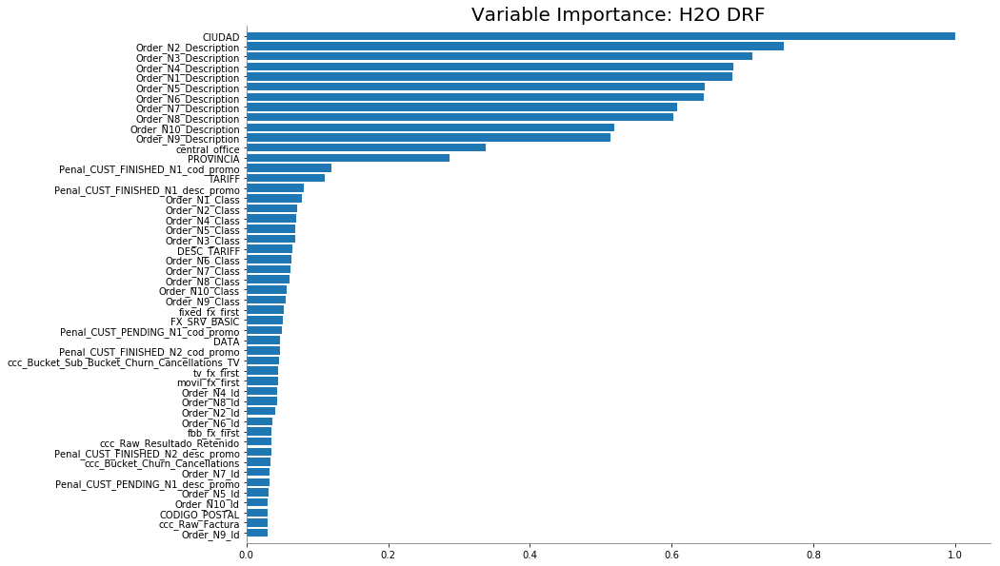

1336


,variable,relative_importance,scaled_importance,percentage
0,CIUDAD,38973.8,1,0.0668138
1,Order_N2_Description,29550.2,0.758206,0.0506586
2,Order_N3_Description,27827.5,0.714005,0.0477054
3,Order_N4_Description,26783.1,0.687207,0.0459149
4,Order_N1_Description,26734.9,0.685971,0.0458323
5,Order_N5_Description,25200,0.646589,0.0432011
6,Order_N6_Description,25143.7,0.645145,0.0431046
7,Order_N7_Description,23670.8,0.607353,0.0405796
8,Order_N8_Description,23501.9,0.60302,0.04029
9,Order_N10_Description,20230.8,0.519087,0.0346821


In [37]:
try:
    leader.varimp_plot(num_of_features=50)
    model_varimp = [v for v in leader.varimp() if v[1]>0]
    #model_varimp = aml.leader.varimp()
    #display(HTML(tabulate.tabulate([['variable', 'relative_importance', 'scaled_importance', 'percentage']]+model_varimp, tablefmt='html', headers='firstrow')))
except TypeError:
    from h2o.estimators.random_forest import H2ORandomForestEstimator
    # Run RandomForest for max_runtime_secs seconds
    max_runtime_secs = 60
    drf = H2ORandomForestEstimator(ntrees=50, max_runtime_secs=max_runtime_secs, seed=1234)#, max_depth=20, nfolds=10
    drf.train(x = x, y = y,
              training_frame = train)#, validation_frame = test
    #aml.leader = drf
    
    drf.varimp_plot(num_of_features=50)
    model_varimp = [v for v in drf.varimp() if v[1]>0]
    
model_varimp_table = [[index]+list(item) for index, item in enumerate(model_varimp) if item[1]>0]
print len(model_varimp)
display(HTML(tabulate.tabulate([['variable', 'relative_importance', 'scaled_importance', 'percentage']]+model_varimp_table, tablefmt='html', headers='firstrow')))

### Amdocs - Predictions

In [15]:
tnps3m = spark.read.parquet('/tmp/bbergua/tnps/msisdn/20180814')
print tnps3m.count()
#tnps3m.printSchema()

2633016
root
 |-- msisdn: string (nullable = true)
 |-- TNPS_VDN_10362: integer (nullable = true)
 |-- TNPS_VDN_20029: integer (nullable = true)
 |-- TNPS_VDN_20056: integer (nullable = true)
 |-- TNPS_VDN_10371: integer (nullable = true)
 |-- TNPS_VDN_10354: integer (nullable = true)
 |-- TNPS_VDN_20054: integer (nullable = true)
 |-- TNPS_VDN_10368: integer (nullable = true)
 |-- TNPS_VDN_20042: integer (nullable = true)
 |-- TNPS_VDN_20041: integer (nullable = true)
 |-- TNPS_VDN_10358: integer (nullable = true)
 |-- TNPS_VDN_20087: integer (nullable = true)
 |-- TNPS_VDN_10346: integer (nullable = true)
 |-- TNPS_VDN_20083: integer (nullable = true)
 |-- TNPS_VDN_20060: integer (nullable = true)
 |-- TNPS_VDN_10249: integer (nullable = true)
 |-- TNPS_VDN_20057: integer (nullable = true)
 |-- TNPS_VDN_20047: integer (nullable = true)
 |-- TNPS_VDN_10411: integer (nullable = true)
 |-- TNPS_VDN_10331: integer (nullable = true)
 |-- TNPS_VDN_10388: integer (nullable = true)
 |-- TNPS

In [16]:
tnps3m = tnps3m.select('msisdn', 'TNPS2DET')
tnps3m.cache()
tnps3m.groupby('TNPS2DET').count().show()

+-------------+-------+
|     TNPS2DET|  count|
+-------------+-------+
|NON DETRACTOR|1938655|
|    DETRACTOR| 694361|
+-------------+-------+



In [17]:
ofile = '/tmp/bbergua/tmp/tnps3m'
tnps3m.repartition(1).write.save(ofile, format='csv', header=True, sep='\t', mode='overwrite')
# hdfs dfs -get /tmp/bbergua/tmp/tnps3m/part-00000-*.csv tnps3m.csv

Make predictions

In [53]:
amdocs.printSchema()

root
 |-- nif: string (nullable = true)
 |-- partitioned_month: integer (nullable = false)
 |-- year: integer (nullable = false)
 |-- month: integer (nullable = false)
 |-- day: integer (nullable = false)
 |-- CAR_ind_nif_compartido: integer (nullable = true)
 |-- CAR_num_movil_voz_ono: double (nullable = true)
 |-- CAR_ind_movil_voz_ono: integer (nullable = true)
 |-- CAR_num_movil_datos_ono: double (nullable = true)
 |-- CAR_ind_movil_datos_ono: integer (nullable = true)
 |-- CAR_num_movil_voz_datos_ono: double (nullable = true)
 |-- CAR_ind_movil_voz_datos_ono: integer (nullable = true)
 |-- CAR_num_meses_antig_movil: double (nullable = true)
 |-- CAR_num_meses_antig_cliente: double (nullable = true)
 |-- CAR_ind_superoferta_on15: integer (nullable = true)
 |-- CAR_seg_superoferta: string (nullable = true)
 |-- CAR_num_arpu_combinado: double (nullable = true)
 |-- CAR_num_arpu_indefinida: double (nullable = true)
 |-- CAR_num_arpu_indef_movil: double (nullable = true)
 |-- CAR_num_a

In [54]:
h2o.ls()

,key
0,AutoML_20180425_102925
1,AutoML_20180425_152933
2,AutoML_Feedback_AutoML_20180425_102925
3,AutoML_Feedback_AutoML_20180425_152933
4,AutoML_Leaderboard_automl_py_6_sid_9f21
5,AutoML_Leaderboard_automl_py_7_sid_a4aa
6,DRF_0_AutoML_20180425_102925
7,DRF_0_AutoML_20180425_102925_cv_1
8,DRF_0_AutoML_20180425_102925_cv_2
9,DRF_0_AutoML_20180425_102925_cv_3


In [83]:
#ofile='/tmp/bbergua/tmp/amdocs_all-'+str(filter_month)
ofile='/tmp/bbergua/tmp/exono_all-'+str(filter_month)

In [14]:
print time.ctime()
start = time.time()
#subprocess.call('hdfs dfs -rm -r '+ofile, shell=True)
print 'Saving', ofile
#amdocs.where('FLAG_EXONO == 1').write.mode('overwrite').format('csv').save(ofile, header=True)
amdocs.write.save(ofile, format='csv', header=True, sep='\t', mode='overwrite')
end = time.time()
print 'Process took:', "{0:.0f}".format((end - start)/60), 'minutes', "{0:.0f}".format((end - start)%60), 'seconds'

Tue Aug 14 19:37:36 2018
Saving /tmp/bbergua/tmp/exono_all-201808
Process took: 4 minutes 17 seconds


In [15]:
# $ hdfs getconf -confKey fs.defaultFS
# hdfs://nameservice1
# $ hdfs getconf -namenodes
# vgddp350hr.dc.sedc.internal.vodafone.com vgddp351hr.dc.sedc.internal.vodafone.com
out = subprocess.check_output('hdfs getconf -namenodes', shell=True)
nodes = ['hdfs://'+n for n in out.strip().split(' ')]

In [84]:
path_amdocs_all = [n+ofile for n in nodes]
path_amdocs_all

['hdfs://vgddp350hr.dc.sedc.internal.vodafone.com/tmp/bbergua/tmp/exono_all-201808',
 'hdfs://vgddp351hr.dc.sedc.internal.vodafone.com/tmp/bbergua/tmp/exono_all-201808']

In [91]:
#if False:
#h2o.remove_all()
amdocs_all_df_h2o = h2o.import_file(path=path_amdocs_all[0])
amdocs_all_df_h2o.nrows
#subprocess.call('hdfs dfs -rm -r '+ofile, shell=True)

Parse progress: |█████

H2OConnectionError: Unexpected HTTP error: ('Connection aborted.', BadStatusLine("''",))

In [ ]:
if False:
    #h2o.remove_all()
    amdocs_all_pd = generate_pandas_data(amdocs.where('FLAG_EXONO == 1'))

    # Copy to H2O

    #print balanced_pd.columns.values.tolist()
    #os.environ["PYTHONIOENCODING"] = "UTF-8"
    print 'Copying data to H2O'
    h2o.remove('amdocs_all_df_h2o.hex')
    amdocs_all_df_h2o = h2o.H2OFrame(amdocs_all_pd, destination_frame='amdocs_all_df_h2o.hex', header=1)
    amdocs_all_df_h2o.head()

#preds = aml.leader.predict()

In [65]:
#amdocs_all_pd.dtypes
#print amdocs_all_pd.columns.values.tolist()

In [110]:
h2o.ls()

,key
0,AutoML_20180814_122104
1,AutoML_Feedback_AutoML_20180814_122104
2,AutoML_Leaderboard_automl_py_11_sid_ae63
3,DRF_0_AutoML_20180814_122104
4,DRF_0_AutoML_20180814_122104_cv_1
5,DRF_0_AutoML_20180814_122104_cv_2
6,DRF_0_AutoML_20180814_122104_cv_3
7,DRF_0_AutoML_20180814_122104_cv_4
8,DRF_0_AutoML_20180814_122104_cv_5
9,DRF_model_python_1534235311348_189


In [62]:
for c in amdocs_all_df_h2o.columns:
    if c.startswith('CAR_ind') or c.startswith('CAR_num'):
        amdocs_all_df_h2o[c] = amdocs_all_df_h2o[c].asnumeric()
    elif c.startswith('CAR_seg'):
        amdocs_all_df_h2o[c] = amdocs_all_df_h2o[c].asfactor()

In [30]:
amdocs_all_df_h2o.describe()

Rows:3267387
Cols:2641




NUM_CLIENTE Instancia_P msisdn DIR_NUM_DIRECCION TRATAMIENTO NOMBRE PRIM_APELLIDO SEG_APELLIDO CLASE_CLI_COD_CLASE_CLIENTE DIR_LINEA1 DIR_LINEA2 DIR_LINEA3 COD_ESTADO_GENERAL NOM_COMPLETO DIR_FACTURA1 DIR_FACTURA2 DIR_FACTURA3 DIR_FACTURA4 CODIGO_POSTAL TRAT_FACT NOMBRE_CLI_FACT APELLIDO1_CLI_FACT APELLIDO2_CLI_FACT NIF_CLIENTE METODO_PAGO PUBLICIDAD ENCUESTAS CTA_CORREO_CONTACTO CTA_CORREO FACTURA_CATALAN FACTURA_ELECTRONICA SUPEROFERTA NIF_FACTURACION FECHA_MIGRACION TIPO_DOCUMENTO X_PUBLICIDAD_EMAIL CICLO NACIONALIDAD x_tipo_cuenta_corp x_antiguedad_cuenta x_datos_navegacion x_datos_trafico x_cesion_datos x_user_facebook x_user_twitter marriage2hgbst_elm gender2hgbst_elm birth_date FLG_LORTAD FLG_ROBINSON X_FORMATO_FACTURA X_IDIOMA_FACTURA ENCUESTAS2 SUPEROFERTA2 bam_services bam_fx_first bam-movil_services bam-movil_fx_first fbb_services fbb_fx_first fixed_services fixed_fx_first movil_services movil_fx_first prepaid_services prepaid_fx_first tv_services tv_fx_first SRV_BASIC DESC_SRV_BASIC OBJID TACADA FX_SRV_BASIC PRICE_SRV_BASIC RGU TIPO_SIM IMSI TARIFF FX_TARIFF DESC_TARIFF PRICE_TARIFF VOICE_TARIFF FX_VOICE_TARIFF PRICE_VOICE_TARIFF DATA FX_DATA PRICE_DATA DTO_LEV1 FX_DTO_LEV1 PRICE_DTO_LEV1 DTO_LEV2 FX_DTO_LEV2 PRICE_DTO_LEV2 DTO_LEV3 FX_DTO_LEV3 PRICE_DTO_LEV3 DATA_ADDITIONAL FX_DATA_ADDITIONAL PRICE_DATA_ADDITIONAL OOB FX_OOB PRICE_OOB NETFLIX_NAPSTER FX_NETFLIX_NAPSTER PRICE_NETFLIX_NAPSTER ROAMING_BASIC FX_ROAMING_BASIC PRICE_ROAMING_BASIC ROAM_USA_EUR FX_ROAM_USA_EUR PRICE_ROAM_USA_EUR ROAM_ZONA_2 FX_ROAM_ZONA_2 PRICE_ROAM_ZONA_2 CONSUM_MIN FX_CONSUM_MIN PRICE_CONSUM_MIN SIM_VF HOMEZONE FX_HOMEZONE PRICE_HOMEZONE MOVIL_HOMEZONE FBB_UPGRADE FX_FBB_UPGRADE PRICE_FBB_UPGRADE DECO_TV FX_DECO_TV PRICE_DECO_TV NUM_SERIE_DECO_TV TV_CUOTA_ALTA FX_TV_CUOTA_ALTA PRICE_TV_CUOTA_ALTA TV_TARIFF FX_TV_TARIFF PRICE_TV_TARIFF TV_CUOT_CHARGES FX_TV_CUOT_CHARGES PRICE_TV_CUOT_CHARGES TV_PROMO FX_TV_PROMO PRICE_TV_PROMO TV_PROMO_USER FX_TV_PROMO_USER PRICE_TV_PROMO_USER TV_ABONOS FX_TV_ABONOS PRICE_TV_ABONOS TV_LOYALTY FX_TV_LOYALTY PRICE_TV_LOYALTY TV_SVA FX_TV_SVA PRICE_TV_SVA FOOTBALL_TV FX_FOOTBALL_TV PRICE_FOOTBALL_TV MOTOR_TV FX_MOTOR_TV PRICE_MOTOR_TV PVR_TV FX_PVR_TV PRICE_PVR_TV ZAPPER_TV FX_ZAPPER_TV PRICE_ZAPPER_TV TRYBUY_TV FX_TRYBUY_TV PRICE_TRYBUY_TV TRYBUY_AUTOM_TV FX_TRYBUY_AUTOM_TV PRICE_TRYBUY_AUTOM_TV CAMPO1 CAMPO2 CAMPO3 flag_msisdn_err TV_TOTAL_CHARGES MOBILE_BAM_TOTAL_CHARGES central_office x_id_gescal CIUDAD PROVINCIA GNV_hour_0_W_MOU GNV_hour_0_W_Num_Of_Calls GNV_hour_0_WE_MOU GNV_hour_0_WE_Num_Of_Calls GNV_hour_10_W_MOU GNV_hour_10_W_Num_Of_Calls GNV_hour_10_WE_MOU GNV_hour_10_WE_Num_Of_Calls GNV_hour_11_W_MOU GNV_hour_11_W_Num_Of_Calls GNV_hour_11_WE_MOU GNV_hour_11_WE_Num_Of_Calls GNV_hour_12_W_MOU GNV_hour_12_W_Num_Of_Calls GNV_hour_12_WE_MOU GNV_hour_12_WE_Num_Of_Calls GNV_hour_13_W_MOU GNV_hour_13_W_Num_Of_Calls GNV_hour_13_WE_MOU GNV_hour_13_WE_Num_Of_Calls GNV_hour_14_W_MOU GNV_hour_14_W_Num_Of_Calls GNV_hour_14_WE_MOU GNV_hour_14_WE_Num_Of_Calls GNV_hour_15_W_MOU GNV_hour_15_W_Num_Of_Calls GNV_hour_15_WE_MOU GNV_hour_15_WE_Num_Of_Calls GNV_hour_16_W_MOU GNV_hour_16_W_Num_Of_Calls GNV_hour_16_WE_MOU GNV_hour_16_WE_Num_Of_Calls GNV_hour_17_W_MOU GNV_hour_17_W_Num_Of_Calls GNV_hour_17_WE_MOU GNV_hour_17_WE_Num_Of_Calls GNV_hour_18_W_MOU GNV_hour_18_W_Num_Of_Calls GNV_hour_18_WE_MOU GNV_hour_18_WE_Num_Of_Calls GNV_hour_19_W_MOU GNV_hour_19_W_Num_Of_Calls GNV_hour_19_WE_MOU GNV_hour_19_WE_Num_Of_Calls GNV_hour_1_W_MOU GNV_hour_1_W_Num_Of_Calls GNV_hour_1_WE_MOU GNV_hour_1_WE_Num_Of_Calls GNV_hour_20_W_MOU GNV_hour_20_W_Num_Of_Calls GNV_hour_20_WE_MOU GNV_hour_20_WE_Num_Of_Calls GNV_hour_21_W_MOU GNV_hour_21_W_Num_Of_Calls GNV_hour_21_WE_MOU GNV_hour_21_WE_Num_Of_Calls GNV_hour_22_W_MOU GNV_hour_22_W_Num_Of_Calls GNV_hour_22_WE_MOU GNV_hour_22_WE_Num_Of_Calls GNV_hour_23_W_MOU GNV_hour_23_W_Num_Of_Calls GNV_hour_23_WE_MOU GNV_hour_23_WE_Num_Of_Calls GNV_hour_2_W_MOU GNV_hour_2_W_Num_Of_Calls GNV_hour_2_W

In [18]:
amdocs_all_df_h2o.columns

[u'NUM_CLIENTE',
 u'Instancia_P',
 u'msisdn',
 u'DIR_NUM_DIRECCION',
 u'TRATAMIENTO',
 u'NOMBRE',
 u'PRIM_APELLIDO',
 u'SEG_APELLIDO',
 u'CLASE_CLI_COD_CLASE_CLIENTE',
 u'DIR_LINEA1',
 u'DIR_LINEA2',
 u'DIR_LINEA3',
 u'COD_ESTADO_GENERAL',
 u'NOM_COMPLETO',
 u'DIR_FACTURA1',
 u'DIR_FACTURA2',
 u'DIR_FACTURA3',
 u'DIR_FACTURA4',
 u'CODIGO_POSTAL',
 u'TRAT_FACT',
 u'NOMBRE_CLI_FACT',
 u'APELLIDO1_CLI_FACT',
 u'APELLIDO2_CLI_FACT',
 u'NIF_CLIENTE',
 u'METODO_PAGO',
 u'PUBLICIDAD',
 u'ENCUESTAS',
 u'CTA_CORREO_CONTACTO',
 u'CTA_CORREO',
 u'FACTURA_CATALAN',
 u'FACTURA_ELECTRONICA',
 u'SUPEROFERTA',
 u'NIF_FACTURACION',
 u'FECHA_MIGRACION',
 u'TIPO_DOCUMENTO',
 u'X_PUBLICIDAD_EMAIL',
 u'CICLO',
 u'NACIONALIDAD',
 u'x_tipo_cuenta_corp',
 u'x_antiguedad_cuenta',
 u'x_datos_navegacion',
 u'x_datos_trafico',
 u'x_cesion_datos',
 u'x_user_facebook',
 u'x_user_twitter',
 u'marriage2hgbst_elm',
 u'gender2hgbst_elm',
 u'birth_date',
 u'FLG_LORTAD',
 u'FLG_ROBINSON',
 u'X_FORMATO_FACTURA',
 u'X_IDIO

In [86]:
#try:
#    leader
#except:
leader = h2o.load_model('/var/SP/data/home/bbergua/exono_model/DRF_model_python_1534264029915_205')

In [49]:
for c in amdocs_all_df_h2o.columns:
    if     (c == 'Penal_CUST_PENDING_N3_cod_promo'):
        #or (c == 'orders_Otros_CAN_fx_last_order'):
        amdocs_all_df_h2o[c] = amdocs_all_df_h2o[c].asnumeric()

In [87]:
amdocs_training_df_h2o[['Penal_CUST_PENDING_N3_cod_promo', 'orders_Otros_CAN_fx_last_order']].describe()

Rows:27141
Cols:2




,Penal_CUST_PENDING_N3_cod_promo,orders_Otros_CAN_fx_last_order
type,int,int
mins,5120.0,20180710.0
mean,5122.0,135509212.312
maxs,5123.0,166120039.0
sigma,1.73205080757,47982278.6335
zeros,0,0
missing,27138,27125
0,nan,nan
1,nan,nan
2,nan,nan


In [73]:
amdocs_all_df_h2o['Penal_CUST_PENDING_N3_cod_promo'] = amdocs_all_df_h2o['Penal_CUST_PENDING_N3_cod_promo'].asnumeric()
amdocs_all_df_h2o['orders_Otros_CAN_fx_last_order'] = amdocs_all_df_h2o['orders_Otros_CAN_fx_last_order'].asnumeric()
#amdocs_all_df_h2o[''] = amdocs_all_df_h2o[''].asnumeric()
amdocs_all_df_h2o[['Penal_CUST_PENDING_N3_cod_promo', 'orders_Otros_CAN_fx_last_order']].describe()

H2OResponseError: Server error water.exceptions.H2OKeyNotFoundArgumentException:
  Error: Object 'py_37_sid_abd1' not found for argument: key
  Request: GET /3/Frames/py_37_sid_abd1
    params: {u'row_offset': '0', u'row_count': '10', u'column_count': '-1', u'column_offset': '0'}


In [ ]:
amdocs_all_df_h2o[~ amdocs_all_df_h2o['orders_Otros_CAN_fx_last_order'].isna(), 'orders_Otros_CAN_fx_last_order']

In [ ]:
# Remove missings (in case of any)
#amdocs_all_df_h2o = amdocs_all_df_h2o[~ amdocs_all_df_h2o[target_col].isna()]
# Remove not missings (in case of any)
amdocs_all_df_h2o = amdocs_all_df_h2o[amdocs_all_df_h2o['orders_Otros_CAN_fx_last_order'].isna()]
amdocs_all_df_h2o[~ amdocs_all_df_h2o['orders_Otros_CAN_fx_last_order'].isna(), 'orders_Otros_CAN_fx_last_order']

In [89]:
#amdocs_all_df_h2o[~ amdocs_all_df_h2o['orders_Otros_CAN_fx_last_order'].isna(), 'orders_Otros_CAN_fx_last_order'] = 135509212
#amdocs_all_df_h2o[~ amdocs_all_df_h2o['orders_Otros_CAN_fx_last_order'].isna(), 'orders_Otros_CAN_fx_last_order'] = ''
#amdocs_all_df_h2o['orders_Otros_CAN_fx_last_order'] = amdocs_all_df_h2o['orders_Otros_CAN_fx_last_order'].asnumeric()

H2OResponseError: Server error water.exceptions.H2OKeyNotFoundArgumentException:
  Error: Object 'py_41_sid_abd1' not found for argument: key
  Request: GET /3/Frames/py_41_sid_abd1
    params: {u'row_offset': '0', u'row_count': '10', u'column_count': '-1', u'column_offset': '0'}


In [68]:
amdocs_all_df_h2o_predict = amdocs_all_df_h2o.drop(['tnps_TNPS01', 'tnps_TNPS4', 'tnps_TNPS', 'tnps_TNPS2DET', 'tnps_TNPS2PRO'])
amdocs_all_preds = leader.predict(amdocs_all_df_h2o_predict)

drf prediction progress: | (failed)


EnvironmentError: Job with key $03017f00000132d4ffffffff$_922e97162f19a9167211add3cdb34534 failed with an exception: java.lang.IllegalArgumentException: Test/Validation dataset has categorical column 'orders_Otros_CAN_fx_last_order' which is real-valued in the training data
stacktrace: 
java.lang.IllegalArgumentException: Test/Validation dataset has categorical column 'orders_Otros_CAN_fx_last_order' which is real-valued in the training data
	at hex.Model.adaptTestForTrain(Model.java:1028)
	at hex.Model.adaptTestForTrain(Model.java:890)
	at hex.Model.score(Model.java:1134)
	at water.api.ModelMetricsHandler$1.compute2(ModelMetricsHandler.java:362)
	at water.H2O$H2OCountedCompleter.compute(H2O.java:1263)
	at jsr166y.CountedCompleter.exec(CountedCompleter.java:468)
	at jsr166y.ForkJoinTask.doExec(ForkJoinTask.java:263)
	at jsr166y.ForkJoinPool$WorkQueue.runTask(ForkJoinPool.java:974)
	at jsr166y.ForkJoinPool.runWorker(ForkJoinPool.java:1477)
	at jsr166y.ForkJoinWorkerThread.run(ForkJoinWorkerThread.java:104)


In [70]:
#amdocs_all_preds.head()

In [66]:
amdocs_all_preds.group_by(ouput_col).count().get_frame()

PROMOTER,nrow
0.252839,1
0.256276,1
0.259277,1
0.2617,1
0.263216,1
0.267767,1
0.268859,1
0.271473,1
0.277383,1
0.277495,1


In [74]:
#amdocs_all_preds_id[[ouput_col]].hist(plot=False)

Append NIF and actual labels to predictions

In [67]:
amdocs_all_preds_id = amdocs_all_preds.cbind(amdocs_all_df_h2o[['nif', 'TNPS01']])
amdocs_all_preds_id

predict,NON PROMOTER,PROMOTER,nif,TNPS01
PROMOTER,0.529586,0.470414,00017817E,nan
PROMOTER,0.526145,0.473855,00024523I,nan
PROMOTER,0.516742,0.483258,00037560-T,nan
PROMOTER,0.516742,0.483258,00040052G,nan
PROMOTER,0.516742,0.483258,00051414D,nan
PROMOTER,0.516742,0.483258,00075749Y,5
PROMOTER,0.502067,0.497933,00075930V,nan
PROMOTER,0.506556,0.493444,00078144L,nan
PROMOTER,0.516742,0.483258,00094207U,nan
PROMOTER,0.546035,0.453965,00105138L,nan


Count number of rows and proportion of predictions

In [68]:
amdocs_all_preds_nrows = amdocs_all_preds_id.nrows
amdocs_all_preds_groupby = amdocs_all_preds_id.group_by(by='predict').count().get_frame()
proportion = 100*amdocs_all_preds_groupby['nrow']/amdocs_all_preds_nrows
proportion.set_names(['proportion'])
amdocs_all_preds_groupby.cbind(proportion)

predict,nrow,proportion
NON PROMOTER,85752,2.46538
PROMOTER,3.39249e+06,97.5346


As proportions of predictions are highly unbalanced, let's create a new prediction column (**predict2**) using a threshold on scoring column

In [69]:
th_max_acc = test_metrics.accuracy()[0][0]
amdocs_all_preds_id['predict2'] = 'NON PROMOTER'
amdocs_all_preds_id[amdocs_all_preds_id[ouput_col] >= th_max_acc, 'predict2'] = 'PROMOTER'
#amdocs_all_preds_id[amdocs_all_preds_id[ouput_col] < th_max_acc, 'predict2'] = 'NON PROMOTER'
amdocs_all_preds_id['predict2'] = amdocs_all_preds_id['predict2'].asfactor()
amdocs_all_preds_id

predict,NON PROMOTER,PROMOTER,nif,TNPS01,predict2
PROMOTER,0.529586,0.470414,00017817E,nan,NON PROMOTER
PROMOTER,0.526145,0.473855,00024523I,nan,NON PROMOTER
PROMOTER,0.516742,0.483258,00037560-T,nan,NON PROMOTER
PROMOTER,0.516742,0.483258,00040052G,nan,NON PROMOTER
PROMOTER,0.516742,0.483258,00051414D,nan,NON PROMOTER
PROMOTER,0.516742,0.483258,00075749Y,5,NON PROMOTER
PROMOTER,0.502067,0.497933,00075930V,nan,PROMOTER
PROMOTER,0.506556,0.493444,00078144L,nan,PROMOTER
PROMOTER,0.516742,0.483258,00094207U,nan,NON PROMOTER
PROMOTER,0.546035,0.453965,00105138L,nan,NON PROMOTER


Compare real label with this **predict2**  column newly created

In [70]:
amdocs_all_preds_nrows = amdocs_all_preds_id.nrows
amdocs_all_preds_groupby = amdocs_all_preds_id.group_by(by=['TNPS01', 'predict2']).count().get_frame()
proportion = 100*amdocs_all_preds_groupby['nrow']/amdocs_all_preds_nrows
proportion.set_names(['proportion'])
amdocs_all_preds_groupby.cbind(proportion)

TNPS01,predict2,nrow,proportion
0,NON PROMOTER,4144,0.119141
0,PROMOTER,671,0.0192914
1,NON PROMOTER,836,0.0240351
1,PROMOTER,118,0.00339252
10,NON PROMOTER,20692,0.594898
10,PROMOTER,3798,0.109193
2,NON PROMOTER,430,0.0123626
2,PROMOTER,83,0.00238626
3,NON PROMOTER,434,0.0124776
3,PROMOTER,75,0.00215626


Count number of rows and proportion of predictions using the new **predict2** column

In [71]:
amdocs_all_preds_nrows = amdocs_all_preds_id.nrows
amdocs_all_preds_groupby = amdocs_all_preds_id.group_by(by='predict2').count().get_frame()
proportion = 100*amdocs_all_preds_groupby['nrow']/amdocs_all_preds_nrows
proportion.set_names(['proportion'])
amdocs_all_preds_groupby.cbind(proportion)

predict2,nrow,proportion
NON PROMOTER,2.80368e+06,80.6063
PROMOTER,674559,19.3937


Calculate cut points in predictions to preserve original proportions of **TNPS01**

In [72]:
amdocs_proportions

{0: 10.061983831823023,
 1: 1.6175161070661568,
 2: 1.1474865992701622,
 3: 1.1352644352487211,
 4: 1.2560892567178252,
 5: 5.833115080404379,
 6: 3.6628079548827546,
 7: 6.357969723953696,
 8: 12.264068583800395,
 9: 12.156862745098039,
 10: 44.50683568173485}

In [73]:
print 'nrows:', amdocs_all_preds_nrows
#print 'proportions', amdocs_proportions


#if 'HARD DETRACTOR' in amdocs_proportions.keys() and 'SOFT DETRACTOR' in amdocs_proportions.keys():
#    amdocs_proportions['DETRACTOR'] = amdocs_proportions['HARD DETRACTOR'] + amdocs_proportions['SOFT DETRACTOR']
#    del amdocs_proportions['HARD DETRACTOR']
#    del amdocs_proportions['SOFT DETRACTOR']

amdocs_counts = {}
for k in amdocs_proportions.keys():
    amdocs_counts[k] = int(amdocs_all_preds_nrows*amdocs_proportions[k]/100)
diff = amdocs_all_preds_nrows - sum(amdocs_counts.values())
if (diff > 0):
    min_key = min(amdocs_counts, key=amdocs_counts.get) # Get the key with minimum value
    amdocs_counts[min_key] = amdocs_counts[min_key] + diff # Assign rest to key with minimum num rows
print 'counts:', amdocs_counts

ini = 0
end = 0
amdocs_ranges = {}
for k in amdocs_proportions.keys():#['HARD DETRACTOR', 'SOFT DETRACTOR', 'NEUTRAL', 'PROMOTER']: # It is necessary to force the order
    if end > 0:
        ini = end + 1
    end = ini + amdocs_counts[k] - 1
    amdocs_ranges[k] = [ini, end]
    #print k, ini, end
print 'ranges:', amdocs_ranges

nrows: 3478241
counts: {0: 349980, 1: 56261, 2: 39912, 3: 39492, 4: 43689, 5: 202889, 6: 127401, 7: 221145, 8: 426573, 9: 422844, 10: 1548055}
ranges: {0: [0, 349979], 1: [349980, 406240], 2: [406241, 446152], 3: [446153, 485644], 4: [485645, 529333], 5: [529334, 732222], 6: [732223, 859623], 7: [859624, 1080768], 8: [1080769, 1507341], 9: [1507342, 1930185], 10: [1930186, 3478240]}


Using the cut points calculated above, create a new **predict_TNPS01** column with final predictions

In [ ]:
# FIXME: TODO: Ordernar por la columna con la prediccion antes de aplicar los cortes!!!

In [74]:
for k in amdocs_ranges.keys():
    r = range(amdocs_ranges[k][0], amdocs_ranges[k][1]+1, 1)
    print k, r[0], r[-1]
    amdocs_all_preds_id[r, 'predict_TNPS01'] = k
    #tmp = amdocs_all_preds_id[r, :]
    #print tmp.head()
amdocs_all_preds_id['predict_TNPS01'] = amdocs_all_preds_id['predict_TNPS01'].asnumeric()
amdocs_all_preds_id.describe()

0 0 349979
1 349980 406240
2 406241 446152
3 446153 485644
4 485645 529333
5 529334 732222
6 732223 859623
7 859624 1080768
8 1080769 1507341
9 1507342 1930185
10 1930186 3478240
Rows:3478241
Cols:7




,predict,NON PROMOTER,PROMOTER,nif,TNPS01,predict2,predict_TNPS01
type,enum,real,real,string,enum,enum,int
mins,,0.298947565083,0.252839364748,NaN,,,0.0
mean,,0.522499389784,0.477500610216,NaN,,,7.60583093581
maxs,,0.747160635252,0.701052434917,NaN,,,10.0
sigma,,0.027476550108,0.027476550108,NaN,,,3.25756166774
zeros,,0,0,0,,,349980
missing,0,0,0,0,0,0,0
0,PROMOTER,0.529586326165,0.470413673835,00017817E,nan,NON PROMOTER,0.0
1,PROMOTER,0.526145444368,0.473854555632,00024523I,nan,NON PROMOTER,0.0
2,PROMOTER,0.516742398992,0.483257601008,00037560-T,nan,NON PROMOTER,0.0


As what we really need is to provide a prediction of the type ['PROMOTER', 'NEUTRAL', 'SOFT DETRACTOR', 'HARD DETRACTOR'], we calculate predict_TNPS4 and predict_TNPS from predict_TNPS01

In [86]:
if False:
    # H2O does not allow empty strings '' here, so we need to use 'NA' instead
    #amdocs_all_preds_id[(amdocs_all_preds_id['predict_TNPS01'] <= -1), 'predict_TNPS4'] = 'NA'
    amdocs_all_preds_id[(amdocs_all_preds_id['predict_TNPS01'] >= 0) & (amdocs_all_preds_id['predict_TNPS01'] <= 3), 'predict_TNPS4'] = 'HARD DETRACTOR'
    amdocs_all_preds_id[(amdocs_all_preds_id['predict_TNPS01'] >= 4) & (amdocs_all_preds_id['predict_TNPS01'] <= 6), 'predict_TNPS4'] = 'SOFT DETRACTOR'
    amdocs_all_preds_id[(amdocs_all_preds_id['predict_TNPS01'] >= 7) & (amdocs_all_preds_id['predict_TNPS01'] <= 8), 'predict_TNPS4'] = 'NEUTRAL'
    amdocs_all_preds_id[(amdocs_all_preds_id['predict_TNPS01'] >= 9) & (amdocs_all_preds_id['predict_TNPS01'] <= 10), 'predict_TNPS4'] = 'PROMOTER'

    #amdocs_all_preds_id[(amdocs_all_preds_id['predict_TNPS4'] == 'NA'), 'predict_TNPS'] = 'NA'
    amdocs_all_preds_id[(amdocs_all_preds_id['predict_TNPS4'] == 'HARD DETRACTOR') | (amdocs_all_preds_id['predict_TNPS4'] == 'SOFT DETRACTOR'), 'predict_TNPS'] = 'DETRACTOR'
    amdocs_all_preds_id[(amdocs_all_preds_id['predict_TNPS4'] == 'NEUTRAL'), 'predict_TNPS'] = 'NEUTRAL'
    amdocs_all_preds_id[(amdocs_all_preds_id['predict_TNPS4'] == 'PROMOTER'), 'predict_TNPS'] = 'PROMOTER'

    amdocs_all_preds_id[(amdocs_all_preds_id['predict_TNPS'] != 'DETRACTOR'), 'predict_TNPS2DET'] = 'NON DETRACTOR'
    amdocs_all_preds_id[(amdocs_all_preds_id['predict_TNPS'] == 'DETRACTOR'), 'predict_TNPS2DET'] = 'DETRACTOR'
    #amdocs_all_preds_id[(amdocs_all_preds_id['predict_TNPS'] == 'NA'), 'predict_TNPS2DET'] = 'NA'

    amdocs_all_preds_id[(amdocs_all_preds_id['predict_TNPS'] != 'PROMOTER'), 'predict_TNPS2PRO'] = 'NON PROMOTER'
    amdocs_all_preds_id[(amdocs_all_preds_id['predict_TNPS'] == 'PROMOTER'), 'predict_TNPS2PRO'] = 'PROMOTER'
    #amdocs_all_preds_id[(amdocs_all_preds_id['predict_TNPS'] == 'NA'), 'predict_TNPS2PRO'] = 'NA'

    amdocs_all_preds_id['predict_TNPS2DET'] = amdocs_all_preds_id['predict_TNPS2DET'].asfactor()
    amdocs_all_preds_id['predict_TNPS2PRO'] = amdocs_all_preds_id['predict_TNPS2PRO'].asfactor()
    amdocs_all_preds_id['predict_TNPS'] = amdocs_all_preds_id['predict_TNPS'].asfactor()
    amdocs_all_preds_id['predict_TNPS4'] = amdocs_all_preds_id['predict_TNPS4'].asfactor()

    amdocs_all_preds_id.describe()

Count number of rows and proportion of predictions using the final **predict_TNPS01** column, that must match original proportions

In [75]:
amdocs_all_preds_nrows = amdocs_all_preds_id.nrows
amdocs_all_preds_groupby = amdocs_all_preds_id.group_by(by='predict_TNPS01').count().get_frame()
proportion = 100*amdocs_all_preds_groupby['nrow']/amdocs_all_preds_nrows
proportion.set_names(['proportion'])
amdocs_all_preds_groupby.cbind(proportion).head(11)

predict_TNPS01,nrow,proportion
0,349980,10.062
1,56261,1.61751
2,39912,1.14748
3,39492,1.1354
4,43689,1.25607
5,202889,5.83309
6,127401,3.6628
7,221145,6.35796
8,426573,12.264
9,422844,12.1568


Copy column with numeric score to 'predict'

In [76]:
amdocs_all_preds_id2 = amdocs_all_preds_id.drop('predict')
#amdocs_all_preds_id2.set_name(ouput_col, 'predict')
amdocs_all_preds_id2['predict'] = amdocs_all_preds_id2[ouput_col]
amdocs_all_preds_id2.describe()

Rows:3478241
Cols:7




,NON PROMOTER,PROMOTER,nif,TNPS01,predict2,predict_TNPS01,predict
type,real,real,string,enum,enum,int,real
mins,0.298947565083,0.252839364748,NaN,,,0.0,0.252839364748
mean,0.522499389784,0.477500610216,NaN,,,7.60583093581,0.477500610216
maxs,0.747160635252,0.701052434917,NaN,,,10.0,0.701052434917
sigma,0.027476550108,0.027476550108,NaN,,,3.25756166774,0.027476550108
zeros,0,0,0,,,349980,0
missing,0,0,0,0,0,0,0
0,0.529586326165,0.470413673835,00017817E,nan,NON PROMOTER,0.0,0.470413673835
1,0.526145444368,0.473854555632,00024523I,nan,NON PROMOTER,0.0,0.473854555632
2,0.516742398992,0.483257601008,00037560-T,nan,NON PROMOTER,0.0,0.483257601008


Convert predictions to Pandas, to bring predictions back to Spark again

In [77]:
print time.ctime()
start = time.time()
print 'Converting predictions to Pandas'
amdocs_all_preds_id_pd = amdocs_all_preds_id2[['nif', 'TNPS01', 'predict', 'predict_TNPS01']].as_data_frame()
#amdocs_all_preds_id_pd
end = time.time()
print 'Process took:', "{0:.0f}".format((end - start)/60), 'minutes', "{0:.0f}".format((end - start)%60), 'seconds'

Wed Apr 25 16:31:31 2018
Converting predictions to Pandas
Process took: 20 minutes 29 seconds


In [78]:
print amdocs_all_preds_id_pd.dtypes
amdocs_all_preds_id_pd.describe()

nif                object
TNPS01            float64
predict           float64
predict_TNPS01      int64
dtype: object


,TNPS01,predict,predict_TNPS01
count,47872.000000,3.478241e+06,3.478241e+06
mean,7.714865,4.775006e-01,7.605831e+00
std,3.319593,2.747655e-02,3.257562e+00
min,0.000000,2.528394e-01,0.000000e+00
25%,7.000000,4.704137e-01,7.000000e+00
50%,10.000000,4.832576e-01,9.000000e+00
75%,10.000000,4.832576e-01,1.000000e+01
max,10.000000,7.010524e-01,1.000000e+01


Create a Spark DataFrame from the Pandas object created above

In [79]:
#Create PySpark DataFrame Schema
pd_schema = StructType([StructField('nif',             StringType(), True),
                        StructField('TNPS01',          DoubleType(),True),
                        #StructField('TNPS4',           StringType(), True),
                        #StructField('TNPS',            StringType(), True),
                        #StructField('TNPS2DET',        StringType(), True),
                        #StructField('TNPS2PRO',        StringType(), True),
                        StructField('predict',         DoubleType(), True),
                        StructField('predict_TNPS01',  IntegerType(),True)
                        #StructField('predict_TNPS4',   StringType(), True),
                        #StructField('predict_TNPS',    StringType(), True),
                        #StructField('predict_TNPS2DET',StringType(), True),
                        #StructField('predict_TNPS2PRO',StringType(), True)
                       ])

#Create Spark DataFrame from Pandas
df_amdocs_preds = sqlContext.createDataFrame(amdocs_all_preds_id_pd, pd_schema)
#Important to order columns in the same order as the target database
#df_amdocs_preds = df_amdocs_preds.select('nif', label_preds, 'predict', 'predict_TNPS01', 'predict_TNPS4', 'predict_TNPS', 'predict_TNPS2DET', 'predict_TNPS2PRO')
df_amdocs_preds = df_amdocs_preds.select('nif', 'TNPS01', 'predict', 'predict_TNPS01')
df_amdocs_preds.printSchema()

root
 |-- nif: string (nullable = true)
 |-- TNPS01: double (nullable = true)
 |-- predict: double (nullable = true)
 |-- predict_TNPS01: integer (nullable = true)



We need to fix column **TNPS01**, which must be Integer, and preserve missings

In [80]:
df_amdocs_preds = df_amdocs_preds.withColumn('TNPS01', when(df_amdocs_preds['TNPS01'] == "NaN", None).otherwise(df_amdocs_preds['TNPS01'].cast(IntegerType())))
df_amdocs_preds.printSchema()
df_amdocs_preds.groupby('TNPS01').count().sort('TNPS01').show()

root
 |-- nif: string (nullable = true)
 |-- TNPS01: integer (nullable = true)
 |-- predict: double (nullable = true)
 |-- predict_TNPS01: integer (nullable = true)

+------+-------+
|TNPS01|  count|
+------+-------+
|  null|3430369|
|     0|   4815|
|     1|    954|
|     2|    513|
|     3|    509|
|     4|    544|
|     5|   2869|
|     6|   1474|
|     7|   2507|
|     8|   4768|
|     9|   4429|
|    10|  24490|
+------+-------+



In [81]:
df_amdocs_preds = df_amdocs_preds.withColumn('TNPS4', 
    when((df_amdocs_preds['TNPS01'] >= 0) & (df_amdocs_preds['TNPS01'] <= 3),  'HARD DETRACTOR')
    .when((df_amdocs_preds['TNPS01'] >= 4) & (df_amdocs_preds['TNPS01'] <= 6), 'SOFT DETRACTOR')
    .when((df_amdocs_preds['TNPS01'] >= 7) & (df_amdocs_preds['TNPS01'] <= 8), 'NEUTRAL')
    .when((df_amdocs_preds['TNPS01'] >= 9) & (df_amdocs_preds['TNPS01'] <= 10),'PROMOTER'))
df_amdocs_preds = df_amdocs_preds.withColumn('TNPS', 
    when((df_amdocs_preds['TNPS4'] == 'HARD DETRACTOR') | (df_amdocs_preds['TNPS4'] == 'SOFT DETRACTOR'), 'DETRACTOR')
    .otherwise(df_amdocs_preds['TNPS4']))
df_amdocs_preds = df_amdocs_preds.withColumn('TNPS2DET', 
    when(df_amdocs_preds['TNPS'] == 'DETRACTOR', df_amdocs_preds['TNPS'])
    .otherwise('NON DETRACTOR'))
df_amdocs_preds = df_amdocs_preds.withColumn('TNPS2PRO', 
    when(df_amdocs_preds['TNPS'] == 'PROMOTER', df_amdocs_preds['TNPS'])
    .otherwise('NON PROMOTER'))
df_amdocs_preds = df_amdocs_preds.select('nif', 'TNPS01', 'TNPS4', 'TNPS', 'TNPS2DET', 'TNPS2PRO', 'predict', 'predict_TNPS01')
df_amdocs_preds.printSchema()

root
 |-- nif: string (nullable = true)
 |-- TNPS01: integer (nullable = true)
 |-- TNPS4: string (nullable = true)
 |-- TNPS: string (nullable = true)
 |-- TNPS2DET: string (nullable = true)
 |-- TNPS2PRO: string (nullable = true)
 |-- predict: double (nullable = true)
 |-- predict_TNPS01: integer (nullable = true)



In [82]:
df_amdocs_preds = df_amdocs_preds.withColumn('predict_TNPS4', 
    when((df_amdocs_preds['predict_TNPS01'] >= 0) & (df_amdocs_preds['predict_TNPS01'] <= 3),  'HARD DETRACTOR')
    .when((df_amdocs_preds['predict_TNPS01'] >= 4) & (df_amdocs_preds['predict_TNPS01'] <= 6), 'SOFT DETRACTOR')
    .when((df_amdocs_preds['predict_TNPS01'] >= 7) & (df_amdocs_preds['predict_TNPS01'] <= 8), 'NEUTRAL')
    .when((df_amdocs_preds['predict_TNPS01'] >= 9) & (df_amdocs_preds['predict_TNPS01'] <= 10),'PROMOTER'))
df_amdocs_preds = df_amdocs_preds.withColumn('predict_TNPS', 
    when((df_amdocs_preds['predict_TNPS4'] == 'HARD DETRACTOR') | (df_amdocs_preds['predict_TNPS4'] == 'SOFT DETRACTOR'), 'DETRACTOR')
    .otherwise(df_amdocs_preds['predict_TNPS4']))
df_amdocs_preds = df_amdocs_preds.withColumn('predict_TNPS2DET', 
    when(df_amdocs_preds['predict_TNPS'] == 'DETRACTOR', df_amdocs_preds['predict_TNPS'])
    .otherwise('NON DETRACTOR'))
df_amdocs_preds = df_amdocs_preds.withColumn('predict_TNPS2PRO', 
    when(df_amdocs_preds['predict_TNPS'] == 'PROMOTER', df_amdocs_preds['predict_TNPS'])
    .otherwise('NON PROMOTER'))
df_amdocs_preds.printSchema()

root
 |-- nif: string (nullable = true)
 |-- TNPS01: integer (nullable = true)
 |-- TNPS4: string (nullable = true)
 |-- TNPS: string (nullable = true)
 |-- TNPS2DET: string (nullable = true)
 |-- TNPS2PRO: string (nullable = true)
 |-- predict: double (nullable = true)
 |-- predict_TNPS01: integer (nullable = true)
 |-- predict_TNPS4: string (nullable = true)
 |-- predict_TNPS: string (nullable = true)
 |-- predict_TNPS2DET: string (nullable = true)
 |-- predict_TNPS2PRO: string (nullable = true)



For those clients that we really have actual label, use actual label. Otherwise, use prediction.

In [83]:
df_amdocs_preds = df_amdocs_preds.withColumn('merged_TNPS01', 
    when(df_amdocs_preds['TNPS01'] != None,
         df_amdocs_preds['TNPS01'])\
    .otherwise(df_amdocs_preds['predict_TNPS01']))
df_amdocs_preds = df_amdocs_preds.withColumn('merged_TNPS4', 
    when(df_amdocs_preds['TNPS4'] != None,
         df_amdocs_preds['TNPS4'])\
    .otherwise(df_amdocs_preds['predict_TNPS4']))
df_amdocs_preds = df_amdocs_preds.withColumn('merged_TNPS', 
    when(df_amdocs_preds['TNPS'] != None,
         df_amdocs_preds['TNPS'])\
    .otherwise(df_amdocs_preds['predict_TNPS']))
df_amdocs_preds = df_amdocs_preds.withColumn('merged_TNPS2DET', 
    when(df_amdocs_preds['TNPS2DET'] != None,
         df_amdocs_preds['TNPS2DET'])\
    .otherwise(df_amdocs_preds['predict_TNPS2DET']))
df_amdocs_preds = df_amdocs_preds.withColumn('merged_TNPS2PRO', 
    when(df_amdocs_preds['TNPS2PRO'] != None,
         df_amdocs_preds['TNPS2PRO'])\
    .otherwise(df_amdocs_preds['predict_TNPS2PRO']))

df_amdocs_preds.printSchema()
#print df_amdocs_preds.count()
#df_amdocs_preds.groupby('predict').count().show()

amdocs_preds_count = df_amdocs_preds.count()
print amdocs_preds_count
amdocs_preds_groupby = df_amdocs_preds.groupby('merged_TNPS01').count()
amdocs_preds_proportions = amdocs_preds_groupby.withColumn('proportion', 100*amdocs_preds_groupby['count']/amdocs_preds_count).cache()
amdocs_preds_proportions.withColumn('proportion', bround(amdocs_preds_proportions['proportion'], 2)).sort('merged_TNPS01').show()

root
 |-- nif: string (nullable = true)
 |-- TNPS01: integer (nullable = true)
 |-- TNPS4: string (nullable = true)
 |-- TNPS: string (nullable = true)
 |-- TNPS2DET: string (nullable = true)
 |-- TNPS2PRO: string (nullable = true)
 |-- predict: double (nullable = true)
 |-- predict_TNPS01: integer (nullable = true)
 |-- predict_TNPS4: string (nullable = true)
 |-- predict_TNPS: string (nullable = true)
 |-- predict_TNPS2DET: string (nullable = true)
 |-- predict_TNPS2PRO: string (nullable = true)
 |-- merged_TNPS01: integer (nullable = true)
 |-- merged_TNPS4: string (nullable = true)
 |-- merged_TNPS: string (nullable = true)
 |-- merged_TNPS2DET: string (nullable = true)
 |-- merged_TNPS2PRO: string (nullable = true)

3478241
+-------------+-------+----------+
|merged_TNPS01|  count|proportion|
+-------------+-------+----------+
|            0| 349980|     10.06|
|            1|  56261|      1.62|
|            2|  39912|      1.15|
|            3|  39492|      1.14|
|            4| 

Count number of rows of actual label and final predictions

In [84]:
print df_amdocs_preds.count()
df_amdocs_preds.groupby(label_preds).count().show()
#print df_amdocs_preds.filter(label_preds'+ == "NaN"').count()
df_amdocs_preds.groupby('merged_'+label_preds).count().show()

3478241
+--------------+-------+
|         TNPS4|  count|
+--------------+-------+
|HARD DETRACTOR|   6791|
|          null|3430369|
|       NEUTRAL|   7275|
|      PROMOTER|  28919|
|SOFT DETRACTOR|   4887|
+--------------+-------+

+--------------+-------+
|  merged_TNPS4|  count|
+--------------+-------+
|HARD DETRACTOR| 485645|
|       NEUTRAL| 647718|
|      PROMOTER|1970899|
|SOFT DETRACTOR| 373979|
+--------------+-------+



In [133]:
print month[0:4], month[4:6]

2018 03


Add partitioned_month, year, month, and day

In [85]:
df_amdocs_preds = df_amdocs_preds.withColumn('partitioned_month', lit(month))\
                                 .withColumn('year', lit(int(str(month)[0:4])))\
                                 .withColumn('month', lit(int(str(month)[4:6])))\
                                 .withColumn('day', lit(0))
df_amdocs_preds.printSchema()

root
 |-- nif: string (nullable = true)
 |-- TNPS01: integer (nullable = true)
 |-- TNPS4: string (nullable = true)
 |-- TNPS: string (nullable = true)
 |-- TNPS2DET: string (nullable = true)
 |-- TNPS2PRO: string (nullable = true)
 |-- predict: double (nullable = true)
 |-- predict_TNPS01: integer (nullable = true)
 |-- predict_TNPS4: string (nullable = true)
 |-- predict_TNPS: string (nullable = true)
 |-- predict_TNPS2DET: string (nullable = true)
 |-- predict_TNPS2PRO: string (nullable = true)
 |-- merged_TNPS01: integer (nullable = true)
 |-- merged_TNPS4: string (nullable = true)
 |-- merged_TNPS: string (nullable = true)
 |-- merged_TNPS2DET: string (nullable = true)
 |-- merged_TNPS2PRO: string (nullable = true)
 |-- partitioned_month: integer (nullable = false)
 |-- year: integer (nullable = false)
 |-- month: integer (nullable = false)
 |-- day: integer (nullable = false)



Write predictions to HDFS

In [86]:
df_amdocs_preds.write.partitionBy('partitioned_month', 'year', 'month', 'day').mode('overwrite').format('parquet').save('/tmp/bbergua/tmp/amdocs_preds')
subprocess.call('hdfs dfs -chmod -R 755 /tmp/bbergua/tmp/amdocs_preds/',  shell=True)
subprocess.call('hdfs dfs -chmod    644 /tmp/bbergua/tmp/amdocs_preds/partitioned_month=*/year=*/month=*/day=*/*', shell=True)
#df_amdocs_preds = spark.read.parquet('/tmp/bbergua/tmp/amdocs_preds')

0

## Amdocs Prepaid segment

## Amdocs Mobile-Only segment

## Amdocs Convergent segment

## Amdocs Other segment

# Load TNPS predictions Oracle stack

In [87]:
oracle_preds = spark.read.parquet('/tmp/bbergua/tmp/oracle_preds').filter('partitioned_month == %s' % month)
oracle_preds.printSchema()

root
 |-- nif: string (nullable = true)
 |-- TNPS01: integer (nullable = true)
 |-- TNPS4: string (nullable = true)
 |-- TNPS: string (nullable = true)
 |-- TNPS2DET: string (nullable = true)
 |-- TNPS2PRO: string (nullable = true)
 |-- predict: double (nullable = true)
 |-- predict_TNPS01: integer (nullable = true)
 |-- predict_TNPS4: string (nullable = true)
 |-- predict_TNPS: string (nullable = true)
 |-- predict_TNPS2DET: string (nullable = true)
 |-- predict_TNPS2PRO: string (nullable = true)
 |-- merged_TNPS01: integer (nullable = true)
 |-- merged_TNPS4: string (nullable = true)
 |-- merged_TNPS: string (nullable = true)
 |-- merged_TNPS2DET: string (nullable = true)
 |-- merged_TNPS2PRO: string (nullable = true)
 |-- partitioned_month: integer (nullable = true)
 |-- year: integer (nullable = true)
 |-- month: integer (nullable = true)
 |-- day: integer (nullable = true)



# TNPS metamodel

In [89]:
df_amdocs_preds.printSchema()

root
 |-- nif: string (nullable = true)
 |-- TNPS01: integer (nullable = true)
 |-- TNPS4: string (nullable = true)
 |-- TNPS: string (nullable = true)
 |-- TNPS2DET: string (nullable = true)
 |-- TNPS2PRO: string (nullable = true)
 |-- predict: double (nullable = true)
 |-- predict_TNPS01: integer (nullable = true)
 |-- predict_TNPS4: string (nullable = true)
 |-- predict_TNPS: string (nullable = true)
 |-- predict_TNPS2DET: string (nullable = true)
 |-- predict_TNPS2PRO: string (nullable = true)
 |-- merged_TNPS01: integer (nullable = true)
 |-- merged_TNPS4: string (nullable = true)
 |-- merged_TNPS: string (nullable = true)
 |-- merged_TNPS2DET: string (nullable = true)
 |-- merged_TNPS2PRO: string (nullable = true)
 |-- partitioned_month: integer (nullable = false)
 |-- year: integer (nullable = false)
 |-- month: integer (nullable = false)
 |-- day: integer (nullable = false)



In [92]:
print tnps_preds.select('nif').count()
print tnps_preds.select('nif').distinct().count()

7933897
6361264


In [105]:
# For those NIFs shared between Oracle and Amdocs, drop them from Oracle DataFrame (and thus, take them from Amdocs)
shared = oracle_preds.join(df_amdocs_preds.select('nif', 'predict', 'partitioned_month', 'year', 'month', 'day').withColumnRenamed('predict', 'predict_ams'), 
                           ['nif', 'partitioned_month', 'year', 'month', 'day'], 'left_outer')
oracle_preds_noams = shared.filter('predict_ams is NULL').drop('predict_ams')\
    .select('nif', 'TNPS01', 'TNPS4', 'TNPS', 'TNPS2DET', 'TNPS2PRO', 'predict', 'predict_TNPS01', 'predict_TNPS4', 'predict_TNPS', 'predict_TNPS2DET', 'predict_TNPS2PRO', 'merged_TNPS01', 'merged_TNPS4', 'merged_TNPS', 'merged_TNPS2DET', 'merged_TNPS2PRO', 'partitioned_month', 'year', 'month', 'day')

tnps_preds = oracle_preds_noams.union(df_amdocs_preds)
tnps_preds.groupby('partitioned_month', 'year', 'month', 'day').count().show()
tnps_preds.printSchema()

+-----------------+----+-----+---+-------+
|partitioned_month|year|month|day|  count|
+-----------------+----+-----+---+-------+
|           201803|2018|    3|  0|6361264|
+-----------------+----+-----+---+-------+

root
 |-- nif: string (nullable = true)
 |-- TNPS01: integer (nullable = true)
 |-- TNPS4: string (nullable = true)
 |-- TNPS: string (nullable = true)
 |-- TNPS2DET: string (nullable = true)
 |-- TNPS2PRO: string (nullable = true)
 |-- predict: double (nullable = true)
 |-- predict_TNPS01: integer (nullable = true)
 |-- predict_TNPS4: string (nullable = true)
 |-- predict_TNPS: string (nullable = true)
 |-- predict_TNPS2DET: string (nullable = true)
 |-- predict_TNPS2PRO: string (nullable = true)
 |-- merged_TNPS01: integer (nullable = true)
 |-- merged_TNPS4: string (nullable = true)
 |-- merged_TNPS: string (nullable = true)
 |-- merged_TNPS2DET: string (nullable = true)
 |-- merged_TNPS2PRO: string (nullable = true)
 |-- partitioned_month: integer (nullable = true)
 |--

In [106]:
print 'Oracle               ', oracle_preds.count()
print 'Oracle no-Amdocs     ', oracle_preds_noams.count()
print 'Shared Oracle-Amdocs ', shared.filter('predict_ams is not NULL').count()
print 'Amdocs               ', df_amdocs_preds.count()
print 'Union Oracle+Amdocs  ', tnps_preds.count()

Oracle                4455656
Oracle no-Amdocs      2883023
Shared Oracle-Amdocs  1572633
Amdocs                3478241
Union Oracle+Amdocs   6361264


In [107]:
4455656+3478241-1572633

6361264

# Write TNPS predictions

Finally, write TNPS predictions by Id (NIF) to HDFS

In [108]:
tnps_preds.repartition(200).write.partitionBy('partitioned_month', 'year', 'month', 'day').mode('overwrite').format('parquet').save('/tmp/bbergua/tnps/tnps_preds')
subprocess.call('hdfs dfs -chmod -R 755 /tmp/bbergua/tnps/tnps_preds/',  shell=True)
subprocess.call('hdfs dfs -chmod    644 /tmp/bbergua/tnps/tnps_preds/partitioned_month=*/year=*/month=*/day=*/*', shell=True)
#tnps_preds = spark.read.parquet('/tmp/bbergua/tnps/tnps_preds')

0

In [23]:
#tnps_preds = spark.read.parquet('/tmp/bbergua/tnps/tnps_preds')
#tnps_preds.repartition(1).write.mode('overwrite').format('csv').options(header=True).save('/tmp/bbergua/tnps/tnps_preds_csv')
#df_to_csv(tnps_preds)
amdocs_preds = spark.read.parquet('/tmp/bbergua/tmp/amdocs_preds')
amdocs_preds.repartition(1).write.mode('overwrite').format('csv').options(header=True).save('/tmp/bbergua/tnps/amdocs_preds_csv')

In [109]:
tnps_preds.write.partitionBy('partitioned_month', 'year', 'month', 'day').mode('overwrite').format('parquet').saveAsTable('tests_es.tnps_preds')

In [110]:
spark.table('tests_es.tnps_preds').printSchema()

root
 |-- nif: string (nullable = true)
 |-- TNPS01: integer (nullable = true)
 |-- TNPS4: string (nullable = true)
 |-- TNPS: string (nullable = true)
 |-- TNPS2DET: string (nullable = true)
 |-- TNPS2PRO: string (nullable = true)
 |-- predict: double (nullable = true)
 |-- predict_TNPS01: integer (nullable = true)
 |-- predict_TNPS4: string (nullable = true)
 |-- predict_TNPS: string (nullable = true)
 |-- predict_TNPS2DET: string (nullable = true)
 |-- predict_TNPS2PRO: string (nullable = true)
 |-- merged_TNPS01: integer (nullable = true)
 |-- merged_TNPS4: string (nullable = true)
 |-- merged_TNPS: string (nullable = true)
 |-- merged_TNPS2DET: string (nullable = true)
 |-- merged_TNPS2PRO: string (nullable = true)
 |-- partitioned_month: integer (nullable = true)
 |-- year: integer (nullable = true)
 |-- month: integer (nullable = true)
 |-- day: integer (nullable = true)



# TNPS to NPS model

Ahí va mes de Mayo % por valoración!
 
| | Vodafone |
| --- | --- |
| 0 | 6% |
| 1 | 0% |
| 2 | 1% |
| 3 | 1% |
| 4 | 1% |
| 5 | 9% |
| 6 | 8% |
| 7 | 16% |
| 8 | 21% |
| 9 | 10% |
| 10 | 26% |
| NS/NC | 1% |
|  | 100% |

In [18]:
vodafone_proportions_201805 = {0:6, 1:0, 2:1, 3:1, 4:1, 5:9, 6:8, 7:16+1, 8:21, 9:10, 10:26}
print vodafone_proportions_201805
print sum(vodafone_proportions_201805.values())

{0: 6, 1: 0, 2: 1, 3: 1, 4: 1, 5: 9, 6: 8, 7: 17, 8: 21, 9: 10, 10: 26}
100


TODO: Regenerate cut points using NPS proportions, instead of TNPS proportions

# Write NPS predictions

Finally, write NPS predictions by Id (NIF) to HDFS

In [ ]:
#nps_predictions.write.partitionBy('partitioned_month', 'year', 'month', 'day').mode('overwrite').format('parquet').save('/tmp/bbergua/nps_pred/')
#subprocess.call('hdfs dfs -chmod -R 755 /tmp/bbergua/nps_pred/',  shell=True)
#subprocess.call('hdfs dfs -chmod    644 /tmp/bbergua/nps_pred/partitioned_month=*/year=*/month=*/day=*/*', shell=True)

# Palancas Detractores

In [160]:
print 'Reading CCC by Id (NIF) from HDFS for month =', month
ccc_id = spark.read.parquet('/tmp/bbergua/ccc/id/')
#ccc_id = ccc_id.filter('partitioned_month == "%s"' % month)
ccc_id = add_prefix_columns(ccc_id, 'CCC')
ccc_id.groupby('partitioned_month').count().sort('partitioned_month').show()

Reading CCC by Id (NIF) from HDFS for month = 201712
Appending CCC prefix to columns ...
+-----------------+-------+
|partitioned_month|  count|
+-----------------+-------+
|           201701|1236803|
|           201702|1169134|
|           201703|1231722|
|           201704|1105265|
|           201705|1537202|
|           201706|1208514|
|           201707|1246153|
|           201708|1256778|
|           201709|1283488|
|           201710|1260972|
|           201711|1250679|
|           201712|1115576|
|           201801|1175387|
|           201802|  74339|
+-----------------+-------+



In [ ]:
ccc_id_grouped = ccc_id.drop('partitioned_month').groupby('nif').sum()
ccc_id_grouped = fix_column_names(ccc_id_grouped)
print ccc_id_grouped.count()
ccc_id_grouped.printSchema()
ccc_id_grouped.show()

In [166]:
print ccc_id_grouped.count()
ccc_id_grouped.printSchema()

5479367
root
 |-- nif: string (nullable = true)
 |-- sum_CCC_Pagar_menos: long (nullable = true)
 |-- sum_CCC_Incidencia_Provision_Neba: long (nullable = true)
 |-- sum_CCC_Incidencia_Provision_Fibra: long (nullable = true)
 |-- sum_CCC_Incidencia_Provision_DSL: long (nullable = true)
 |-- sum_CCC_Incidencia_Tecnica: long (nullable = true)
 |-- sum_CCC_Incidencia_SGI: long (nullable = true)
 |-- sum_CCC_Incidencia_Resto: long (nullable = true)
 |-- sum_CCC_Incidencia_Provision_Movil: long (nullable = true)
 |-- sum_CCC_Resultado_No_Aplica: long (nullable = true)
 |-- sum_CCC_Resultado_Informacion: long (nullable = true)
 |-- sum_CCC_Resultado_Solucionado: long (nullable = true)
 |-- sum_CCC_Resultado_Retenido: long (nullable = true)
 |-- sum_CCC_Resultado_No_Retenido: long (nullable = true)
 |-- sum_CCC_Resultado_Escalo: long (nullable = true)
 |-- sum_CCC_Resultado_Envio_tecnico: long (nullable = true)
 |-- sum_CCC_Resultado_Transferencia: long (nullable = true)
 |-- sum_CCC_Resultado

In [179]:
cols_comerciales = [col for col in ccc_id_grouped.columns
                 if (col.startswith('sum_CCC_Pagar_menos') or
                     col.startswith('sum_CCC_Ofrecimiento') or 
                     col.startswith('sum_CCC_Precios') or 
                     col.startswith('sum_CCC_Factura') or
                     col.startswith('sum_CCC_Productos')
                    )]
#print cols_comerciales
ccc_comerciales = ccc_id_grouped.withColumn('Comerciales', sum(ccc_id_grouped[col] for col in cols_comerciales)).select('nif', 'Comerciales')
print ccc_comerciales.count()

5479367


In [180]:
cols_servicio = [col for col in ccc_id_grouped.columns
                 if (col.startswith('sum_CCC_Incidencia') or
                     col.startswith('sum_CCC_Averia') or 
                     col.startswith('sum_CCC_Consulta_Tecnica') or 
                     col.startswith('sum_CCC_Provision') or
                     col.startswith('sum_CCC_Resultado_Escalo') or
                     col.startswith('sum_CCC_Resultado_Envio_tecnico') or
                     col.startswith('sum_CCC_Resultado_Transferencia') or
                     col.startswith('sum_CCC_Resultado_Reclamacion')
                    )]
#print cols_servicio
ccc_servicio = ccc_id_grouped.withColumn('Servicio', sum(ccc_id_grouped[col] for col in cols_servicio)).select('nif', 'Servicio')
print ccc_servicio.count()

5479367


In [182]:
ccc = ccc_comerciales.join(ccc_servicio, 'nif', 'inner')
print ccc.count()

5479366


In [186]:
ccc.printSchema()

root
 |-- nif: string (nullable = true)
 |-- Comerciales: long (nullable = true)
 |-- Servicio: long (nullable = true)



In [147]:
amdocs_preds.printSchema()
amdocs_preds.show(5)

root
 |-- nif: string (nullable = true)
 |-- predict: string (nullable = true)

+---------+---------+
|      nif|  predict|
+---------+---------+
|00008638K|DETRACTOR|
|00013927L|DETRACTOR|
|00020462V|DETRACTOR|
|00028706G|DETRACTOR|
|00061756P|DETRACTOR|
+---------+---------+
only showing top 5 rows



In [150]:
amdocs_preds.groupby('predict').count().show()

+---------+-------+
|  predict|  count|
+---------+-------+
|  NEUTRAL| 433231|
| PROMOTER|1351775|
|DETRACTOR| 647838|
+---------+-------+



In [184]:
detractors = amdocs_preds.filter('predict == "DETRACTOR"').drop('predict')#.withColumn('partitioned_month', lit(month))
print detractors.count()

647838


In [196]:
detractors_ccc = detractors.join(ccc, 'nif', 'left_outer').fillna(0)
detractors_ccc_count = detractors_ccc.count()
print detractors_ccc_count
#detractors_ccc.show()

 647838


In [ ]:
det_solo_comerciales_count = detractors_ccc.filter('Comerciales > 0 AND Servicio == 0').count()
det_solo_servicio_count = detractors_ccc.filter('Comerciales == 0 AND Servicio > 0').count()
det_ambos_count = detractors_ccc.filter('Comerciales > 0 AND Servicio > 0').count()
det_sin_ccc = detractors_ccc.filter('Comerciales == 0 AND Servicio == 0').count()

In [282]:
output=[]
output.append([u'DETRACTORS Amdocs', u'Total', u'Porcentaje'])
output.append([u'Sólo Comerciales', det_solo_comerciales_count, 100.0*det_solo_comerciales_count/detractors_ccc_count])
output.append([u'Sólo Servicio', det_solo_servicio_count, 100.0*det_solo_servicio_count/detractors_ccc_count])
output.append([u'Comerciales+Servicio', det_ambos_count, 100.0*det_ambos_count/detractors_ccc_count])
output.append([u'Sin CCC', det_sin_ccc, 100.0*det_sin_ccc/detractors_ccc_count])
output.append([u'', detractors_ccc_count, 100])
display(HTML(tabulate.tabulate(output, headers='firstrow', floatfmt=".2f", tablefmt='html')))

DETRACTORS Amdocs,Total,Porcentaje
Sólo Comerciales,67492,10.42
Sólo Servicio,12297,1.90
Comerciales+Servicio,13441,2.07
Sin CCC,554608,85.61
,647838,100.00


In [205]:
amdocs_ccc = amdocs_preds.join(ccc, 'nif', 'left_outer').fillna(0)
amdocs_ccc_count = amdocs_ccc.count()
print amdocs_ccc_count

2432844


In [211]:
amdocs_solo_comerciales_count = amdocs_ccc.filter('Comerciales > 0 AND Servicio == 0').count()
amdocs_solo_servicio_count = amdocs_ccc.filter('Comerciales == 0 AND Servicio > 0').count()
amdocs_ambos_count = amdocs_ccc.filter('Comerciales > 0 AND Servicio > 0').count()
amdocs_sin_ccc = amdocs_ccc.filter('Comerciales == 0 AND Servicio == 0').count()

In [280]:
output=[]
output.append([u'Todo Amdocs', u'Total', u'Porcentaje'])
output.append([u'Sólo Comerciales', amdocs_solo_comerciales_count, 100.0*amdocs_solo_comerciales_count/amdocs_ccc_count])
output.append([u'Sólo Servicio', amdocs_solo_servicio_count, 100.0*amdocs_solo_servicio_count/amdocs_ccc_count])
output.append([u'Comerciales+Servicio', amdocs_ambos_count, 100.0*amdocs_ambos_count/amdocs_ccc_count])
output.append([u'Sin CCC', amdocs_sin_ccc, 100.0*amdocs_sin_ccc/amdocs_ccc_count])
output.append([u'', amdocs_ccc_count, 100])
display(HTML(tabulate.tabulate(output, headers='firstrow', floatfmt=".2f", tablefmt='html')))

Todo Amdocs,Total,Porcentaje
Sólo Comerciales,254123,10.45
Sólo Servicio,45819,1.88
Comerciales+Servicio,50226,2.06
Sin CCC,2082676,85.61
,2432844,100.00


In [318]:
cols_servicio_fibra = [col for col in ccc_id_grouped.columns
                       if (col.startswith('sum_CCC_Incidencia_Provision_Fibra') or
                           col.startswith('sum_CCC_Averia_Fibra') or 
                           col.startswith('sum_CCC_Consulta_Tecnica_Fibra') or 
                           col.startswith('sum_CCC_Provision_Fibra')
                          )]
#print cols_servicio_fibra
ccc_servicio_fibra = ccc_id_grouped.withColumn('Servicio_Fibra', sum(ccc_id_grouped[col] for col in cols_servicio_fibra)).select('nif', 'Servicio_Fibra')
print ccc_servicio_fibra.count()

5479367


In [319]:
cols_servicio_neba = [col for col in ccc_id_grouped.columns
                       if (col.startswith('sum_CCC_Incidencia_Provision_Neba') or
                           col.startswith('sum_CCC_Averia_Neba') or 
                           col.startswith('sum_CCC_Consulta_Tecnica_Neba') or 
                           col.startswith('sum_CCC_Provision_Neba')
                          )]
#print cols_servicio_neba
ccc_servicio_neba = ccc_id_grouped.withColumn('Servicio_Neba', sum(ccc_id_grouped[col] for col in cols_servicio_neba)).select('nif', 'Servicio_Neba')
print ccc_servicio_neba.count()

5479367


In [320]:
cols_servicio_dsl = [col for col in ccc_id_grouped.columns
                     if (col.startswith('sum_CCC_Incidencia_Provision_DSL') or
                         col.startswith('sum_CCC_Averia_DSL') or 
                         col.startswith('sum_CCC_Consulta_Tecnica_DSL') or 
                         col.startswith('sum_CCC_Provision_DSL')
                        )]
#print cols_servicio_dsl
ccc_servicio_dsl = ccc_id_grouped.withColumn('Servicio_DSL', sum(ccc_id_grouped[col] for col in cols_servicio_dsl)).select('nif', 'Servicio_DSL')
print ccc_servicio_dsl.count()

5479367


In [321]:
cols_servicio_movil = [col for col in ccc_id_grouped.columns
                       if (col.startswith('sum_CCC_Incidencia_Provision_Movil') or
                           col.startswith('sum_CCC_Averia_Movil') or 
                           col.startswith('sum_CCC_Consulta_Tecnica_Movil') or 
                           col.startswith('sum_CCC_Provision_Movil')
                          )]
#print cols_servicio_movil
ccc_servicio_movil = ccc_id_grouped.withColumn('Servicio_Movil', sum(ccc_id_grouped[col] for col in cols_servicio_movil)).select('nif', 'Servicio_Movil')
print ccc_servicio_movil.count()

5479367


In [322]:
cols_servicio_tv = [col for col in ccc_id_grouped.columns
                       if (col.startswith('sum_CCC_Incidencia_Provision_TV') or
                           col.startswith('sum_CCC_Averia_TV') or 
                           col.startswith('sum_CCC_Consulta_Tecnica_TV') or 
                           col.startswith('sum_CCC_Provision_TV')
                          )]
#print cols_servicio_tv
ccc_servicio_tv = ccc_id_grouped.withColumn('Servicio_TV', sum(ccc_id_grouped[col] for col in cols_servicio_tv)).select('nif', 'Servicio_TV')
print ccc_servicio_tv.count()

5479367


In [323]:
cols_servicio_modemrouter = [col for col in ccc_id_grouped.columns
                       if (col.startswith('sum_CCC_Incidencia_Provision_Modem/Router') or
                           col.startswith('sum_CCC_Averia_Modem/Router') or 
                           col.startswith('sum_CCC_Consulta_Tecnica_Modem/Router') or 
                           col.startswith('sum_CCC_Provision_Modem/Router')
                          )]
#print cols_servicio_modemrouter
ccc_servicio_modemrouter = ccc_id_grouped.withColumn('Servicio_Modem_Router', sum(ccc_id_grouped[col] for col in cols_servicio_modemrouter)).select('nif', 'Servicio_Modem_Router')
print ccc_servicio_modemrouter.count()

5479367


In [324]:
ccc_servicio_zoom = ccc_servicio.join(ccc_servicio_fibra, 'nif', 'inner')\
                                .join(ccc_servicio_neba, 'nif', 'inner')\
                                .join(ccc_servicio_dsl, 'nif', 'inner')\
                                .join(ccc_servicio_movil, 'nif', 'inner')\
                                .join(ccc_servicio_tv, 'nif', 'inner')\
                                .join(ccc_servicio_modemrouter, 'nif', 'inner')
print ccc_servicio_zoom.count()
ccc_servicio_zoom.printSchema()

5479366
root
 |-- nif: string (nullable = true)
 |-- Servicio: long (nullable = true)
 |-- Servicio_Fibra: long (nullable = true)
 |-- Servicio_Neba: long (nullable = true)
 |-- Servicio_DSL: long (nullable = true)
 |-- Servicio_Movil: long (nullable = true)
 |-- Servicio_TV: long (nullable = true)
 |-- Servicio_Modem_Router: long (nullable = true)



In [325]:
detractors_ccc_servicio = detractors.join(ccc_servicio_zoom, 'nif', 'left_outer').fillna(0)
detractors_ccc_servicio_count = detractors_ccc_servicio.count()
print detractors_ccc_servicio_count
#detractors_ccc.show()

647838


In [326]:
det_servicio_fibra_count = detractors_ccc_servicio.filter('Servicio_Fibra > 0').count()
det_servicio_neba_count = detractors_ccc_servicio.filter('Servicio_Neba > 0').count()
det_servicio_dsl_count = detractors_ccc_servicio.filter('Servicio_DSL > 0').count()
det_servicio_movil_count = detractors_ccc_servicio.filter('Servicio_Movil > 0').count()
det_servicio_tv_count = detractors_ccc_servicio.filter('Servicio_TV > 0').count()
det_servicio_modemrouter_count = detractors_ccc_servicio.filter('Servicio_Modem_Router > 0').count()

In [329]:
output=[]
output.append([u'DETRACTORS Servicio Amdocs', u'Total', u'Porcentaje'])
output.append([u'Fibra', det_servicio_fibra_count, 100.0*det_servicio_fibra_count/det_solo_servicio_count])
output.append([u'Neba', det_servicio_neba_count, 100.0*det_servicio_neba_count/det_solo_servicio_count])
output.append([u'DSL', det_servicio_dsl_count, 100.0*det_servicio_dsl_count/det_solo_servicio_count])
output.append([u'Movil', det_servicio_movil_count, 100.0*det_servicio_movil_count/det_solo_servicio_count])
output.append([u'TV', det_servicio_tv_count, 100.0*det_servicio_tv_count/det_solo_servicio_count])
output.append([u'Modem/Router', det_servicio_modemrouter_count, 100.0*det_servicio_modemrouter_count/det_solo_servicio_count])
output.append([u'', det_solo_servicio_count, 0])
display(HTML(tabulate.tabulate(output, headers='firstrow', floatfmt=".2f", tablefmt='html')))

DETRACTORS Servicio Amdocs,Total,Porcentaje
Fibra,2424,19.71
Neba,667,5.42
DSL,2768,22.51
Movil,4429,36.02
TV,632,5.14
Modem/Router,305,2.48
,12297,0.00


In [330]:
amdocs_ccc_servicio = amdocs_preds.join(ccc_servicio_zoom, 'nif', 'left_outer').fillna(0)
amdocs_ccc_servicio_count = amdocs_ccc_servicio.count()
print amdocs_ccc_servicio_count

2432844


In [331]:
amdocs_servicio_fibra_count = amdocs_ccc_servicio.filter('Servicio_Fibra > 0').count()
amdocs_servicio_neba_count = amdocs_ccc_servicio.filter('Servicio_Neba > 0').count()
amdocs_servicio_dsl_count = amdocs_ccc_servicio.filter('Servicio_DSL > 0').count()
amdocs_servicio_movil_count = amdocs_ccc_servicio.filter('Servicio_Movil > 0').count()
amdocs_servicio_tv_count = amdocs_ccc_servicio.filter('Servicio_TV > 0').count()
amdocs_servicio_modemrouter_count = amdocs_ccc_servicio.filter('Servicio_Modem_Router > 0').count()

In [333]:
output=[]
output.append([u'Total Servicio Amdocs', u'Total', u'Porcentaje'])
output.append([u'Fibra', amdocs_servicio_fibra_count, 100.0*amdocs_servicio_fibra_count/amdocs_solo_servicio_count])
output.append([u'Neba', amdocs_servicio_neba_count, 100.0*amdocs_servicio_neba_count/amdocs_solo_servicio_count])
output.append([u'DSL', amdocs_servicio_dsl_count, 100.0*amdocs_servicio_dsl_count/amdocs_solo_servicio_count])
output.append([u'Movil', amdocs_servicio_movil_count, 100.0*amdocs_servicio_movil_count/amdocs_solo_servicio_count])
output.append([u'TV', amdocs_servicio_tv_count, 100.0*amdocs_servicio_tv_count/amdocs_solo_servicio_count])
output.append([u'Modem/Router', amdocs_servicio_modemrouter_count, 100.0*amdocs_servicio_modemrouter_count/amdocs_solo_servicio_count])
output.append([u'', amdocs_solo_servicio_count, 0])
display(HTML(tabulate.tabulate(output, headers='firstrow', floatfmt=".2f", tablefmt='html')))

Total Servicio Amdocs,Total,Porcentaje
Fibra,9118,19.90
Neba,2566,5.60
DSL,10090,22.02
Movil,16887,36.86
TV,2479,5.41
Modem/Router,1174,2.56
,45819,0.00


# Impact of Incidences on Detractors

Por no generar confusión con una fecha inicial que había compartido con vosotros y para que estemos todos alineados, os paso cuál es el criterio que deberíamos usar y compartir cuando nos pregunten por los clientes exONO.
 
A partir de ahora el criterio para seleccionar la cartera de clientes exONO será el siguiente (el que compartió el equipo de NPS y está alineado con BI):
- Sacar la cartera de Abril de 2018
- Se quitan los sólo Móvil
- Se quitan los migrados
- Se calcula la antigüedad a partir de la fecha de creación del ID
- Te quedas con todos aquellos anteriores a 01/09/2014

In [59]:
from pyspark.sql.functions import desc, least, row_number
from pyspark.sql.window import Window
              #.where(col('X_FECHA_MIGRACION') < '2017-02-26') # 14 159 616
              #.where(col('X_FECHA_MIGRACION') < '2017-02-26').distinct() # 14 159 616
              #.where(col('X_FECHA_MIGRACION') > '1753-01-01') # 5 005 286
              #.where(col('X_FECHA_MIGRACION') < '2017-02-26') # 8 951 979
              #.where(col('X_FECHA_MIGRACION') > '1753-01-01') # 3 291 389
              #.withColumn('FECHA_INSTALACION', least('FECHA_PRIM_INST_CATV', 'FECHA_PRIM_INST_TELF', 'FECHA_PRIM_INST_INET', 'FECHA_PRIM_INST_DTV', 'FECHA_PRIM_INST_TELF_ULL', 'FECHA_PRIM_INST_INET_ULL', 'FECHA_PRIM_INST_MOVIL'))\
w = Window().partitionBy("NUM_CLIENTE").orderBy(desc("year"),desc("month"),desc("day"))
ex_ono = spark.read.table('raw_es.customerprofilecar_customerow')\
              .where(concat(col('year'),lpad(col('month'),2, '0'),lpad(col('day'),2, '0')) <= '20180431')\
              .withColumn("rowNum", row_number().over(w)).where(col('rowNum')==1)\
              .where(col('X_FECHA_MIGRACION') < '2017-02-26')\
              .withColumn('FECHA_INSTALACION', least(*[c for c in spark.read.table('raw_es.customerprofilecar_customerow').columns if c.startswith('FECHA_PRIM_INST')]))\
              .where(col('FECHA_INSTALACION') < '2014-09-01')
num_cliente_ex_ono = ex_ono.select("NUM_CLIENTE")
print "NUM_CLIENTE", num_cliente_ex_ono.select("NUM_CLIENTE").count(), num_cliente_ex_ono.select("NUM_CLIENTE").distinct().count()
#print ex_ono.select("NUM_CLIENTE").distinct().count()
#ex_ono.select('X_FECHA_MIGRACION').show()
#ex_ono.select('FECHA_PRIM_INST_TELF', 'FECHA_PRIM_INST_INET', 'FECHA_PRIM_INST_MOVIL', 'FECHA_PRIM_INST_DTV', 'FECHA_PRIM_INST_CATV', 'FECHA_PRIM_INST_TELF_ULL', 'FECHA_PRIM_INST_INET_ULL').show()
#ex_ono.select('FECHA_PRIM_INST_TELF', 'FECHA_PRIM_INST_INET', 'FECHA_PRIM_INST_MOVIL', 'FECHA_PRIM_INST_DTV', 'FECHA_PRIM_INST_CATV', 'FECHA_PRIM_INST_TELF_ULL', 'FECHA_PRIM_INST_INET_ULL', 'FECHA_INSTALACION').show()
print "NIF_CLIENTE", ex_ono.select("NIF_CLIENTE").count(), ex_ono.select("NIF_CLIENTE").distinct().count()

NUM_CLIENTE 8368861 8368861
NIF_CLIENTE 8368861 5770002


In [55]:
take_test = ex_ono.select('FECHA_PRIM_INST_TELF', 'FECHA_PRIM_INST_INET', 'FECHA_PRIM_INST_MOVIL', 'FECHA_PRIM_INST_DTV', 'FECHA_PRIM_INST_CATV', 'FECHA_PRIM_INST_TELF_ULL', 'FECHA_PRIM_INST_INET_ULL', 'FECHA_INSTALACION').take(10)
display(HTML(tabulate.tabulate(df_to_list(take_test), tablefmt='html', headers='firstrow')))

FECHA_PRIM_INST_INET,FECHA_PRIM_INST_TELF,FECHA_PRIM_INST_INET_ULL,FECHA_PRIM_INST_CATV,FECHA_PRIM_INST_DTV,FECHA_PRIM_INST_TELF_ULL,FECHA_PRIM_INST_MOVIL,FECHA_INSTALACION
2999-12-31,2999-12-31,2999-12-31,2999-12-31,2999-12-31,2999-12-31,1753-01-01,1753-01-01
2015-08-06,2015-08-06,2999-12-31,2999-12-31,2999-12-31,2999-12-31,1753-01-01,1753-01-01
2006-01-10,2006-01-10,2999-12-31,2999-12-31,2006-05-25,2999-12-31,2013-03-06,2006-01-10
2999-12-31,2999-12-31,2999-12-31,2999-12-31,2999-12-31,2999-12-31,1753-01-01,1753-01-01
2016-05-31,2999-12-31,2999-12-31,2999-12-31,2999-12-31,2999-12-31,1753-01-01,1753-01-01
1753-01-01,1753-01-01,1753-01-01,1753-01-01,1753-01-01,1753-01-01,1753-01-01,1753-01-01
2013-07-27,2004-12-21,2999-12-31,2999-12-31,2999-12-31,2999-12-31,1753-01-01,1753-01-01
2005-11-18,2005-11-18,2999-12-31,2005-11-18,2999-12-31,2999-12-31,1753-01-01,1753-01-01
2005-01-21,2005-01-21,2999-12-31,2999-12-31,2999-12-31,2999-12-31,1753-01-01,1753-01-01
2006-09-11,2006-09-11,1753-01-01,1753-01-01,1753-01-01,1753-01-01,1753-01-01,1753-01-01


In [56]:
ex_ono.printSchema()

root
 |-- NUM_CLIENTE: string (nullable = true)
 |-- TRATAMIENTO: string (nullable = true)
 |-- NOMBRE: string (nullable = true)
 |-- OPE_DIVISION_ID: string (nullable = true)
 |-- OPE_EMPRESA_ID: string (nullable = true)
 |-- OPE_OPERADORA_ID: string (nullable = true)
 |-- PRIM_APELLIDO: string (nullable = true)
 |-- SEG_APELLIDO: string (nullable = true)
 |-- CAT_COD_CATEGORIA: string (nullable = true)
 |-- CLASE_CLI_COD_CLASE_CLIENTE: string (nullable = true)
 |-- DIR_LINEA1: string (nullable = true)
 |-- DIR_LINEA2: string (nullable = true)
 |-- DIR_LINEA3: string (nullable = true)
 |-- COD_DIR_FACT: string (nullable = true)
 |-- COD_ESTADO_GENERAL: string (nullable = true)
 |-- FECHA_ULT_ESTADO: string (nullable = true)
 |-- NOM_COMPLETO: string (nullable = true)
 |-- NOM2_EMPRESA: string (nullable = true)
 |-- COD_ESTADO_CATV: string (nullable = true)
 |-- FECHA_PRIM_INST_CATV: string (nullable = true)
 |-- FECHA_DESC_CATV: string (nullable = true)
 |-- COD_MOTIVO_DESC_CATV: stri

In [94]:
import subprocess
print subprocess.check_output(['hdfs', 'dfs', '-ls', '-d', '/user/hive/warehouse/tests_es.db/bbergua_ids_*srv_*'])

drwxrwx---+  - bbergua hive          0 2018-06-25 17:43 /user/hive/warehouse/tests_es.db/bbergua_ids_test_srv_20180301_20180331
drwxrwx---+  - bbergua hive          0 2018-06-22 11:12 /user/hive/warehouse/tests_es.db/bbergua_ids_test_srv_20180301_20180531
drwxrwx---+  - bbergua hive          0 2018-06-22 15:37 /user/hive/warehouse/tests_es.db/bbergua_ids_test_srv_20180401_20180430
drwxrwx---+  - bbergua hive          0 2018-06-22 12:08 /user/hive/warehouse/tests_es.db/bbergua_ids_test_srv_20180501_20180531
drwxrwx---+  - bbergua hive          0 2018-06-26 13:18 /user/hive/warehouse/tests_es.db/bbergua_ids_test_srv_20180601_20180626



In [106]:
#amdocs_201805 = spark.read.parquet('/user/hive/warehouse/tests_es.db/bbergua_ids_test_srv_20180301_20180531')
amdocs_201805 = spark.read.table('tests_es.bbergua_ids_test_srv_20180301_20180531')

In [109]:
print 'count      ', amdocs_201805.count()
print 'msisdn     ', amdocs_201805.select('msisdn').distinct().count()
print 'num_cliente', amdocs_201805.select('num_cliente').distinct().count()
print 'nif        ', amdocs_201805.select('nif_cliente').distinct().count()

 count       9212274
msisdn      8879552
num_cliente 4071556
nif         3718959


In [44]:
amdocs_201805.printSchema()

root
 |-- NUM_CLIENTE: string (nullable = true)
 |-- MSISDN: string (nullable = true)
 |-- DIR_NUM_DIRECCION: string (nullable = true)
 |-- TRATAMIENTO: string (nullable = true)
 |-- NOMBRE: string (nullable = true)
 |-- PRIM_APELLIDO: string (nullable = true)
 |-- SEG_APELLIDO: string (nullable = true)
 |-- CLASE_CLI_COD_CLASE_CLIENTE: string (nullable = true)
 |-- DIR_LINEA1: string (nullable = true)
 |-- DIR_LINEA2: string (nullable = true)
 |-- DIR_LINEA3: string (nullable = true)
 |-- COD_ESTADO_GENERAL: string (nullable = true)
 |-- NOM_COMPLETO: string (nullable = true)
 |-- DIR_FACTURA1: string (nullable = true)
 |-- DIR_FACTURA2: string (nullable = true)
 |-- DIR_FACTURA3: string (nullable = true)
 |-- DIR_FACTURA4: string (nullable = true)
 |-- CODIGO_POSTAL: string (nullable = true)
 |-- TRAT_FACT: string (nullable = true)
 |-- NOMBRE_CLI_FACT: string (nullable = true)
 |-- APELLIDO1_CLI_FACT: string (nullable = true)
 |-- APELLIDO2_CLI_FACT: string (nullable = true)
 |-- NI

In [45]:
amdocs_201805.columns
cols = [c for c in amdocs_201805.columns if c == 'MSISDN' or c.startswith('tnps_') or c.startswith('ccc_')]
cols

['MSISDN',
 'tnps_min_VDN',
 'tnps_mean_VDN',
 'tnps_max_VDN',
 'tnps_TNPS01',
 'tnps_TNPS4',
 'tnps_TNPS',
 'tnps_TNPS2DET',
 'tnps_TNPS2PRO',
 'ccc_Raw_Pagar_menos',
 'ccc_Raw_Cobro',
 'ccc_Raw_Precios',
 'ccc_Raw_Averia_DSL',
 'ccc_Raw_Averia_Fibra',
 'ccc_Raw_Averia_TV',
 'ccc_Raw_Averia_Resto',
 'ccc_Raw_Averia_Neba',
 'ccc_Raw_Averia_Modem_Router',
 'ccc_Raw_Alta',
 'ccc_Raw_Desactivacion_BA_Movil_TV',
 'ccc_Raw_Desactivacion_TV',
 'ccc_Raw_Desactivacion_Movil',
 'ccc_Raw_Desactivacion_Total',
 'ccc_Raw_Desactivacion_NET',
 'ccc_Raw_Desactivacion_Fijo',
 'ccc_Raw_Desactivacion_USB',
 'ccc_Raw_Desactivacion_Resto',
 'ccc_Raw_Factura',
 'ccc_Raw_Ofrecimiento',
 'ccc_Bucket_Sub_Bucket_Churn_Cancellations_Other_churn_issues',
 'ccc_Bucket_Sub_Bucket_Churn_Cancellations_Churn_cancellations_process',
 'ccc_Bucket_Sub_Bucket_DSL_FIBER_incidences_and_support_FIBRA_support',
 'ccc_Bucket_Sub_Bucket_Product_and_Service_management_Standard_products',
 'ccc_Bucket_Sub_Bucket_Voice_and_mobile

In [60]:
amdocs_201805 = amdocs_201805.join(num_cliente_ex_ono, 'NUM_CLIENTE', 'inner').where('fbb_services > 0 OR fixed_services > 0 OR tv_services > 0')
amdocs_201805.count()

4257535

In [61]:
amdocs_201805.groupby('tnps_TNPS').count().show()

+---------+-------+
|tnps_TNPS|  count|
+---------+-------+
|     null|3861155|
|  NEUTRAL|  81671|
| PROMOTER| 197157|
|DETRACTOR| 117552|
+---------+-------+



In [62]:
amdocs = amdocs_201805.filter('tnps_TNPS IS NOT NULL').repartition(200)
amdocs.groupby('tnps_TNPS').count().show()

+---------+------+
|tnps_TNPS| count|
+---------+------+
|  NEUTRAL| 81671|
| PROMOTER|197157|
|DETRACTOR|117552|
+---------+------+



In [63]:
target_col = 'tnps_TNPS'
final_amdocs_count = amdocs.na.drop(subset=target_col).count()
print 'Amdocs count:', final_amdocs_count
final_amdocs_groupby = amdocs.na.drop(subset=target_col).groupby(target_col).count()
final_amdocs_count_dict = dict(final_amdocs_groupby.collect())
final_amdocs_proportions = final_amdocs_groupby.withColumn('proportion', 100*final_amdocs_groupby['count']/final_amdocs_count).cache()
final_amdocs_proportions_dict = dict(final_amdocs_proportions.select(target_col, 'proportion').collect())
final_amdocs_proportions.withColumn('proportion', bround(final_amdocs_proportions['proportion'], 2)).show()

Amdocs count: 396380
+---------+------+----------+
|tnps_TNPS| count|proportion|
+---------+------+----------+
|  NEUTRAL| 81671|      20.6|
| PROMOTER|197157|     49.74|
|DETRACTOR|117552|     29.66|
+---------+------+----------+



In [64]:
amdocs_ccc_sums = amdocs.groupby(target_col).sum(*[c for c in amdocs_201805.columns if c.startswith('ccc_')])
#amdocs_ccc_sums = amdocs.groupby(target_col).sum(*[c for c in amdocs_201805.columns if c.startswith('ccc_Incidencia')])
#amdocs_ccc_sums = amdocs.groupby(target_col).sum(*[c for c in amdocs_201805.columns if c.startswith('ccc_Incidencia') or c.startswith('ccc_Resultado') or c.startswith('ccc_Averia')])
amdocs_ccc_sums = amdocs_ccc_sums.join(final_amdocs_groupby, target_col, 'inner')
amdocs_ccc_sums_collected = amdocs_ccc_sums.collect()
#amdocs_ccc_sums.show()
display(HTML(tabulate.tabulate([amdocs_ccc_sums.columns]+amdocs_ccc_sums_collected, tablefmt='html', headers='firstrow')))

tnps_TNPS,sum(ccc_Raw_Pagar_menos),sum(ccc_Raw_Cobro),sum(ccc_Raw_Precios),sum(ccc_Raw_Averia_DSL),sum(ccc_Raw_Averia_Fibra),sum(ccc_Raw_Averia_TV),sum(ccc_Raw_Averia_Resto),sum(ccc_Raw_Averia_Neba),sum(ccc_Raw_Averia_Modem_Router),sum(ccc_Raw_Alta),sum(ccc_Raw_Desactivacion_BA_Movil_TV),sum(ccc_Raw_Desactivacion_TV),sum(ccc_Raw_Desactivacion_Movil),sum(ccc_Raw_Desactivacion_Total),sum(ccc_Raw_Desactivacion_NET),sum(ccc_Raw_Desactivacion_Fijo),sum(ccc_Raw_Desactivacion_USB),sum(ccc_Raw_Desactivacion_Resto),sum(ccc_Raw_Factura),sum(ccc_Raw_Ofrecimiento),sum(ccc_Bucket_Sub_Bucket_Churn_Cancellations_Other_churn_issues),sum(ccc_Bucket_Sub_Bucket_Churn_Cancellations_Churn_cancellations_process),sum(ccc_Bucket_Sub_Bucket_DSL_FIBER_incidences_and_support_FIBRA_support),sum(ccc_Bucket_Sub_Bucket_Product_and_Service_management_Standard_products),sum(ccc_Bucket_Sub_Bucket_Voice_and_mobile_data_incidences_and_support_Transfers),sum(ccc_Bucket_Sub_Bucket_Device_delivery_repair_Referrals),sum(ccc_Bucket_Sub_Bucket_Billing___Postpaid_Billing___Postpaid),sum(ccc_Bucket_Sub_Bucket_Other_customer_information_management_Customer_service_process),sum(ccc_Bucket_Sub_Bucket_DSL_FIBER_incidences_and_support_TV),sum(ccc_Bucket_Sub_Bucket_Churn_Cancellations_Debt_recovery),sum(ccc_Bucket_Sub_Bucket_Collections_Referrals),sum(ccc_Bucket_Sub_Bucket_Collections_Collections_process),sum(ccc_Bucket_Sub_Bucket_Collections_Debt_recovery),sum(ccc_Bucket_Sub_Bucket_New_adds_process_Prepaid_initial_balance),sum(ccc_Bucket_Sub_Bucket_Voice_and_mobile_data_incidences_and_support_Voice),sum(ccc_Bucket_Sub_Bucket_Tariff_management_TV),sum(ccc_Bucket_Sub_Bucket_NA_NA),sum(ccc_Bucket_Sub_Bucket_Other_customer_information_management_Referrals),sum(ccc_Bucket_Sub_Bucket_Billing___Postpaid_ITV),sum(ccc_Bucket_Sub_Bucket_Voice_and_mobile_data_incidences_and_support_Modem_Router_support),sum(ccc_Bucket_Sub_Bucket_Other_customer_information_management_Contracted_products_DSL),sum(ccc_Bucket_Sub_Bucket_Billing___Postpaid_Other_billing_issues),sum(ccc_Bucket_Sub_Bucket_Churn_Cancellations_Collections_process),sum(ccc_Bucket_Sub_Bucket_Other_customer_information_management_TV),sum(ccc_Bucket_Sub_Bucket_Other_customer_information_management_Prepaid_initial_balance),sum(ccc_Bucket_Sub_Bucket_Quick_Closing_Quick_Closing),sum(ccc_Bucket_Sub_Bucket_Voice_and_mobile_data_incidences_and_support_Referrals),sum(ccc_Bucket_Sub_Bucket_Tariff_management_Referrals),sum(ccc_Bucket_Sub_Bucket_DSL_FIBER_incidences_and_support_FIBRA_incidences),sum(ccc_Bucket_Sub_Bucket_DSL_FIBER_incidences_and_support_DSL_support),sum(ccc_Bucket_Sub_Bucket_Device_upgrade_Simlock),sum(ccc_Bucket_Sub_Bucket_Collections_Negotiation),sum(ccc_Bucket_Sub_Bucket_Billing___Postpaid_Transfers),sum(ccc_Bucket_Sub_Bucket_Other_customer_information_management_Data),sum(ccc_Bucket_Sub_Bucket_New_adds_process_TV),sum(ccc_Bucket_Sub_Bucket_Billing___Postpaid_Collections_process),sum(ccc_Bucket_Sub_Bucket_Device_delivery_repair_Transfers),sum(ccc_Bucket_Sub_Bucket_Product_and_Service_management_Billing_errors),sum(ccc_Bucket_Sub_Bucket_Billing___Postpaid_Invoice_clarification),sum(ccc_Bucket_Sub_Bucket_DSL_FIBER_incidences_and_support_Network),sum(ccc_Bucket_Sub_Bucket_Prepaid_balance_Standard_products),sum(ccc_Bucket_Sub_Bucket_Device_upgrade_Transfers),sum(ccc_Bucket_Sub_Bucket_Product_and_Service_management_TV),sum(ccc_Bucket_Sub_Bucket_Device_upgrade_TV),sum(ccc_Bucket_Sub_Bucket_Vodafone_TV_Inteligente_Informacion),sum(ccc_Bucket_Sub_Bucket_Product_and_Service_management_Network),sum(ccc_Bucket_Sub_Bucket_Tariff_management_Voice_tariff),sum(ccc_Bucket_Sub_Bucket_Device_upgrade_Device_delivery_repair),sum(ccc_Bucket_Sub_Bucket_New_adds_process_Transfers),sum(ccc_Bucket_Sub_Bucket_Device_delivery_repair_Device_repair),sum(ccc_Bucket_Sub_Bucket_Device_delivery_repair_New_Adds),sum(ccc_Bucket_Sub_Bucket_Other_customer_information_management_PIN_PUK),sum(ccc_Bucket_Sub_Bucket_Product_and_Service_management_Prepaid_initial

In [ ]:
pagar_menos = amdocs.select('ccc_Raw_Pagar_menos').rdd.flatMap(lambda x: x).collect()

In [98]:
#amdocs.where('ccc_Raw_Pagar_menos = 3808').select('nif_cliente', 'num_cliente', 'msisdn', 'tnps_TNPS', 'ccc_Raw_Pagar_menos').show()
amdocs.where('msisdn = 947925435').select('nif_cliente', 'num_cliente', 'msisdn', 'tnps_TNPS', 'ccc_Raw_Pagar_menos').show()

+-----------+-----------+---------+---------+-------------------+
|nif_cliente|num_cliente|   msisdn|tnps_TNPS|ccc_Raw_Pagar_menos|
+-----------+-----------+---------+---------+-------------------+
|  06014584V|  044136068|947925435|DETRACTOR|               3808|
+-----------+-----------+---------+---------+-------------------+



In [65]:
amdocs.where('msisdn = 947925435').select('nif_cliente', 'num_cliente', 'msisdn', 'tnps_TNPS', 'ccc_Raw_Pagar_menos').show()

+-----------+-----------+---------+---------+-------------------+
|nif_cliente|num_cliente|   msisdn|tnps_TNPS|ccc_Raw_Pagar_menos|
+-----------+-----------+---------+---------+-------------------+
|  06014584V|  044136068|947925435|DETRACTOR|                 56|
+-----------+-----------+---------+---------+-------------------+



In [9]:
#%load_ext autoreload
#%autoreload 2

if '/var/SP/data/home/bbergua/fy17.capsule/customer_experience/src/main/python' not in sys.path:
    print 'Adding [...]/convergence/src/main/python to sys.path'
    sys.path.append('/var/SP/data/home/bbergua/fy17.capsule/customer_experience/src/main/python')
from DP_NPS_TNPS import DPNpsTnps
from DP_Call_Centre_Calls import DPCallCentreCalls

Adding [...]/convergence/src/main/python to sys.path


In [10]:
ccc = DPCallCentreCalls(spark, '201805', False)
#ccc.generateFeaturesByMsisdn('20180531','20180301')
interactions_ONO, buckets = ccc.prepareFeatures('20180531','20180301')
print '1:', interactions_ONO.where('msisdn = 947925435').count()
super_caller = interactions_ONO.where('msisdn = 947925435').cache()
#super_caller = ccc.pivoted_by_msisdn.where('msisdn = 947925435').cache()
#print super_caller.count()
#super_caller.show()

1: 96


In [146]:
super_caller_collected = super_caller.collect()
display(HTML(tabulate.tabulate([super_caller.columns]+super_caller_collected, tablefmt='html', headers='firstrow')))

num_cliente,partitioned_month,year,month,CL_OBJID,CO_INTERACT_ID,DS_TITLE,FX_CREATE_DATE,CO_INSERTED_BY,CO_EXTERNAL_ID,DS_DIRECTION,CO_TYPE,CO_S_TYPE,INT_Tipo,INT_Subtipo,INT_Razon,FX_START_DATE,FX_END_DATE,INT_Resultado,CO_PAY_OPTION,IM_X_IMPORTE,FX_X_FEC_PAY,CO_INTERACT2CONTACT,CO_INTERACT2USER,CO_ID_COMPANY,CO_ID_FRANCHISE,CO_CUS_REAL_POTENTIAL,CO_TYPE_CUSTOMER,DS_X_ACTION,DS_X_DATAS,DS_PRODUCT,CO_PROVINCE,CO_TOWN,FX_DOWNLOAD_TIME,DS_REASON_4,DS_REASON_5,DS_WAY_CONTACT,DS_NUMBER_CANAL,CO_X_ARGUMENTARY,DS_X_RGUS,CO_X_CHK_PHONE_FIXED,CO_X_CHK_TV,CO_X_CHK_INTERNET,CO_X_CHK_BAM,CO_X_CHK_PHONE_MOBILE,CO_INTERACT2CASE,DS_PROFILE_CSD,DS_METHOD_DELIVERY,CO_SC_SOURCE,DS_X_CELL,DS_X_INTERACT2LITE_PROC_INST,CA_X_TIME_BUSY,CA_X_TIME_CLIENT_WAITING,CA_X_TOTAL_TIME,DS_X_PHONE_INBOUND,msisdn,DS_X_GROUP_WORK,DS_X_VDN,CO_X_INTERACT2X_CUSTOMER,CUSTOMER_FICTITIOUS,TACADA,HO_DATE_CHARGE,service_processed_at,service_file_id,day,Raw_Averia,Raw_Provision,Raw_Incidencia,DS_REASON_1_LC,Raw_Consulta,Raw_Informacion,Raw_Factura,Raw_Productos,Raw_Cobro,Raw_Transferencia,Raw_Cierre,Raw_Ofrecimiento,Raw_Desactivacion,Raw_Pagar_menos,Raw_Precios,Raw_Portabilidad,Raw_Baja,Raw_Alta,Raw_Resultado,nif
959003722,201805,2018,5,691825180,446051082,,2018-05-07 00:00:00,rhidalgv,,Entrante,Llamada Telefono,LLAMADA TELEFONO,Cierre rapido,Broma/Se Corta/Cuelga,n/a,2018-05-07 00:00:00,2018-05-07 00:00:00,Ayudo cliente,A Especificar,0,1754-01-01 00:00:00,274650110,268667754,52,554,C,RS,,,Sin definir,YGYBRET,YGYBRET,2018-05-08 00:00:00,A Especificar,A Especificar,,,,,0,0,0,0,0,,No CSD,Cliente autorizado,1,,,,,,947925435,947925435,Konecta_B_Family,,,,2018-05-08 00:00:00,2018-05-09 00:00:00,2018-05-15 17:21:09.561000,d0acccf1-e5d6-434e-b323-2898c8742605,7,,,,cierre rapido,,,,,,,Raw_Cierre,,,,,,,,Raw_Resultado Solucionado,
959003722,201805,2018,5,691825180,446051082,,2018-05-07 00:00:00,rhidalgv,,Entrante,Llamada Telefono,LLAMADA TELEFONO,Cierre rapido,Broma/Se Corta/Cuelga,n/a,2018-05-07 00:00:00,2018-05-07 00:00:00,Ayudo cliente,A Especificar,0,1754-01-01 00:00:00,274650110,268667754,52,554,C,RS,,,Sin definir,YGYBRET,YGYBRET,2018-05-08 00:00:00,A Especificar,A Especificar,,,,,0,0,0,0,0,,No CSD,Cliente autorizado,1,,,,,,947925435,947925435,Konecta_B_Family,,,,2018-05-08 00:00:00,2018-05-09 00:00:00,2018-05-14 17:20:15.938000,fc1687c0-c076-416d-844a-8b4ebc65c8e4,7,,,,cierre rapido,,,,,,,Raw_Cierre,,,,,,,,Raw_Resultado Solucionado,
959003722,201805,2018,5,691822973,446048873,,2018-05-07 00:00:00,rhidalgv,,Entrante,Llamada Telefono,LLAMADA TELEFONO,Cliente quiere pagar menos,Acepta oferta,Oferta CON Compromiso,2018-05-07 00:00:00,2018-05-07 00:00:00,Ayudo cliente,A Especificar,0,1754-01-01 00:00:00,274650110,268667754,52,554,C,RS,,,Sin definir,YGYBRET,YGYBRET,2018-05-08 00:00:00,,A Especificar,,,,,0,0,0,0,0,,No CSD,Cliente autorizado,1,,,,,,947925435,947925435,Konecta_B_Family,,,,2018-05-08 00:00:00,2018-05-09 00:00:00,2018-05-14 17:20:16.342000,fc1687c0-c076-416d-844a-8b4ebc65c8e4,7,,,,cliente quiere pagar menos,,,,,,,,,,Raw_Pagar_menos,,,,,Raw_Resultado Solucionado,
959003722,201805,2018,5,691824894,446050796,,2018-05-07 00:00:00,rhidalgv,,Entrante,Llamada Telefono,LLAMADA TELEFONO,Cierre rapido,Broma/Se Corta/Cuelga,n/a,2018-05-07 00:00:00,2018-05-07 00:00:00,Ayudo cliente,A Especificar,0,1754-01-01 00:00:00,274650110,268667754,52,554,C,RS,,,Sin definir,YGYBRET,YGYBRET,2018-05-08 00:00:00,A Especificar,A Especificar,,,,,0,0,0,0,0,,No CSD,Cliente autorizado,1,,,,,,947925435,947925435,Konecta_B_Family,,,,2018-05-08 00:00:00,2018-05-09 00:00:00,2018-05-14 17:20:15.990000,fc1687c0-c076-416d-844a-8b4ebc65c8e4,7,,,,cierre rapido,,,,,,,Raw_Cierre,,,,,,,,Raw_Resultado Solucionado,
959003722,201805,2018,5,691822973,446048873,,2018-05-07 00:00:00,rhidalgv,,Entrante,Llamada Telefono,LLAMADA TELEFONO,Cliente quiere pagar menos,Acepta oferta,Oferta CON Compromiso,2018-05-07 00:00:00,2018-05-07 00:00:00,Ayudo cliente,A Especificar,0,1754-01-01 00:00:00,274650110,268667754,52,554,C,RS,

In [14]:
buckets_collected = buckets.take(20)
display(HTML(tabulate.tabulate([buckets.columns]+buckets_collected, tablefmt='html', headers='firstrow')))

INT_Tipo,INT_Subtipo,INT_Razon,INT_Resultado,Bucket,Sub_Bucket,Stack,Bucket_Sub_Bucket
Factura,Abono,Abono no realizado,Informacion,Bucket_Billing - Postpaid,Sub_Bucket_Invoice clarification,ONO,Bucket_Sub_Bucket_Billing - Postpaid_Invoice clarification
Cobros/Pagos,Deuda,No reconoce deuda,Informacion,Bucket_Collections,Sub_Bucket_Collections process,ONO,Bucket_Sub_Bucket_Collections_Collections process
Productos/Servicios,Paquete,Condiciones generales,Ayudo cliente,Bucket_Product and Service management,Sub_Bucket_Standard products,ONO,Bucket_Sub_Bucket_Product and Service management_Standard products
Productos/Servicios,Paquete,Condiciones generales,Informacion,Bucket_Product and Service management,Sub_Bucket_Standard products,ONO,Bucket_Sub_Bucket_Product and Service management_Standard products
Broma - Error,Residencial,Llamada erronea,Info/Soluciono,Bucket_Quick Closing,Sub_Bucket_Quick Closing,ONO,Bucket_Sub_Bucket_Quick Closing_Quick Closing
Datos cliente,Datos Personales,Area cliente,Ayudo cliente,Bucket_Quick Closing,Sub_Bucket_Quick Closing,ONO,Bucket_Sub_Bucket_Quick Closing_Quick Closing
Factura,Abono,Abono no realizado,Abro ticket,Bucket_Billing - Postpaid,Sub_Bucket_Invoice clarification,ONO,Bucket_Sub_Bucket_Billing - Postpaid_Invoice clarification
Baja,Cancelacion Porta Entrante,No realizada,Ayudo cliente,Bucket_Churn/Cancellations,Sub_Bucket_Churn/cancellations process,ONO,Bucket_Sub_Bucket_Churn/Cancellations_Churn/cancellations process
Transferencia,A Especificar,A Especificar,vacio,Bucket_Quick Closing,Sub_Bucket_Quick Closing,ONO,Bucket_Sub_Bucket_Quick Closing_Quick Closing
Factura,Cargos,Cargo �nico,Informacion,Bucket_Billing - Postpaid,Sub_Bucket_Invoice clarification,ONO,Bucket_Sub_Bucket_Billing - Postpaid_Invoice clarification


In [36]:
tmp = interactions_ONO.join(buckets.drop('Stack'), \
                                         ['INT_Tipo', 'INT_Subtipo', 'INT_Razon', 'INT_Resultado'], \
                                         'left_outer')

In [37]:
print interactions_ONO.count(), tmp.count()

6443868 9264072


In [38]:
super_caller_bucket = tmp.where('msisdn = 947925435').cache()
print super_caller_bucket.count()
#super_caller_bucket.show()

96


In [39]:
super_caller_collected = super_caller_bucket.take(20)
display(HTML(tabulate.tabulate([super_caller_bucket.columns]+super_caller_collected, tablefmt='html', headers='firstrow')))

INT_Tipo,INT_Subtipo,INT_Razon,INT_Resultado,num_cliente,partitioned_month,year,month,CL_OBJID,CO_INTERACT_ID,DS_TITLE,FX_CREATE_DATE,CO_INSERTED_BY,CO_EXTERNAL_ID,DS_DIRECTION,CO_TYPE,CO_S_TYPE,FX_START_DATE,FX_END_DATE,CO_PAY_OPTION,IM_X_IMPORTE,FX_X_FEC_PAY,CO_INTERACT2CONTACT,CO_INTERACT2USER,CO_ID_COMPANY,CO_ID_FRANCHISE,CO_CUS_REAL_POTENTIAL,CO_TYPE_CUSTOMER,DS_X_ACTION,DS_X_DATAS,DS_PRODUCT,CO_PROVINCE,CO_TOWN,FX_DOWNLOAD_TIME,DS_REASON_4,DS_REASON_5,DS_WAY_CONTACT,DS_NUMBER_CANAL,CO_X_ARGUMENTARY,DS_X_RGUS,CO_X_CHK_PHONE_FIXED,CO_X_CHK_TV,CO_X_CHK_INTERNET,CO_X_CHK_BAM,CO_X_CHK_PHONE_MOBILE,CO_INTERACT2CASE,DS_PROFILE_CSD,DS_METHOD_DELIVERY,CO_SC_SOURCE,DS_X_CELL,DS_X_INTERACT2LITE_PROC_INST,CA_X_TIME_BUSY,CA_X_TIME_CLIENT_WAITING,CA_X_TOTAL_TIME,DS_X_PHONE_INBOUND,msisdn,DS_X_GROUP_WORK,DS_X_VDN,CO_X_INTERACT2X_CUSTOMER,CUSTOMER_FICTITIOUS,TACADA,HO_DATE_CHARGE,service_processed_at,service_file_id,day,Raw_Averia,Raw_Provision,Raw_Incidencia,DS_REASON_1_LC,Raw_Consulta,Raw_Informacion,Raw_Factura,Raw_Productos,Raw_Cobro,Raw_Transferencia,Raw_Cierre,Raw_Ofrecimiento,Raw_Desactivacion,Raw_Pagar_menos,Raw_Precios,Raw_Portabilidad,Raw_Baja,Raw_Alta,Raw_Resultado,nif,Bucket,Sub_Bucket,Bucket_Sub_Bucket
Datos cliente,Permanencia,Condiciones,Ayudo cliente,189224691,201805,2018,5,691821940,446047839,,2018-05-07 00:00:00,rhidalgv,,Entrante,Llamada Telefono,LLAMADA TELEFONO,2018-05-07 00:00:00,2018-05-07 00:00:00,A Especificar,0,1754-01-01 00:00:00,268633875,268667754,5,451,C,RS,,,Sin definir,WYWTCOPF,WYWTCOPF,2018-05-08 00:00:00,A Especificar,A Especificar,,,,,0,0,0,0,0,,No CSD,Cliente autorizado,1,,,,,,947925435,947925435,Konecta_B_Family,,,,2018-05-08 00:00:00,2018-05-09 00:00:00,2018-05-11 17:23:13.544000,f4e2a0b6-eba9-4b60-9a7d-095341834dac,7,,,,datos cliente,,,,,,,,,,,,,,,Raw_Resultado Solucionado,,Bucket_Churn/Cancellations,Sub_Bucket_Churn/cancellations process,Bucket_Sub_Bucket_Churn/Cancellations_Churn/cancellations process
Datos cliente,Permanencia,Condiciones,Ayudo cliente,189224691,201805,2018,5,691821940,446047839,,2018-05-07 00:00:00,rhidalgv,,Entrante,Llamada Telefono,LLAMADA TELEFONO,2018-05-07 00:00:00,2018-05-07 00:00:00,A Especificar,0,1754-01-01 00:00:00,268633875,268667754,5,451,C,RS,,,Sin definir,WYWTCOPF,WYWTCOPF,2018-05-08 00:00:00,A Especificar,A Especificar,,,,,0,0,0,0,0,,No CSD,Cliente autorizado,1,,,,,,947925435,947925435,Konecta_B_Family,,,,2018-05-08 00:00:00,2018-05-09 00:00:00,2018-05-12 17:16:53.722000,447a385b-99b1-4a07-8b44-a158bdcd4264,7,,,,datos cliente,,,,,,,,,,,,,,,Raw_Resultado Solucionado,,Bucket_Churn/Cancellations,Sub_Bucket_Churn/cancellations process,Bucket_Sub_Bucket_Churn/Cancellations_Churn/cancellations process
Datos cliente,Permanencia,Condiciones,Ayudo cliente,189224691,201805,2018,5,691821940,446047839,,2018-05-07 00:00:00,rhidalgv,,Entrante,Llamada Telefono,LLAMADA TELEFONO,2018-05-07 00:00:00,2018-05-07 00:00:00,A Especificar,0,1754-01-01 00:00:00,268633875,268667754,5,451,C,RS,,,Sin definir,WYWTCOPF,WYWTCOPF,2018-05-08 00:00:00,A Especificar,A Especificar,,,,,0,0,0,0,0,,No CSD,Cliente autorizado,1,,,,,,947925435,947925435,Konecta_B_Family,,,,2018-05-08 00:00:00,2018-05-09 00:00:00,2018-05-13 17:16:58.106000,b9085590-c1dc-4c80-94b2-e9d38b0ad645,7,,,,datos cliente,,,,,,,,,,,,,,,Raw_Resultado Solucionado,,Bucket_Churn/Cancellations,Sub_Bucket_Churn/cancellations process,Bucket_Sub_Bucket_Churn/Cancellations_Churn/cancellations process
Datos cliente,Permanencia,Condiciones,Ayudo cliente,189224691,201805,2018,5,691821940,446047839,,2018-05-07 00:00:00,rhidalgv,,Entrante,Llamada Telefono,LLAMADA TELEFONO,2018-05-07 00:00:00,2018-05-07 00:00:00,A Especificar,0,1754-01-01 00:00:00,268633875,268667754,5,451,C,RS,,,Sin definir,WYWTCOPF,WYWTCOPF,2018-05-08 00:00:00,A Especificar,A Especificar,,,,,0,0,0,0,0,,No CSD,Cliente autorizado,1,,,,,,947925435,947925435,Konecta_B_Family,,,,2018-05-08 00:00:00,2018-05-09 00:00:00,2018-05-16 17:26:45.835000,5f8c116e-9655-475d-b802-133fbcab71c6,7,,

In [15]:
tmp = interactions_ONO.join(buckets.drop('INT_Resultado').drop('Stack'), \
                                         ['INT_Tipo', 'INT_Subtipo', 'INT_Razon'], \
                                         'left_outer')

In [16]:
print interactions_ONO.count(), tmp.count()

6443868 143081709


In [17]:
super_caller_bucket = tmp.where('msisdn = 947925435').cache()
print super_caller_bucket.count()
#super_caller_bucket.show()

5112


In [19]:
super_caller_collected = super_caller_bucket.take(20)
display(HTML(tabulate.tabulate([super_caller_bucket.columns]+super_caller_collected, tablefmt='html', headers='firstrow')))

INT_Tipo,INT_Subtipo,INT_Razon,num_cliente,partitioned_month,year,month,CL_OBJID,CO_INTERACT_ID,DS_TITLE,FX_CREATE_DATE,CO_INSERTED_BY,CO_EXTERNAL_ID,DS_DIRECTION,CO_TYPE,CO_S_TYPE,FX_START_DATE,FX_END_DATE,INT_Resultado,CO_PAY_OPTION,IM_X_IMPORTE,FX_X_FEC_PAY,CO_INTERACT2CONTACT,CO_INTERACT2USER,CO_ID_COMPANY,CO_ID_FRANCHISE,CO_CUS_REAL_POTENTIAL,CO_TYPE_CUSTOMER,DS_X_ACTION,DS_X_DATAS,DS_PRODUCT,CO_PROVINCE,CO_TOWN,FX_DOWNLOAD_TIME,DS_REASON_4,DS_REASON_5,DS_WAY_CONTACT,DS_NUMBER_CANAL,CO_X_ARGUMENTARY,DS_X_RGUS,CO_X_CHK_PHONE_FIXED,CO_X_CHK_TV,CO_X_CHK_INTERNET,CO_X_CHK_BAM,CO_X_CHK_PHONE_MOBILE,CO_INTERACT2CASE,DS_PROFILE_CSD,DS_METHOD_DELIVERY,CO_SC_SOURCE,DS_X_CELL,DS_X_INTERACT2LITE_PROC_INST,CA_X_TIME_BUSY,CA_X_TIME_CLIENT_WAITING,CA_X_TOTAL_TIME,DS_X_PHONE_INBOUND,msisdn,DS_X_GROUP_WORK,DS_X_VDN,CO_X_INTERACT2X_CUSTOMER,CUSTOMER_FICTITIOUS,TACADA,HO_DATE_CHARGE,service_processed_at,service_file_id,day,Raw_Averia,Raw_Provision,Raw_Incidencia,DS_REASON_1_LC,Raw_Consulta,Raw_Informacion,Raw_Factura,Raw_Productos,Raw_Cobro,Raw_Transferencia,Raw_Cierre,Raw_Ofrecimiento,Raw_Desactivacion,Raw_Pagar_menos,Raw_Precios,Raw_Portabilidad,Raw_Baja,Raw_Alta,Raw_Resultado,nif,Bucket,Sub_Bucket,Bucket_Sub_Bucket
Datos cliente,Permanencia,Condiciones,189224691,201805,2018,5,691821940,446047839,,2018-05-07 00:00:00,rhidalgv,,Entrante,Llamada Telefono,LLAMADA TELEFONO,2018-05-07 00:00:00,2018-05-07 00:00:00,Ayudo cliente,A Especificar,0,1754-01-01 00:00:00,268633875,268667754,5,451,C,RS,,,Sin definir,WYWTCOPF,WYWTCOPF,2018-05-08 00:00:00,A Especificar,A Especificar,,,,,0,0,0,0,0,,No CSD,Cliente autorizado,1,,,,,,947925435,947925435,Konecta_B_Family,,,,2018-05-08 00:00:00,2018-05-09 00:00:00,2018-05-14 17:20:16.574000,fc1687c0-c076-416d-844a-8b4ebc65c8e4,7,,,,datos cliente,,,,,,,,,,,,,,,Raw_Resultado Solucionado,,Bucket_Churn/Cancellations,Sub_Bucket_Churn/cancellations process,Bucket_Sub_Bucket_Churn/Cancellations_Churn/cancellations process
Datos cliente,Permanencia,Condiciones,189224691,201805,2018,5,691821940,446047839,,2018-05-07 00:00:00,rhidalgv,,Entrante,Llamada Telefono,LLAMADA TELEFONO,2018-05-07 00:00:00,2018-05-07 00:00:00,Ayudo cliente,A Especificar,0,1754-01-01 00:00:00,268633875,268667754,5,451,C,RS,,,Sin definir,WYWTCOPF,WYWTCOPF,2018-05-08 00:00:00,A Especificar,A Especificar,,,,,0,0,0,0,0,,No CSD,Cliente autorizado,1,,,,,,947925435,947925435,Konecta_B_Family,,,,2018-05-08 00:00:00,2018-05-09 00:00:00,2018-05-14 17:20:16.574000,fc1687c0-c076-416d-844a-8b4ebc65c8e4,7,,,,datos cliente,,,,,,,,,,,,,,,Raw_Resultado Solucionado,,Bucket_Churn/Cancellations,Sub_Bucket_Churn/cancellations process,Bucket_Sub_Bucket_Churn/Cancellations_Churn/cancellations process
Datos cliente,Permanencia,Condiciones,189224691,201805,2018,5,691821940,446047839,,2018-05-07 00:00:00,rhidalgv,,Entrante,Llamada Telefono,LLAMADA TELEFONO,2018-05-07 00:00:00,2018-05-07 00:00:00,Ayudo cliente,A Especificar,0,1754-01-01 00:00:00,268633875,268667754,5,451,C,RS,,,Sin definir,WYWTCOPF,WYWTCOPF,2018-05-08 00:00:00,A Especificar,A Especificar,,,,,0,0,0,0,0,,No CSD,Cliente autorizado,1,,,,,,947925435,947925435,Konecta_B_Family,,,,2018-05-08 00:00:00,2018-05-09 00:00:00,2018-05-14 17:20:16.574000,fc1687c0-c076-416d-844a-8b4ebc65c8e4,7,,,,datos cliente,,,,,,,,,,,,,,,Raw_Resultado Solucionado,,Bucket_Churn/Cancellations,Sub_Bucket_Churn/cancellations process,Bucket_Sub_Bucket_Churn/Cancellations_Churn/cancellations process
Datos cliente,Permanencia,Condiciones,189224691,201805,2018,5,691821940,446047839,,2018-05-07 00:00:00,rhidalgv,,Entrante,Llamada Telefono,LLAMADA TELEFONO,2018-05-07 00:00:00,2018-05-07 00:00:00,Ayudo cliente,A Especificar,0,1754-01-01 00:00:00,268633875,268667754,5,451,C,RS,,,Sin definir,WYWTCOPF,WYWTCOPF,2018-05-08 00:00:00,A Especificar,A Especificar,,,,,0,0,0,0,0,,No CSD,Cliente autorizado,1,,,,,,947925435,947925435,Konecta_B_Family,,,,2018-05-08 00:00:00,2018-05-09 00:00:00,2018-05-14 17:20:16.574000,fc1687c0-c076-416d-844a-8b4ebc65c8e4,7,,

In [23]:
super_caller = super_caller.cache()
super_caller_bucket = super_caller_bucket.cache()

In [24]:
aux1 = super_caller.where('service_processed_at = "2018-05-14 17:20:16.574000"').collect()
aux2 = super_caller_bucket.where('service_processed_at = "2018-05-14 17:20:16.574000"').collect()
display(HTML(tabulate.tabulate([super_caller.columns]+aux1, tablefmt='html', headers='firstrow')))
display(HTML(tabulate.tabulate([super_caller_bucket.columns]+aux2, tablefmt='html', headers='firstrow')))

num_cliente,partitioned_month,year,month,CL_OBJID,CO_INTERACT_ID,DS_TITLE,FX_CREATE_DATE,CO_INSERTED_BY,CO_EXTERNAL_ID,DS_DIRECTION,CO_TYPE,CO_S_TYPE,INT_Tipo,INT_Subtipo,INT_Razon,FX_START_DATE,FX_END_DATE,INT_Resultado,CO_PAY_OPTION,IM_X_IMPORTE,FX_X_FEC_PAY,CO_INTERACT2CONTACT,CO_INTERACT2USER,CO_ID_COMPANY,CO_ID_FRANCHISE,CO_CUS_REAL_POTENTIAL,CO_TYPE_CUSTOMER,DS_X_ACTION,DS_X_DATAS,DS_PRODUCT,CO_PROVINCE,CO_TOWN,FX_DOWNLOAD_TIME,DS_REASON_4,DS_REASON_5,DS_WAY_CONTACT,DS_NUMBER_CANAL,CO_X_ARGUMENTARY,DS_X_RGUS,CO_X_CHK_PHONE_FIXED,CO_X_CHK_TV,CO_X_CHK_INTERNET,CO_X_CHK_BAM,CO_X_CHK_PHONE_MOBILE,CO_INTERACT2CASE,DS_PROFILE_CSD,DS_METHOD_DELIVERY,CO_SC_SOURCE,DS_X_CELL,DS_X_INTERACT2LITE_PROC_INST,CA_X_TIME_BUSY,CA_X_TIME_CLIENT_WAITING,CA_X_TOTAL_TIME,DS_X_PHONE_INBOUND,msisdn,DS_X_GROUP_WORK,DS_X_VDN,CO_X_INTERACT2X_CUSTOMER,CUSTOMER_FICTITIOUS,TACADA,HO_DATE_CHARGE,service_processed_at,service_file_id,day,Raw_Averia,Raw_Provision,Raw_Incidencia,DS_REASON_1_LC,Raw_Consulta,Raw_Informacion,Raw_Factura,Raw_Productos,Raw_Cobro,Raw_Transferencia,Raw_Cierre,Raw_Ofrecimiento,Raw_Desactivacion,Raw_Pagar_menos,Raw_Precios,Raw_Portabilidad,Raw_Baja,Raw_Alta,Raw_Resultado,nif
189224691,201805,2018,5,691821940,446047839,,2018-05-07 00:00:00,rhidalgv,,Entrante,Llamada Telefono,LLAMADA TELEFONO,Datos cliente,Permanencia,Condiciones,2018-05-07 00:00:00,2018-05-07 00:00:00,Ayudo cliente,A Especificar,0,1754-01-01 00:00:00,268633875,268667754,5,451,C,RS,,,Sin definir,WYWTCOPF,WYWTCOPF,2018-05-08 00:00:00,A Especificar,A Especificar,,,,,0,0,0,0,0,,No CSD,Cliente autorizado,1,,,,,,947925435,947925435,Konecta_B_Family,,,,2018-05-08 00:00:00,2018-05-09 00:00:00,2018-05-14 17:20:16.574000,fc1687c0-c076-416d-844a-8b4ebc65c8e4,7,,,,datos cliente,,,,,,,,,,,,,,,Raw_Resultado Solucionado,


INT_Tipo,INT_Subtipo,INT_Razon,num_cliente,partitioned_month,year,month,CL_OBJID,CO_INTERACT_ID,DS_TITLE,FX_CREATE_DATE,CO_INSERTED_BY,CO_EXTERNAL_ID,DS_DIRECTION,CO_TYPE,CO_S_TYPE,FX_START_DATE,FX_END_DATE,INT_Resultado,CO_PAY_OPTION,IM_X_IMPORTE,FX_X_FEC_PAY,CO_INTERACT2CONTACT,CO_INTERACT2USER,CO_ID_COMPANY,CO_ID_FRANCHISE,CO_CUS_REAL_POTENTIAL,CO_TYPE_CUSTOMER,DS_X_ACTION,DS_X_DATAS,DS_PRODUCT,CO_PROVINCE,CO_TOWN,FX_DOWNLOAD_TIME,DS_REASON_4,DS_REASON_5,DS_WAY_CONTACT,DS_NUMBER_CANAL,CO_X_ARGUMENTARY,DS_X_RGUS,CO_X_CHK_PHONE_FIXED,CO_X_CHK_TV,CO_X_CHK_INTERNET,CO_X_CHK_BAM,CO_X_CHK_PHONE_MOBILE,CO_INTERACT2CASE,DS_PROFILE_CSD,DS_METHOD_DELIVERY,CO_SC_SOURCE,DS_X_CELL,DS_X_INTERACT2LITE_PROC_INST,CA_X_TIME_BUSY,CA_X_TIME_CLIENT_WAITING,CA_X_TOTAL_TIME,DS_X_PHONE_INBOUND,msisdn,DS_X_GROUP_WORK,DS_X_VDN,CO_X_INTERACT2X_CUSTOMER,CUSTOMER_FICTITIOUS,TACADA,HO_DATE_CHARGE,service_processed_at,service_file_id,day,Raw_Averia,Raw_Provision,Raw_Incidencia,DS_REASON_1_LC,Raw_Consulta,Raw_Informacion,Raw_Factura,Raw_Productos,Raw_Cobro,Raw_Transferencia,Raw_Cierre,Raw_Ofrecimiento,Raw_Desactivacion,Raw_Pagar_menos,Raw_Precios,Raw_Portabilidad,Raw_Baja,Raw_Alta,Raw_Resultado,nif,Bucket,Sub_Bucket,Bucket_Sub_Bucket
Datos cliente,Permanencia,Condiciones,189224691,201805,2018,5,691821940,446047839,,2018-05-07 00:00:00,rhidalgv,,Entrante,Llamada Telefono,LLAMADA TELEFONO,2018-05-07 00:00:00,2018-05-07 00:00:00,Ayudo cliente,A Especificar,0,1754-01-01 00:00:00,268633875,268667754,5,451,C,RS,,,Sin definir,WYWTCOPF,WYWTCOPF,2018-05-08 00:00:00,A Especificar,A Especificar,,,,,0,0,0,0,0,,No CSD,Cliente autorizado,1,,,,,,947925435,947925435,Konecta_B_Family,,,,2018-05-08 00:00:00,2018-05-09 00:00:00,2018-05-14 17:20:16.574000,fc1687c0-c076-416d-844a-8b4ebc65c8e4,7,,,,datos cliente,,,,,,,,,,,,,,,Raw_Resultado Solucionado,,Bucket_Churn/Cancellations,Sub_Bucket_Churn/cancellations process,Bucket_Sub_Bucket_Churn/Cancellations_Churn/cancellations process
Datos cliente,Permanencia,Condiciones,189224691,201805,2018,5,691821940,446047839,,2018-05-07 00:00:00,rhidalgv,,Entrante,Llamada Telefono,LLAMADA TELEFONO,2018-05-07 00:00:00,2018-05-07 00:00:00,Ayudo cliente,A Especificar,0,1754-01-01 00:00:00,268633875,268667754,5,451,C,RS,,,Sin definir,WYWTCOPF,WYWTCOPF,2018-05-08 00:00:00,A Especificar,A Especificar,,,,,0,0,0,0,0,,No CSD,Cliente autorizado,1,,,,,,947925435,947925435,Konecta_B_Family,,,,2018-05-08 00:00:00,2018-05-09 00:00:00,2018-05-14 17:20:16.574000,fc1687c0-c076-416d-844a-8b4ebc65c8e4,7,,,,datos cliente,,,,,,,,,,,,,,,Raw_Resultado Solucionado,,Bucket_Churn/Cancellations,Sub_Bucket_Churn/cancellations process,Bucket_Sub_Bucket_Churn/Cancellations_Churn/cancellations process
Datos cliente,Permanencia,Condiciones,189224691,201805,2018,5,691821940,446047839,,2018-05-07 00:00:00,rhidalgv,,Entrante,Llamada Telefono,LLAMADA TELEFONO,2018-05-07 00:00:00,2018-05-07 00:00:00,Ayudo cliente,A Especificar,0,1754-01-01 00:00:00,268633875,268667754,5,451,C,RS,,,Sin definir,WYWTCOPF,WYWTCOPF,2018-05-08 00:00:00,A Especificar,A Especificar,,,,,0,0,0,0,0,,No CSD,Cliente autorizado,1,,,,,,947925435,947925435,Konecta_B_Family,,,,2018-05-08 00:00:00,2018-05-09 00:00:00,2018-05-14 17:20:16.574000,fc1687c0-c076-416d-844a-8b4ebc65c8e4,7,,,,datos cliente,,,,,,,,,,,,,,,Raw_Resultado Solucionado,,Bucket_Churn/Cancellations,Sub_Bucket_Churn/cancellations process,Bucket_Sub_Bucket_Churn/Cancellations_Churn/cancellations process
Datos cliente,Permanencia,Condiciones,189224691,201805,2018,5,691821940,446047839,,2018-05-07 00:00:00,rhidalgv,,Entrante,Llamada Telefono,LLAMADA TELEFONO,2018-05-07 00:00:00,2018-05-07 00:00:00,Ayudo cliente,A Especificar,0,1754-01-01 00:00:00,268633875,268667754,5,451,C,RS,,,Sin definir,WYWTCOPF,WYWTCOPF,2018-05-08 00:00:00,A Especificar,A Especificar,,,,,0,0,0,0,0,,No CSD,Cliente autorizado,1,,,,,,947925435,947925435,Konecta_B_Family,,,,2018-05-08 00:00:00,2018-05-09 00:00:00,2018-05-14 17:20:16.574000,fc1687c0-c076-416d-844a-8b4ebc65c8e4,7,,

In [26]:
super_caller_bucket_distinct = super_caller_bucket.distinct().cache()
print super_caller_bucket_distinct.count()
aux3 = super_caller_bucket_distinct.where('service_processed_at = "2018-05-14 17:20:16.574000"').collect()
display(HTML(tabulate.tabulate([super_caller_bucket_distinct.columns]+aux3, tablefmt='html', headers='firstrow')))

104


INT_Tipo,INT_Subtipo,INT_Razon,num_cliente,partitioned_month,year,month,CL_OBJID,CO_INTERACT_ID,DS_TITLE,FX_CREATE_DATE,CO_INSERTED_BY,CO_EXTERNAL_ID,DS_DIRECTION,CO_TYPE,CO_S_TYPE,FX_START_DATE,FX_END_DATE,INT_Resultado,CO_PAY_OPTION,IM_X_IMPORTE,FX_X_FEC_PAY,CO_INTERACT2CONTACT,CO_INTERACT2USER,CO_ID_COMPANY,CO_ID_FRANCHISE,CO_CUS_REAL_POTENTIAL,CO_TYPE_CUSTOMER,DS_X_ACTION,DS_X_DATAS,DS_PRODUCT,CO_PROVINCE,CO_TOWN,FX_DOWNLOAD_TIME,DS_REASON_4,DS_REASON_5,DS_WAY_CONTACT,DS_NUMBER_CANAL,CO_X_ARGUMENTARY,DS_X_RGUS,CO_X_CHK_PHONE_FIXED,CO_X_CHK_TV,CO_X_CHK_INTERNET,CO_X_CHK_BAM,CO_X_CHK_PHONE_MOBILE,CO_INTERACT2CASE,DS_PROFILE_CSD,DS_METHOD_DELIVERY,CO_SC_SOURCE,DS_X_CELL,DS_X_INTERACT2LITE_PROC_INST,CA_X_TIME_BUSY,CA_X_TIME_CLIENT_WAITING,CA_X_TOTAL_TIME,DS_X_PHONE_INBOUND,msisdn,DS_X_GROUP_WORK,DS_X_VDN,CO_X_INTERACT2X_CUSTOMER,CUSTOMER_FICTITIOUS,TACADA,HO_DATE_CHARGE,service_processed_at,service_file_id,day,Raw_Averia,Raw_Provision,Raw_Incidencia,DS_REASON_1_LC,Raw_Consulta,Raw_Informacion,Raw_Factura,Raw_Productos,Raw_Cobro,Raw_Transferencia,Raw_Cierre,Raw_Ofrecimiento,Raw_Desactivacion,Raw_Pagar_menos,Raw_Precios,Raw_Portabilidad,Raw_Baja,Raw_Alta,Raw_Resultado,nif,Bucket,Sub_Bucket,Bucket_Sub_Bucket
Datos cliente,Permanencia,Condiciones,189224691,201805,2018,5,691821940,446047839,,2018-05-07 00:00:00,rhidalgv,,Entrante,Llamada Telefono,LLAMADA TELEFONO,2018-05-07 00:00:00,2018-05-07 00:00:00,Ayudo cliente,A Especificar,0,1754-01-01 00:00:00,268633875,268667754,5,451,C,RS,,,Sin definir,WYWTCOPF,WYWTCOPF,2018-05-08 00:00:00,A Especificar,A Especificar,,,,,0,0,0,0,0,,No CSD,Cliente autorizado,1,,,,,,947925435,947925435,Konecta_B_Family,,,,2018-05-08 00:00:00,2018-05-09 00:00:00,2018-05-14 17:20:16.574000,fc1687c0-c076-416d-844a-8b4ebc65c8e4,7,,,,datos cliente,,,,,,,,,,,,,,,Raw_Resultado Solucionado,,Bucket_Churn/Cancellations,Sub_Bucket_Churn/cancellations process,Bucket_Sub_Bucket_Churn/Cancellations_Churn/cancellations process
Datos cliente,Permanencia,Condiciones,189224691,201805,2018,5,691821940,446047839,,2018-05-07 00:00:00,rhidalgv,,Entrante,Llamada Telefono,LLAMADA TELEFONO,2018-05-07 00:00:00,2018-05-07 00:00:00,Ayudo cliente,A Especificar,0,1754-01-01 00:00:00,268633875,268667754,5,451,C,RS,,,Sin definir,WYWTCOPF,WYWTCOPF,2018-05-08 00:00:00,A Especificar,A Especificar,,,,,0,0,0,0,0,,No CSD,Cliente autorizado,1,,,,,,947925435,947925435,Konecta_B_Family,,,,2018-05-08 00:00:00,2018-05-09 00:00:00,2018-05-14 17:20:16.574000,fc1687c0-c076-416d-844a-8b4ebc65c8e4,7,,,,datos cliente,,,,,,,,,,,,,,,Raw_Resultado Solucionado,,Bucket_Other customer information management,Sub_Bucket_Customer data,Bucket_Sub_Bucket_Other customer information management_Customer data


In [34]:
print buckets.count(), buckets.distinct().count(), buckets.drop('INT_Resultado').drop('Stack').distinct().count()
#buckets.groupby('INT_Tipo', 'INT_Subtipo', 'INT_Razon').count().sort('count', ascending=False).show()
#buckets.distinct().groupby('INT_Tipo', 'INT_Subtipo', 'INT_Razon').count().sort('count', ascending=False).show()
buckets.drop('INT_Resultado').drop('Stack').distinct().groupby('INT_Tipo', 'INT_Subtipo', 'INT_Razon').count().sort('count', ascending=False).show(truncate=False)

147975 110650 22037
+----------------------------+------------------------+-------------------------+-----+
|INT_Tipo                    |INT_Subtipo             |INT_Razon                |count|
+----------------------------+------------------------+-------------------------+-----+
|Dudas con Deudas y Pagos    |Pago Visa               |Autorizado               |5    |
|Nuevas condiciones 17       |Identificacion          |Conforme                 |4    |
|Pago a plazos               |Recibe pago precipitado |n/a                      |4    |
|Nuevas condiciones 17       |Vigente Yu              |No conforme              |4    |
|Cliente Mixto ONO-VDF       |Informacion             |Cambio condiciones tarifa|4    |
|Desactivacion NET+TV        |Postporta               |Porta Fijo               |4    |
|Cliente solo Vodafone       |No procede              |Gestion del servicio     |4    |
|Reclamacion                 |Retraso provision       |n/a                      |4    |
|Pago a plaz

In [35]:
most_bucket = buckets.where('INT_Tipo = "Dudas con Deudas y Pagos" AND INT_Subtipo = "Pago Visa" AND INT_Razon = "Autorizado"').collect()
display(HTML(tabulate.tabulate([buckets.columns]+most_bucket, tablefmt='html', headers='firstrow')))

INT_Tipo,INT_Subtipo,INT_Razon,INT_Resultado,Bucket,Sub_Bucket,Stack,Bucket_Sub_Bucket
Dudas con Deudas y Pagos,Pago Visa,Autorizado,Ayudo cliente,Bucket_Collections,Sub_Bucket_Collections process,ONO,Bucket_Sub_Bucket_Collections_Collections process
Dudas con Deudas y Pagos,Pago Visa,Autorizado,Recuperado total,Bucket_Churn/Cancellations,Sub_Bucket_Churn/cancellations process,ONO,Bucket_Sub_Bucket_Churn/Cancellations_Churn/cancellations process
Dudas con Deudas y Pagos,Pago Visa,Autorizado,Recuperado total,Bucket_Churn/Cancellations,Sub_Bucket_Debt recovery,ONO,Bucket_Sub_Bucket_Churn/Cancellations_Debt recovery
Dudas con Deudas y Pagos,Pago Visa,Autorizado,Recuperado total,Bucket_Collections,Sub_Bucket_Collections process,ONO,Bucket_Sub_Bucket_Collections_Collections process
Dudas con Deudas y Pagos,Pago Visa,Autorizado,Informar,Bucket_Collections,Sub_Bucket_Collections process,ONO,Bucket_Sub_Bucket_Collections_Collections process
Dudas con Deudas y Pagos,Pago Visa,Autorizado,Modificar,Bucket_Collections,Sub_Bucket_Collections process,ONO,Bucket_Sub_Bucket_Collections_Collections process
Dudas con Deudas y Pagos,Pago Visa,Autorizado,Informacion,Bucket_Collections,Sub_Bucket_Collections process,ONO,Bucket_Sub_Bucket_Collections_Collections process
Dudas con Deudas y Pagos,Pago Visa,Autorizado,Informaci�n,Bucket_Collections,Sub_Bucket_Collections process,ONO,Bucket_Sub_Bucket_Collections_Collections process
Dudas con Deudas y Pagos,Pago Visa,Autorizado,Modificacion,Bucket_Collections,Sub_Bucket_Collections process,ONO,Bucket_Sub_Bucket_Collections_Collections process
Dudas con Deudas y Pagos,Pago Visa,Autorizado,Abro ticket,Bucket_Collections,Sub_Bucket_Collections process,ONO,Bucket_Sub_Bucket_Collections_Collections process


In [115]:
from pyspark.sql.functions import year, month, dayofmonth, format_string, concat, lpad, col, length
closing_day = '20180531'
starting_day = '20180301'
conceptos_interacciones = {}
interactions_ONO = spark.table('raw_es.callcentrecalls_interactionono')
interactions_ONO = interactions_ONO.withColumn('year', year('FX_CREATE_DATE')).withColumn('month', month('FX_CREATE_DATE')).withColumn('day', dayofmonth('FX_CREATE_DATE'))
interactions_ONO = interactions_ONO.dropna(how='any', subset=['year', 'month']).withColumn('partitioned_month', format_string('%d%02d', interactions_ONO.year, interactions_ONO.month))
#self.months_found_set = self.months_found_set.union(set(interactions_ONO.select('partitioned_month').distinct().rdd.map(lambda x: x['partitioned_month']).collect()))
#if self.filter_month is not 'all':
#	interactions_ONO = interactions_ONO.filter('partitioned_month == "%s"' % self.filter_month)
interactions_ONO = interactions_ONO.where ( (concat(col('year'),lpad(col('month'),2, '0'),lpad(col('day'),2, '0'))<=closing_day)
                                          & (concat(col('year'),lpad(col('month'),2, '0'),lpad(col('day'),2, '0'))>=starting_day) )
interactions_ONO = interactions_ONO.distinct()

#interactions_ONO.select('year', 'month').groupby('year', 'month').count().sort('year', 'month').show()

interactions_ONO = interactions_ONO.filter("DS_DIRECTION IN ('De entrada', 'Entrante')") # DS_DIRECTION IN ('De entrada', 'Entrante')
interactions_ONO = interactions_ONO.filter("CO_TYPE IN ('Llamada Telefono', 'Telefonica', '...')")
interactions_ONO = interactions_ONO.filter("DS_X_GROUP_WORK NOT LIKE 'BO%'")
interactions_ONO = interactions_ONO.filter("DS_X_GROUP_WORK NOT LIKE 'B.O%'")
interactions_ONO = interactions_ONO.filter("DS_REASON_1 NOT LIKE 'Emis%'")
interactions_ONO = interactions_ONO.filter("DS_REASON_1 NOT IN ('Gestion B.O.' , 'Gestion casos' , 'Gestion Casos Resueltos' , \
                                                                'Gestion Casos Resueltos' , 'Gestion documental' ,'Gestion documental fax' , \
                                                                '2ª Codificación' , 'BAJ_BO Televenta' , 'BAJ_B.O. Top 3000' , 'BBOO' , \
                                                                'BO Fraude' , 'B.O Gestion' , 'B.O Portabilidad' , 'BO Scoring' , \
                                                                'Bo Scoring Permanencia' , 'Consulta ficha' , 'Callme back' , \
                                                                'Consultar ficha','Backoffice Reclamaciones','BACKOFFICE','BackOffice Retención','NBA')")
interactions_ONO = interactions_ONO.filter("DS_REASON_1 NOT LIKE 'CIERRE RAPID%'")
interactions_ONO = interactions_ONO.filter("DS_REASON_1 NOT LIKE 'BackOffice%'")
interactions_ONO = interactions_ONO.filter("DS_REASON_1 NOT LIKE 'SMS FollowUP Always Solv%'")
interactions_ONO = interactions_ONO.filter("DS_REASON_1 NOT LIKE 'BackOffice%'")
interactions_ONO = interactions_ONO.filter("DS_REASON_1 NOT LIKE 'Ilocalizable/%'")
interactions_ONO = interactions_ONO.filter("DS_REASON_1 NOT LIKE 'Detractor%'")

# Clean DS_X_PHONE_CONSULTATION
interactions_ONO = interactions_ONO.withColumn('length', length('DS_X_PHONE_CONSULTATION')).filter('length <= 9').drop('length')

interactions_ONO = interactions_ONO.withColumn('Raw_Pagar_menos',
                                              when(interactions_ONO.DS_REASON_1.like('%menos%'), 'Raw_Pagar_menos'))
conceptos_interacciones['Raw_Pagar_menos'] = ['Raw_Pagar_menos']

interactions_ONO = interactions_ONO.withColumnRenamed('CO_CUSTOMER_CM', 'num_cliente').withColumnRenamed('DS_X_PHONE_CONSULTATION', 'msisdn')

In [130]:
print conceptos_interacciones.keys()
c = 'Raw_Pagar_menos'
print conceptos_interacciones[c]

['Raw_Pagar_menos']
['Raw_Pagar_menos']


In [120]:
super_caller_ono = interactions_ONO.where('msisdn = 947925435').select('msisdn', 'DS_REASON_1', 'Raw_Pagar_menos').cache()
super_caller_ono_collected = super_caller_ono.collect()
print len(super_caller_ono_collected)
display(HTML(tabulate.tabulate([super_caller_ono.columns]+super_caller_ono_collected, tablefmt='html', headers='firstrow')))

96


msisdn,DS_REASON_1,Raw_Pagar_menos
947925435,Cierre rapido,
947925435,Cliente quiere pagar menos,Raw_Pagar_menos
947925435,Cliente quiere pagar menos,Raw_Pagar_menos
947925435,Cliente quiere pagar menos,Raw_Pagar_menos
947925435,Cliente quiere pagar menos,Raw_Pagar_menos
947925435,Cliente quiere pagar menos,Raw_Pagar_menos
947925435,Datos cliente,
947925435,Cierre rapido,
947925435,Cierre rapido,
947925435,Cliente quiere pagar menos,Raw_Pagar_menos


In [131]:
c = 'Raw_Pagar_menos'
tmp = interactions_ONO.groupby('msisdn', 'partitioned_month', 'year', 'month').pivot(c, values=conceptos_interacciones[c]).count().fillna(0)
print tmp.count()
#tmp.show()

1487842


In [132]:
print tmp.where('msisdn = 947925435').count()
tmp.where('msisdn = 947925435').show()

1
+---------+-----------------+----+-----+---------------+
|   msisdn|partitioned_month|year|month|Raw_Pagar_menos|
+---------+-----------------+----+-----+---------------+
|947925435|           201805|2018|    5|             56|
+---------+-----------------+----+-----+---------------+



In [85]:
print 'pagar_menos', sum([i for i in pagar_menos if i is not None and i > 0])
print 'count', len(pagar_menos)
print 'len', len([i for i in pagar_menos if i is not None and i > 0])
print max([i for i in pagar_menos if i is not None and i > 0])
print [i for i in pagar_menos if i is not None and i > 0]

pagar_menos 323961
count 396373
len 10809
3808
[68, 9, 1, 68, 1, 4, 23, 1, 1, 9, 8, 24, 68, 1, 1, 1, 1, 20, 1, 1, 1, 1, 23, 69, 68, 69, 40, 24, 68, 2, 1, 1, 1, 1, 1, 1, 23, 91, 2, 1, 1, 68, 1, 62, 1, 8, 4, 23, 1, 2, 1, 1, 1, 1, 1, 1, 23, 136, 23, 1, 1, 68, 23, 61, 1, 1, 23, 1, 4, 1, 1, 1, 2, 1, 24, 2, 1, 1, 550, 1, 136, 68, 68, 1, 1, 4, 1, 68, 20, 4, 9, 68, 1, 23, 68, 1, 1, 68, 20, 62, 1, 68, 1, 1, 23, 9, 1, 20, 1, 1, 1, 68, 2, 69, 1, 24, 68, 20, 23, 1, 1, 23, 2, 20, 68, 2, 1, 1, 1, 1, 61, 24, 68, 2, 1, 1, 61, 1, 1, 9, 1, 1, 23, 23, 23, 68, 2, 4, 1, 1, 1, 1, 20, 20, 23, 1, 1, 1, 1, 2, 8, 1, 68, 68, 1, 68, 1, 1, 2, 1, 1, 23, 1, 20, 1, 23, 1, 1, 550, 1, 23, 1, 1, 1, 1, 61, 5, 4, 61, 1, 1, 20, 1, 1, 1, 23, 23, 68, 68, 1, 1, 1, 1, 8, 9, 2, 1, 204, 20, 62, 1, 1, 1, 20, 23, 1, 68, 20, 1, 2, 23, 24, 23, 1, 1, 20, 1, 23, 1, 68, 68, 23, 1, 1, 23, 1, 1, 9, 1, 23, 20, 1, 1, 23, 1, 1, 1, 23, 1, 1, 2, 4, 1, 68, 1, 184, 1, 68, 1, 1, 1, 8, 1, 1, 68, 1, 5, 1, 23, 23, 1, 8, 1, 1, 1, 9, 23, 20, 1, 23, 1

93


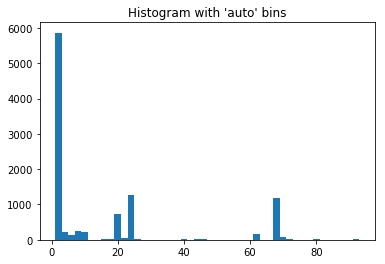

In [91]:
import matplotlib.pyplot as plt
rng = np.random.RandomState(10)  # deterministic random data
a = np.hstack((rng.normal(size=1000),
                rng.normal(loc=5, scale=2, size=1000)))
a = np.array([i for i in pagar_menos if i is not None and i > 0 and i < 100])
print max(a)
plt.hist(a, bins='auto')  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

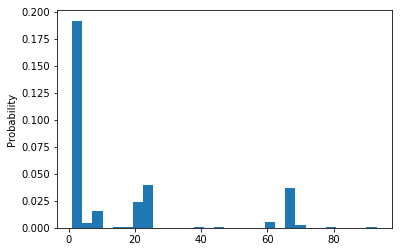

In [93]:
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline
#x = np.random.normal(size = 1000)
x = np.array([i for i in pagar_menos if i is not None and i > 0 and i < 100])
plt.hist(x, normed=True, bins=30)
plt.ylabel('Probability');

In [74]:
np.array([i for i in pagar_menos if i is not None])

array([0, 0, 0, ..., 0, 0, 0])

In [48]:
amdocs.select('msisdn', 'tnps_TNPS', 'ccc_Raw_Pagar_menos').show()

+---------+---------+-------------------+
|   msisdn|tnps_TNPS|ccc_Raw_Pagar_menos|
+---------+---------+-------------------+
|928725056|DETRACTOR|                  0|
|962931662| PROMOTER|                  0|
|694297550|DETRACTOR|               null|
|948418134| PROMOTER|                  0|
|943928924|  NEUTRAL|               null|
|626974561| PROMOTER|               null|
|695924606|DETRACTOR|                  0|
|698102549|  NEUTRAL|                  0|
|630385697| PROMOTER|                  0|
|987693492|DETRACTOR|               null|
|970580130| PROMOTER|                 23|
|602313279|DETRACTOR|                  0|
|980259512|DETRACTOR|                  0|
|942378536| PROMOTER|                  0|
|655184313| PROMOTER|                  0|
|699380386| PROMOTER|                  0|
|613631240|  NEUTRAL|                  0|
|929490145| PROMOTER|                  0|
|632036698| PROMOTER|                  0|
|623175929| PROMOTER|                  0|
+---------+---------+-------------

In [36]:
csv = df_to_csv(amdocs_ccc_sums_collected, amdocs_ccc_sums.columns, sep=',')
print csv

tnps_TNPS,sum(ccc_Raw_Pagar_menos),sum(ccc_Raw_Cobro),sum(ccc_Raw_Precios),sum(ccc_Raw_Averia_DSL),sum(ccc_Raw_Averia_Fibra),sum(ccc_Raw_Averia_TV),sum(ccc_Raw_Averia_Resto),sum(ccc_Raw_Averia_Neba),sum(ccc_Raw_Averia_Modem_Router),sum(ccc_Raw_Alta),sum(ccc_Raw_Desactivacion_BA_Movil_TV),sum(ccc_Raw_Desactivacion_TV),sum(ccc_Raw_Desactivacion_Movil),sum(ccc_Raw_Desactivacion_Total),sum(ccc_Raw_Desactivacion_NET),sum(ccc_Raw_Desactivacion_Fijo),sum(ccc_Raw_Desactivacion_USB),sum(ccc_Raw_Desactivacion_Resto),sum(ccc_Raw_Factura),sum(ccc_Raw_Ofrecimiento),sum(ccc_Bucket_Sub_Bucket_Churn_Cancellations_Other_churn_issues),sum(ccc_Bucket_Sub_Bucket_Churn_Cancellations_Churn_cancellations_process),sum(ccc_Bucket_Sub_Bucket_DSL_FIBER_incidences_and_support_FIBRA_support),sum(ccc_Bucket_Sub_Bucket_Product_and_Service_management_Standard_products),sum(ccc_Bucket_Sub_Bucket_Device_delivery_repair_Referrals),sum(ccc_Bucket_Sub_Bucket_Voice_and_mobile_data_incidences_and_support_Transfers),sum(ccc_

In [66]:
csv = df_to_csv(amdocs_ccc_sums_collected, amdocs_ccc_sums.columns, sep=',')
print csv

tnps_TNPS,sum(ccc_Raw_Pagar_menos),sum(ccc_Raw_Cobro),sum(ccc_Raw_Precios),sum(ccc_Raw_Averia_DSL),sum(ccc_Raw_Averia_Fibra),sum(ccc_Raw_Averia_TV),sum(ccc_Raw_Averia_Resto),sum(ccc_Raw_Averia_Neba),sum(ccc_Raw_Averia_Modem_Router),sum(ccc_Raw_Alta),sum(ccc_Raw_Desactivacion_BA_Movil_TV),sum(ccc_Raw_Desactivacion_TV),sum(ccc_Raw_Desactivacion_Movil),sum(ccc_Raw_Desactivacion_Total),sum(ccc_Raw_Desactivacion_NET),sum(ccc_Raw_Desactivacion_Fijo),sum(ccc_Raw_Desactivacion_USB),sum(ccc_Raw_Desactivacion_Resto),sum(ccc_Raw_Factura),sum(ccc_Raw_Ofrecimiento),sum(ccc_Bucket_Sub_Bucket_Churn_Cancellations_Other_churn_issues),sum(ccc_Bucket_Sub_Bucket_Churn_Cancellations_Churn_cancellations_process),sum(ccc_Bucket_Sub_Bucket_DSL_FIBER_incidences_and_support_FIBRA_support),sum(ccc_Bucket_Sub_Bucket_Product_and_Service_management_Standard_products),sum(ccc_Bucket_Sub_Bucket_Voice_and_mobile_data_incidences_and_support_Transfers),sum(ccc_Bucket_Sub_Bucket_Device_delivery_repair_Referrals),sum(ccc_

In [37]:
import re
amdocs_ccc_sums_prop = amdocs_ccc_sums
cols_to_rename = amdocs_ccc_sums.columns
for c in cols_to_rename:
    if c.startswith('sum('):
        #print c
        amdocs_ccc_sums_prop = amdocs_ccc_sums_prop.withColumn(c, 100*amdocs_ccc_sums_prop[c]/amdocs_ccc_sums_prop['count'])
        m = re.search('sum\((.*)\)', c)
        if m is not None:
            #print m.group(0), '->', m.group(1)
            amdocs_ccc_sums_prop = amdocs_ccc_sums_prop.withColumnRenamed(c, m.group(1))
amdocs_ccc_sums_prop_collected = amdocs_ccc_sums_prop.collect()
#amdocs_ccc_sums_prop.show()
display(HTML(tabulate.tabulate([amdocs_ccc_sums_prop.columns]+amdocs_ccc_sums_prop_collected, tablefmt='html', headers='firstrow')))

tnps_TNPS,ccc_Raw_Pagar_menos,ccc_Raw_Cobro,ccc_Raw_Precios,ccc_Raw_Averia_DSL,ccc_Raw_Averia_Fibra,ccc_Raw_Averia_TV,ccc_Raw_Averia_Resto,ccc_Raw_Averia_Neba,ccc_Raw_Averia_Modem_Router,ccc_Raw_Alta,ccc_Raw_Desactivacion_BA_Movil_TV,ccc_Raw_Desactivacion_TV,ccc_Raw_Desactivacion_Movil,ccc_Raw_Desactivacion_Total,ccc_Raw_Desactivacion_NET,ccc_Raw_Desactivacion_Fijo,ccc_Raw_Desactivacion_USB,ccc_Raw_Desactivacion_Resto,ccc_Raw_Factura,ccc_Raw_Ofrecimiento,ccc_Bucket_Sub_Bucket_Churn_Cancellations_Other_churn_issues,ccc_Bucket_Sub_Bucket_Churn_Cancellations_Churn_cancellations_process,ccc_Bucket_Sub_Bucket_DSL_FIBER_incidences_and_support_FIBRA_support,ccc_Bucket_Sub_Bucket_Product_and_Service_management_Standard_products,ccc_Bucket_Sub_Bucket_Device_delivery_repair_Referrals,ccc_Bucket_Sub_Bucket_Voice_and_mobile_data_incidences_and_support_Transfers,ccc_Bucket_Sub_Bucket_Billing___Postpaid_Billing___Postpaid,ccc_Bucket_Sub_Bucket_Other_customer_information_management_Customer_service_process,ccc_Bucket_Sub_Bucket_DSL_FIBER_incidences_and_support_TV,ccc_Bucket_Sub_Bucket_Churn_Cancellations_Debt_recovery,ccc_Bucket_Sub_Bucket_Collections_Referrals,ccc_Bucket_Sub_Bucket_Collections_Collections_process,ccc_Bucket_Sub_Bucket_Collections_Debt_recovery,ccc_Bucket_Sub_Bucket_New_adds_process_Prepaid_initial_balance,ccc_Bucket_Sub_Bucket_Voice_and_mobile_data_incidences_and_support_Voice,ccc_Bucket_Sub_Bucket_Tariff_management_TV,ccc_Bucket_Sub_Bucket_NA_NA,ccc_Bucket_Sub_Bucket_Other_customer_information_management_Referrals,ccc_Bucket_Sub_Bucket_Billing___Postpaid_ITV,ccc_Bucket_Sub_Bucket_Voice_and_mobile_data_incidences_and_support_Modem_Router_support,ccc_Bucket_Sub_Bucket_Other_customer_information_management_Contracted_products_DSL,ccc_Bucket_Sub_Bucket_Billing___Postpaid_Other_billing_issues,ccc_Bucket_Sub_Bucket_Churn_Cancellations_Collections_process,ccc_Bucket_Sub_Bucket_Other_customer_information_management_TV,ccc_Bucket_Sub_Bucket_Other_customer_information_management_Prepaid_initial_balance,ccc_Bucket_Sub_Bucket_Quick_Closing_Quick_Closing,ccc_Bucket_Sub_Bucket_Voice_and_mobile_data_incidences_and_support_Referrals,ccc_Bucket_Sub_Bucket_Tariff_management_Referrals,ccc_Bucket_Sub_Bucket_DSL_FIBER_incidences_and_support_FIBRA_incidences,ccc_Bucket_Sub_Bucket_DSL_FIBER_incidences_and_support_DSL_support,ccc_Bucket_Sub_Bucket_Device_upgrade_Simlock,ccc_Bucket_Sub_Bucket_Collections_Negotiation,ccc_Bucket_Sub_Bucket_Billing___Postpaid_Transfers,ccc_Bucket_Sub_Bucket_Other_customer_information_management_Data,ccc_Bucket_Sub_Bucket_New_adds_process_TV,ccc_Bucket_Sub_Bucket_Billing___Postpaid_Collections_process,ccc_Bucket_Sub_Bucket_Device_delivery_repair_Transfers,ccc_Bucket_Sub_Bucket_Product_and_Service_management_Billing_errors,ccc_Bucket_Sub_Bucket_Billing___Postpaid_Invoice_clarification,ccc_Bucket_Sub_Bucket_DSL_FIBER_incidences_and_support_Network,ccc_Bucket_Sub_Bucket_Prepaid_balance_Standard_products,ccc_Bucket_Sub_Bucket_Device_upgrade_Transfers,ccc_Bucket_Sub_Bucket_Product_and_Service_management_TV,ccc_Bucket_Sub_Bucket_Device_upgrade_TV,ccc_Bucket_Sub_Bucket_Vodafone_TV_Inteligente_Informacion,ccc_Bucket_Sub_Bucket_Product_and_Service_management_Network,ccc_Bucket_Sub_Bucket_Tariff_management_Voice_tariff,ccc_Bucket_Sub_Bucket_Device_upgrade_Device_delivery_repair,ccc_Bucket_Sub_Bucket_New_adds_process_Transfers,ccc_Bucket_Sub_Bucket_Device_delivery_repair_Device_repair,ccc_Bucket_Sub_Bucket_Device_delivery_repair_New_Adds,ccc_Bucket_Sub_Bucket_Other_customer_information_management_PIN_PUK,ccc_Bucket_Sub_Bucket_Product_and_Service_management_Prepaid_initial_balance,ccc_Bucket_Sub_Bucket_VF_NA,ccc_Bucket_Sub_Bucket_Other_customer_information_management_Device_repair,ccc_Bucket_Sub_Bucket_Tariff_management_Data,ccc_Bucket_Sub_Bucket_Collections_Transfers,ccc_Bucket_Sub_Bucket_Mod_Serv_No_Procede_Other_customer_information_management,ccc_Bucket_Sub_Bucket_Prepaid_balance_Top_up_process,ccc_Bucket_Sub_Bucket_Device_de

In [67]:
import re
amdocs_ccc_sums_prop = amdocs_ccc_sums
cols_to_rename = amdocs_ccc_sums.columns
for c in cols_to_rename:
    if c.startswith('sum('):
        #print c
        amdocs_ccc_sums_prop = amdocs_ccc_sums_prop.withColumn(c, 100*amdocs_ccc_sums_prop[c]/amdocs_ccc_sums_prop['count'])
        m = re.search('sum\((.*)\)', c)
        if m is not None:
            #print m.group(0), '->', m.group(1)
            amdocs_ccc_sums_prop = amdocs_ccc_sums_prop.withColumnRenamed(c, m.group(1))
amdocs_ccc_sums_prop_collected = amdocs_ccc_sums_prop.collect()
#amdocs_ccc_sums_prop.show()
display(HTML(tabulate.tabulate([amdocs_ccc_sums_prop.columns]+amdocs_ccc_sums_prop_collected, tablefmt='html', headers='firstrow')))

tnps_TNPS,ccc_Raw_Pagar_menos,ccc_Raw_Cobro,ccc_Raw_Precios,ccc_Raw_Averia_DSL,ccc_Raw_Averia_Fibra,ccc_Raw_Averia_TV,ccc_Raw_Averia_Resto,ccc_Raw_Averia_Neba,ccc_Raw_Averia_Modem_Router,ccc_Raw_Alta,ccc_Raw_Desactivacion_BA_Movil_TV,ccc_Raw_Desactivacion_TV,ccc_Raw_Desactivacion_Movil,ccc_Raw_Desactivacion_Total,ccc_Raw_Desactivacion_NET,ccc_Raw_Desactivacion_Fijo,ccc_Raw_Desactivacion_USB,ccc_Raw_Desactivacion_Resto,ccc_Raw_Factura,ccc_Raw_Ofrecimiento,ccc_Bucket_Sub_Bucket_Churn_Cancellations_Other_churn_issues,ccc_Bucket_Sub_Bucket_Churn_Cancellations_Churn_cancellations_process,ccc_Bucket_Sub_Bucket_DSL_FIBER_incidences_and_support_FIBRA_support,ccc_Bucket_Sub_Bucket_Product_and_Service_management_Standard_products,ccc_Bucket_Sub_Bucket_Voice_and_mobile_data_incidences_and_support_Transfers,ccc_Bucket_Sub_Bucket_Device_delivery_repair_Referrals,ccc_Bucket_Sub_Bucket_Billing___Postpaid_Billing___Postpaid,ccc_Bucket_Sub_Bucket_Other_customer_information_management_Customer_service_process,ccc_Bucket_Sub_Bucket_DSL_FIBER_incidences_and_support_TV,ccc_Bucket_Sub_Bucket_Churn_Cancellations_Debt_recovery,ccc_Bucket_Sub_Bucket_Collections_Referrals,ccc_Bucket_Sub_Bucket_Collections_Collections_process,ccc_Bucket_Sub_Bucket_Collections_Debt_recovery,ccc_Bucket_Sub_Bucket_New_adds_process_Prepaid_initial_balance,ccc_Bucket_Sub_Bucket_Voice_and_mobile_data_incidences_and_support_Voice,ccc_Bucket_Sub_Bucket_Tariff_management_TV,ccc_Bucket_Sub_Bucket_NA_NA,ccc_Bucket_Sub_Bucket_Other_customer_information_management_Referrals,ccc_Bucket_Sub_Bucket_Billing___Postpaid_ITV,ccc_Bucket_Sub_Bucket_Voice_and_mobile_data_incidences_and_support_Modem_Router_support,ccc_Bucket_Sub_Bucket_Other_customer_information_management_Contracted_products_DSL,ccc_Bucket_Sub_Bucket_Billing___Postpaid_Other_billing_issues,ccc_Bucket_Sub_Bucket_Churn_Cancellations_Collections_process,ccc_Bucket_Sub_Bucket_Other_customer_information_management_TV,ccc_Bucket_Sub_Bucket_Other_customer_information_management_Prepaid_initial_balance,ccc_Bucket_Sub_Bucket_Quick_Closing_Quick_Closing,ccc_Bucket_Sub_Bucket_Voice_and_mobile_data_incidences_and_support_Referrals,ccc_Bucket_Sub_Bucket_Tariff_management_Referrals,ccc_Bucket_Sub_Bucket_DSL_FIBER_incidences_and_support_FIBRA_incidences,ccc_Bucket_Sub_Bucket_DSL_FIBER_incidences_and_support_DSL_support,ccc_Bucket_Sub_Bucket_Device_upgrade_Simlock,ccc_Bucket_Sub_Bucket_Collections_Negotiation,ccc_Bucket_Sub_Bucket_Billing___Postpaid_Transfers,ccc_Bucket_Sub_Bucket_Other_customer_information_management_Data,ccc_Bucket_Sub_Bucket_New_adds_process_TV,ccc_Bucket_Sub_Bucket_Billing___Postpaid_Collections_process,ccc_Bucket_Sub_Bucket_Device_delivery_repair_Transfers,ccc_Bucket_Sub_Bucket_Product_and_Service_management_Billing_errors,ccc_Bucket_Sub_Bucket_Billing___Postpaid_Invoice_clarification,ccc_Bucket_Sub_Bucket_DSL_FIBER_incidences_and_support_Network,ccc_Bucket_Sub_Bucket_Prepaid_balance_Standard_products,ccc_Bucket_Sub_Bucket_Device_upgrade_Transfers,ccc_Bucket_Sub_Bucket_Product_and_Service_management_TV,ccc_Bucket_Sub_Bucket_Device_upgrade_TV,ccc_Bucket_Sub_Bucket_Vodafone_TV_Inteligente_Informacion,ccc_Bucket_Sub_Bucket_Product_and_Service_management_Network,ccc_Bucket_Sub_Bucket_Tariff_management_Voice_tariff,ccc_Bucket_Sub_Bucket_Device_upgrade_Device_delivery_repair,ccc_Bucket_Sub_Bucket_New_adds_process_Transfers,ccc_Bucket_Sub_Bucket_Device_delivery_repair_Device_repair,ccc_Bucket_Sub_Bucket_Device_delivery_repair_New_Adds,ccc_Bucket_Sub_Bucket_Other_customer_information_management_PIN_PUK,ccc_Bucket_Sub_Bucket_Product_and_Service_management_Prepaid_initial_balance,ccc_Bucket_Sub_Bucket_VF_NA,ccc_Bucket_Sub_Bucket_Other_customer_information_management_Device_repair,ccc_Bucket_Sub_Bucket_Tariff_management_Data,ccc_Bucket_Sub_Bucket_Collections_Transfers,ccc_Bucket_Sub_Bucket_Mod_Serv_No_Procede_Other_customer_information_management,ccc_Bucket_Sub_Bucket_Prepaid_balance_Top_up_process,ccc_Bucket_Sub_Bucket_Device_de

In [39]:
data_penalties_ori = spark.read.table("raw_es.cvm_customerpenal")
#data_penalties_ori = spark.read.load("/data/raw/vf_es/cvm/CUSTOMERPENAL/1.0/parquet/")

In [42]:
amdocs_201805.where('nif_cliente = "00003061H"').select('nif_cliente', 'num_cliente', 'msisdn', 'CAMPO1', 'CAMPO2', 'CAMPO3', 'OBJID').show()

+-----------+-----------+------+------+------+------+-----+
|nif_cliente|num_cliente|msisdn|CAMPO1|CAMPO2|CAMPO3|OBJID|
+-----------+-----------+------+------+------+------+-----+
+-----------+-----------+------+------+------+------+-----+



In [45]:
tnps_preds = spark.read.table('tests_es.tnps_preds')
#tnps_preds.printSchema()
tmp = amdocs_201805.withColumnRenamed('nif_cliente', 'nif').join(tnps_preds, 'nif', 'inner')
tmp.select('nif', 'num_cliente', 'msisdn', 'CAMPO1', 'CAMPO2', 'CAMPO3', 'OBJID').show(10)

+---------+-----------+---------------+---------+---------------+---------+---------+
|      nif|num_cliente|         msisdn|   CAMPO1|         CAMPO2|   CAMPO3|    OBJID|
+---------+-----------+---------------+---------+---------------+---------+---------+
|00016910J|  989122249|B4200040W23H20W|963619071|B4200044E92F90C|500037640|500037640|
|00016910J|  989122249|      994008312|963619071|      971901951|298531761|298531761|
|00016910J|  989122249|   AC229322965T|963619071|   AC220501285E|651837274|651837274|
|00097701V|  892798802|      692159147|444154391|      600364142|601772781|601772781|
|00097701V|  892798802|      963839853|444154391|      912806040|346417095|346417095|
|00097701V|  892798802|   AC2262774532|444154391|   AC2205011350|642115080|642115080|
|00120416L|  009230996|   DC535O89R693|282318500|   DC537C97C769|629967292|629967292|
|00120416L|  009230996|      977171159|282318500|      949217855|630426465|630426465|
|00129308C|  840480483|      815716329|952561072|     

In [102]:
spark.stop()

In [101]:
import gc
gc.collect()

0

In [111]:
if '/var/SP/data/home/bbergua/fy17.capsule/customer_experience/src/main/python' not in sys.path:
    print 'Adding [...]/convergence/src/main/python to sys.path'
    sys.path.append('/var/SP/data/home/bbergua/fy17.capsule/customer_experience/src/main/python')
from DP_NPS_TNPS import DPNpsTnps
from DP_Call_Centre_Calls import DPCallCentreCalls

ClosingDay  = '20180531'
StartingDay = '20180301'

print('Getting Call Centre Calls Information...')
ccc = DPCallCentreCalls(spark, ClosingDay[:6], False)
ccc.generateFeaturesByMsisdn(ClosingDay,StartingDay)
ccc.pivoted_by_msisdn.cache()

print 'CCC count ', ccc.pivoted_by_msisdn.count()
print 'CCC msisdn', ccc.pivoted_by_msisdn.select('msisdn').distinct().count()

Getting Call Centre Calls Information...
CCC count  4213579
CCC msisdn 3282628


In [112]:
if '/var/SP/data/home/bbergua/fy17.capsule/customer_experience/src/main/python' not in sys.path:
    print 'Adding [...]/convergence/src/main/python to sys.path'
    sys.path.append('/var/SP/data/home/bbergua/fy17.capsule/customer_experience/src/main/python')
from DP_NPS_TNPS import DPNpsTnps
from DP_Call_Centre_Calls import DPCallCentreCalls

ClosingDay  = '20180531'
StartingDay = '20180301'

print('Getting Call Centre Calls Information...')
ccc = DPCallCentreCalls(spark, ClosingDay[:6], False)
ccc.generateFeaturesByMsisdn(ClosingDay,StartingDay)
ccc.pivoted_by_msisdn.cache()

print 'CCC count ', ccc.pivoted_by_msisdn.count()
print 'CCC msisdn', ccc.pivoted_by_msisdn.select('msisdn').distinct().count()

Getting Call Centre Calls Information...
CCC count  3282628
CCC msisdn 3282628


In [113]:
if '/var/SP/data/home/bbergua/fy17.capsule/customer_experience/src/main/python' not in sys.path:
    print 'Adding [...]/convergence/src/main/python to sys.path'
    sys.path.append('/var/SP/data/home/bbergua/fy17.capsule/customer_experience/src/main/python')
from DP_NPS_TNPS import DPNpsTnps
from DP_Call_Centre_Calls import DPCallCentreCalls

ClosingDay  = '20180531'
StartingDay = '20180301'

print('Getting TNPS Information...')
nps_tnps = DPNpsTnps(spark, ClosingDay[:6])
nps_tnps.generateTNPSByMsisdn(ClosingDay,StartingDay)
nps_tnps.tnps_by_msisdn.cache()

print 'TNPS count ', nps_tnps.tnps_by_msisdn.count()
print 'TNPS msisdn', nps_tnps.tnps_by_msisdn.select('msisdn').distinct().count()

Getting TNPS Information...
CCC count  2289888
CCC msisdn 2003204


In [114]:
if '/var/SP/data/home/bbergua/fy17.capsule/customer_experience/src/main/python' not in sys.path:
    print 'Adding [...]/convergence/src/main/python to sys.path'
    sys.path.append('/var/SP/data/home/bbergua/fy17.capsule/customer_experience/src/main/python')
from DP_NPS_TNPS import DPNpsTnps
from DP_Call_Centre_Calls import DPCallCentreCalls

ClosingDay  = '20180531'
StartingDay = '20180301'

print('Getting TNPS Information...')
nps_tnps = DPNpsTnps(spark, ClosingDay[:6])
nps_tnps.generateTNPSByMsisdn(ClosingDay,StartingDay)
nps_tnps.tnps_by_msisdn.cache()

print 'TNPS count ', nps_tnps.tnps_by_msisdn.count()
print 'TNPS msisdn', nps_tnps.tnps_by_msisdn.select('msisdn').distinct().count()

Getting TNPS Information...
TNPS count  2003204
TNPS msisdn 2003204


In [166]:
import os
#print os.path.realpath(__file__)
#print os.path.abspath(__file__)
#print os.path.dirname(os.path.abspath(__file__))
print os.getcwd()

/var/SP/data/home/bbergua


In [ ]:
#tipis = spark.read.csv('file://'+os.getcwd()+'/amdocs_informational_dataset/engine/Agrup_Buckets_unific.txt',header=True)
tipis = sc.textFile('file://'+os.getcwd()+'/amdocs_informational_dataset/engine/Agrup_Buckets_unific.txt')
tipis.count()
#tipis.foreach(println)
#tipis.map(lambda l: l.split(";")).collect()
#tipis.flatMap(lambda l: l.split(";")).collect()

In [174]:
import csv
with open(os.getcwd()+'/amdocs_informational_dataset/engine/Agrup_Buckets_unific.txt') as f:
    reader = csv.reader(f, delimiter='\t')
    data_raw = [r for r in reader]
    #data = [r for r in reader if len(r) == 7]
    header = data.pop(0) # remove header
    data = [r for r in data_raw if len(r) == len(header)]
print len(data_raw)
print header
#data
n = 1
for i in data_raw:
    if len(i) != len(header):
        print n, ':', len(i), ':', i
    n = n+1
    
#data = [r for r in data_raw if len(r) == len(header)]
print len(data)
n = 1
for i in data:
    if len(i) != len(header):
        print n, ':', len(i), ':', i
    n = n+1

153856
['Factura', 'Abono', 'Abono no realizado', 'Informacion', 'Billing - Postpaid', 'Invoice clarification', 'ONO']
99301 : 3 : ['Productos/Servicios', 'Mi vodafone', 'Asesoramiento']
99302 : 1 : ['Accesos/contrase\xf1a']
99303 : 1 : ['n/a']
99304 : 1 : ['Accesos/contrase\xf1a']
99305 : 1 : ['Tienda puntos']
99306 : 1 : ['Contenidos']
99307 : 1 : ['Accesos/contrase\xf1a']
99308 : 5 : ['Asesoramiento', 'Informar', 'Product and Service management', 'Standard products', 'VF']
99333 : 11 : ['Productos/Servicios', 'Mi vodafone', 'Control de consumo web', 'n/a cierre rapido/transferencia', 'Product and Service managemeProductos/Servicios', 'Mi vodafone', 'Renovacion terminal', 'Mod.Serv.No Procede', 'Product and Service management', 'Contracted products', 'VF']
122931 : 1 : ['SAT']
122932 : 1 : ['Bajas/Porta Saliente']
122933 : 1 : ['Red/Asistencia Tecnica']
124308 : 4 : ['Tarifas', 'Datos movil', 'Internet en el movil', 'Ajuste']
124309 : 4 : ['Informar', 'Tariff management', 'Data tarif

In [176]:
import csv
with open(os.getcwd()+'/amdocs_informational_dataset/engine/Agrup_Buckets_unific 2.txt') as f:
    reader = csv.reader(f, delimiter=';')
    data_raw = [r for r in reader]
    #data = [r for r in reader if len(r) == 7]
    header = data_raw.pop(0) # remove header
    data = [r for r in data_raw if len(r) == len(header)]
print len(data_raw)
print header
#data
n = 1
for i in data_raw:
    if len(i) != len(header):
        print 'fila', n, ', num elems =', len(i), ':', i
    n = n+1
    
#data = [r for r in data_raw if len(r) == len(header)]
print len(data)
n = 1
for i in data:
    if len(i) != len(header):
        print 'fila', n, ', num elems =', len(i), ':', i
    n = n+1

121964
['INT_Tipo', 'INT_Subtipo', 'INT_Razon', 'INT_Resultado', 'Bucket', 'Sub_Bucket', 'Stack']
fila 80076 , num elems = 3 : ['Productos/Servicios', 'Mi vodafone', 'Asesoramiento']
fila 80077 , num elems = 1 : ['Accesos/contrase\xf1a']
fila 80078 , num elems = 1 : ['n/a']
fila 80079 , num elems = 1 : ['Accesos/contrase\xf1a']
fila 80080 , num elems = 1 : ['Tienda puntos']
fila 80081 , num elems = 1 : ['Contenidos']
fila 80082 , num elems = 1 : ['Accesos/contrase\xf1a']
fila 80083 , num elems = 5 : ['Asesoramiento', 'Informar', 'Product and Service management', 'Standard products', '']
fila 80101 , num elems = 11 : ['Productos/Servicios', 'Mi vodafone', 'Contenidos', 'IPCMC', 'ProductProductos/Servicios', 'Mi vodafone', 'Contenidos', 'Seguimiento caso subcaso', 'Product and Service management', 'Standard products', '']
fila 80102 , num elems = 2 : ['ucts', '']
fila 80136 , num elems = 11 : ['Productos/Servicios', 'Movil Voz', 'Beneficio llamadas familia', 'Escalo', 'Product and Servic

In [161]:
tipis = spark.createDataFrame(data, header)
print tipis.count()
tipis.show()

153841
+--------------------+--------------------+--------------------+--------------+--------------------+--------------------+-----+
|            INT_Tipo|         INT_Subtipo|           INT_Razon| INT_Resultado|              Bucket|          Sub_Bucket|Stack|
+--------------------+--------------------+--------------------+--------------+--------------------+--------------------+-----+
|            INT_Tipo|         INT_Subtipo|           INT_Razon| INT_Resultado|              Bucket|          Sub_Bucket|Stack|
|             Factura|               Abono|  Abono no realizado|   Informacion|  Billing - Postpaid|Invoice clarifica...|  ONO|
|        Cobros/Pagos|               Deuda|   No reconoce deuda|   Informacion|         Collections| Collections process|  ONO|
| Productos/Servicios|             Paquete|Condiciones gener...| Ayudo cliente|Product and Servi...|   Standard products|  ONO|
| Productos/Servicios|             Paquete|Condiciones gener...|   Informacion|Product and Servi.